In [ ]:

import pandas as pd

file_path = '/content/Accident _Dataset (1) (2).xlsx'

# Read the Excel file into a pandas DataFrame
df = pd.read_excel(file_path)
print(df.head())
print(df.info())

       Time Day_of_week Age_band_of_driver Sex_of_driver   Educational_level  \
0  17:02:00      Monday              18-30          Male   Above high school   
1  17:02:00      Monday              31-50          Male  Junior high school   
2  17:02:00      Monday              18-30          Male  Junior high school   
3  01:06:00      Sunday              18-30          Male  Junior high school   
4  01:06:00      Sunday              18-30          Male  Junior high school   

  Vehicle_driver_relation Driving_experience      Type_of_vehicle  \
0                Employee              1-2yr           Automobile   
1                Employee         Above 10yr  Public (> 45 seats)   
2                Employee              1-2yr      Lorry (41?100Q)   
3                Employee             5-10yr  Public (> 45 seats)   
4                Employee              2-5yr                  NaN   

  Owner_of_vehicle Service_year_of_vehicle  ... Vehicle_movement  \
0            Owner              Abov

In [ ]:
missing_values = df.isnull().sum().sort_values(ascending=False)
missing_percentage = (df.isnull().sum() / len(df)) * 100
missing_table = pd.concat([missing_values, missing_percentage], axis=1, keys=['Total Missing', 'Percentage'])


# Data cleaning
The code below will clean each row , checking for nulls, standardizing values based on existing column values and then cleaning them accrodingly

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer


In [ ]:
duplicates = df.duplicated().sum()
print(f"Number of duplicate rows: {duplicates}")

# Remove duplicates if any
if duplicates > 0:
    df = df.drop_duplicates()
    print("Duplicates removed.")


Number of duplicate rows: 0


In [ ]:
print(df['Time'].unique())


[datetime.time(17, 2) datetime.time(1, 6) datetime.time(14, 15) ...
 datetime.time(19, 18) datetime.time(2, 47) nan]


In [ ]:
# Convert to datetime.time
df['Time'] = pd.to_datetime(df['Time'], format='%H:%M:%S', errors='coerce').dt.time

# Check for conversion issues
missing_time = df['Time'].isnull().sum()
print(f"Missing or invalid Time entries: {missing_time}")


Missing or invalid Time entries: 1


In [ ]:
df = df.dropna(subset=['Time'])
print(f"Rows after dropping missing Time: {df.shape[0]}")


Rows after dropping missing Time: 12316


In [ ]:
# Extract hour
df['Hour'] = pd.to_datetime(df['Time'], format='%H:%M:%S', errors='coerce').dt.hour

# Define part of day
def categorize_part_of_day(hour):
    if 5 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 17:
        return 'Afternoon'
    elif 17 <= hour < 21:
        return 'Evening'
    else:
        return 'Night'

df['Part_of_day'] = df['Hour'].apply(categorize_part_of_day)


In [ ]:
print(df['Day_of_week'].unique())


['Monday' 'Sunday' 'Friday' 'Wednesday' 'Saturday' 'Thursday' 'Tuesday']


In [ ]:
missing = df['Day_of_week'].isnull().sum()
print(f"Missing values in 'Day_of_week': {missing}")

Missing values in 'Day_of_week': 0


In [ ]:
print(df['Age_band_of_driver'].unique())


['18-30' '31-50' 'Under 18' 'Over 51' 'Unknown']


In [ ]:
missing = df['Age_band_of_driver'].isnull().sum()
print(f"Missing values in 'Age_band_of_driver': {missing}")

Missing values in 'Age_band_of_driver': 0


In [ ]:
print(df['Sex_of_driver'].unique())


['Male' 'Female' 'Unknown']


In [ ]:
missing = df['Sex_of_driver'].isnull().sum()
print(f"Missing values in 'Sex_of_driver': {missing}")

Missing values in 'Sex_of_driver': 0


In [ ]:
print(df['Educational_level'].unique())


['Above high school' 'Junior high school' nan 'Elementary school'
 'High school' 'Unknown' 'Illiterate' 'Writing & reading']


In [ ]:
df['Educational_level'] = df['Educational_level'].str.strip().str.title()

# Handle known variations and typos
df['Educational_level'] = df['Educational_level'].replace({
    'Elementary school': 'Primary School',
    'Writing & Reading': 'Illiterate',

})


In [ ]:
df['Educational_level'].unique()

array(['Above High School', 'Junior High School', nan,
       'Elementary School', 'High School', 'Unknown', 'Illiterate'],
      dtype=object)

In [ ]:
missing = df['Educational_level'].isnull().sum()
print(f"Missing values in 'Educational_level': {missing}")

Missing values in 'Educational_level': 741


In [ ]:
df['Educational_level'] = df['Educational_level'].fillna('Unknown')

In [ ]:
unique_edu = df['Educational_level'].unique()
print(f"Unique Educational_level entries: {unique_edu}")


Unique Educational_level entries: ['Above High School' 'Junior High School' 'Unknown' 'Elementary School'
 'High School' 'Illiterate']


In [ ]:
print(df['Vehicle_driver_relation'].unique())


['Employee' 'Unknown' 'Owner' nan 'Other']


In [ ]:
missing = df['Vehicle_driver_relation'].isnull().sum()
print(f"Missing values in 'Vehicle_driver_relation': {missing}")

Missing values in 'Vehicle_driver_relation': 579


In [ ]:
df['Vehicle_driver_relation'] = df['Vehicle_driver_relation'].fillna('Unknown')

In [ ]:
unique_relation = df['Vehicle_driver_relation'].unique()
print(f"Unique Vehicle_driver_relation entries: {unique_relation}")


Unique Vehicle_driver_relation entries: ['Employee' 'Unknown' 'Owner' 'Other']


In [ ]:
print(df['Driving_experience'].unique())


['1-2yr' 'Above 10yr' '5-10yr' '2-5yr' nan 'No Licence' 'Below 1yr'
 'unknown']


In [ ]:
missing = df['Driving_experience'].isnull().sum()
print(f"Missing values in 'Driving_experience': {missing}")

Missing values in 'Driving_experience': 829


In [ ]:
df['Driving_experience'] = df['Driving_experience'].fillna('Unknown')

In [ ]:
unique_exp = df['Driving_experience'].unique()
print(f"Unique Driving_experience entries: {unique_exp}")


Unique Driving_experience entries: ['1-2yr' 'Above 10yr' '5-10yr' '2-5yr' 'Unknown' 'No Licence' 'Below 1yr'
 'unknown']


In [ ]:
print(df['Type_of_vehicle'].unique())


['Automobile' 'Public (> 45 seats)' 'Lorry (41?100Q)' nan
 'Public (13?45 seats)' 'Lorry (11?40Q)' 'Long lorry' 'Public (12 seats)'
 'Taxi' 'Pick up upto 10Q' 'Stationwagen' 'Ridden horse' 'Other' 'Bajaj'
 'Turbo' 'Motorcycle' 'Special vehicle' 'Bicycle']


In [ ]:
# Define the mapping dictionary
vehicle_mapping = {
    'Automobile': 'Car',
    'Public (> 45 seats)': 'Public Transport',
    'Public (13?45 seats)': 'Public Transport',
    'Public (12 seats)': 'Public Transport',
    'Taxi': 'Taxi',
    'Lorry (41?100Q)': 'Lorry',
    'Lorry (11?40Q)': 'Lorry',
    'Long lorry': 'Lorry',
    'Pick up upto 10Q': 'Pickup Truck',
    'Stationwagen': 'Car',
    'Turbo': 'Car',
    'Motorcycle': 'Motorcycle',
    'Bajaj': 'Motorcycle',
    'Special vehicle': 'Special Vehicle',
    'Bicycle': 'Bicycle',
    'Ridden horse': 'Other',
    'Other': 'Other'
}


In [ ]:
# Apply the mapping
df['Type_of_vehicle_standardized'] = df['Type_of_vehicle'].map(vehicle_mapping)

# Handle missing values by assigning 'Unknown'
df['Type_of_vehicle_standardized'] = df['Type_of_vehicle_standardized'].fillna('Unknown')

# Display unique values after mapping
print("Unique Type_of_vehicle after mapping:")
print(df['Type_of_vehicle_standardized'].unique())


Unique Type_of_vehicle after mapping:
['Car' 'Public Transport' 'Lorry' 'Unknown' 'Taxi' 'Pickup Truck' 'Other'
 'Motorcycle' 'Special Vehicle' 'Bicycle']


In [ ]:
print(df['Owner_of_vehicle'].unique())


['Owner' 'Governmental' nan 'Organization' 'Other']


In [ ]:
df['Owner_of_vehicle'] = df['Owner_of_vehicle'].fillna('Unknown')

In [ ]:
unique_owner = df['Owner_of_vehicle'].unique()
print(f"Unique Owner_of_vehicle entries: {unique_owner}")


Unique Owner_of_vehicle entries: ['Owner' 'Governmental' 'Unknown' 'Organization' 'Other']


In [ ]:
print(df['Service_year_of_vehicle'].unique())


['Above 10yr' '5-10yrs' nan '1-2yr' '2-5yrs' 'Unknown' 'Below 1yr']


In [ ]:
df['Service_year_of_vehicle'] = df['Service_year_of_vehicle'].fillna('Unknown')

In [ ]:
unique_service_years = df['Service_year_of_vehicle'].unique()
print(f"Unique Service_year_of_vehicle entries: {unique_service_years}")


Unique Service_year_of_vehicle entries: ['Above 10yr' '5-10yrs' 'Unknown' '1-2yr' '2-5yrs' 'Below 1yr']


In [ ]:
print(df['Defect_of_vehicle'].unique())


['No defect' nan '7' '5']


In [ ]:
missing = df['Defect_of_vehicle'].isnull().sum()
print(f"Missing values in 'Defect_of_vehicle': {missing}")

Missing values in 'Defect_of_vehicle': 4427


In [ ]:
df['Defect_of_vehicle'] = df['Defect_of_vehicle'].fillna('Unknown')

In [ ]:
unique_defects = df['Defect_of_vehicle'].unique()
print(f"Unique Defect_of_vehicle entries: {unique_defects}")


Unique Defect_of_vehicle entries: ['No defect' 'Unknown' '7' '5']


In [ ]:
print(df['Area_accident_occured'].unique())


['Residential areas' 'Office areas' '  Recreational areas'
 ' Industrial areas' nan 'Other' ' Church areas' '  Market areas'
 'Unknown' 'Rural village areas' ' Outside rural areas' ' Hospital areas'
 'School areas' 'Rural village areasOffice areas' 'Recreational areas']


In [ ]:
df['Area_accident_occured'] = df['Area_accident_occured'].str.strip()


In [ ]:
# Define the mapping dictionary
area_mapping = {
    'Residential areas': 'Residential',
    'Office areas': 'Commercial',
    'Recreational areas': 'Recreational',
    'Industrial areas': 'Industrial',
    'Church areas': 'Religious',
    'Market areas': 'Commercial',
    'Rural Village areas': 'Rural',
    'Outside rural areas': 'Rural',
    'Hospital areas': 'Healthcare',
    'School areas': 'Educational',
    'Other': 'Other',
    'Unknown': 'Unknown',
    'Rural village areasOffice areas': 'Rural',  # Already handled above
    'Recreational areas': 'Recreational',  # Consistent mapping
    '': 'Unknown'  # Handle empty strings if any
}


In [ ]:
# Apply the mapping to create a new standardized column
df['Area_accident_occured_standardized'] = df['Area_accident_occured'].map(area_mapping)

# Handle any unmapped categories by assigning 'Other' or 'Unknown'
df['Area_accident_occured_standardized'] = df['Area_accident_occured_standardized'].fillna('Other')


In [ ]:
print("Unique Area_accident_occured after mapping:")
print(df['Area_accident_occured_standardized'].unique())


Unique Area_accident_occured after mapping:
['Residential' 'Commercial' 'Recreational' 'Industrial' 'Other'
 'Religious' 'Unknown' 'Rural' 'Healthcare' 'Educational']


In [ ]:
print(df['Lanes_or_Medians'].unique())


[nan 'Undivided Two way' 'other' 'Double carriageway (median)' 'One way'
 'Two-way (divided with solid lines road marking)'
 'Two-way (divided with broken lines road marking)' 'Unknown']


In [ ]:
missing = df['Lanes_or_Medians'].isnull().sum()
print(f"Missing values in 'Lanes_or_Medians': {missing}")

Missing values in 'Lanes_or_Medians': 385


In [ ]:
df['Lanes_or_Medians'] = df['Lanes_or_Medians'].fillna('Unknown')

In [ ]:
print(df['Road_allignment'].unique())


['Tangent road with flat terrain' nan
 'Tangent road with mild grade and flat terrain' 'Escarpments'
 'Tangent road with rolling terrain' 'Gentle horizontal curve'
 'Tangent road with mountainous terrain and'
 'Steep grade downward with mountainous terrain' 'Sharp reverse curve'
 'Steep grade upward with mountainous terrain']


In [ ]:
missing = df['Road_allignment'].isnull().sum()
print(f"Missing values in 'Road_allignment': {missing}")

Missing values in 'Road_allignment': 142


In [ ]:
df['Road_allignment'] = df['Road_allignment'].fillna('Unknown')

In [ ]:

df['Types_of_Junction'] = df['Types_of_Junction'].fillna('Unknown')

['No junction' 'Y Shape' 'Crossing' 'O Shape' 'Other' 'Unknown' 'T Shape'
 'X Shape' nan]


In [ ]:
print(df['Types_of_Junction'].unique())

['No junction' 'Y Shape' 'Crossing' 'O Shape' 'Other' 'Unknown' 'T Shape'
 'X Shape']


In [ ]:
print(df['Road_surface_type'].unique())


['Asphalt roads' 'Earth roads' nan 'Asphalt roads with some distress'
 'Gravel roads' 'Other']


In [ ]:
df['Road_surface_type'] = df['Road_surface_type'].fillna('Unknown')

In [ ]:
print(df['Road_surface_conditions'].unique())


['Dry' 'Wet or damp' 'Snow' 'Flood over 3cm. deep']


In [ ]:
df['Road_surface_conditions'] = df['Road_surface_conditions'].replace({
    'Wet Damp': 'Wet or Damp',
    'Flood over 3cm. deep': 'Flooded',

})

In [ ]:
missing = df['Road_surface_conditions'].isnull().sum()
print(f"Missing values in 'Road_surface_conditions': {missing}")


Missing values in 'Road_surface_conditions': 0


In [ ]:
print(df['Light_conditions'].unique())


['Daylight' 'Darkness - lights lit' 'Darkness - no lighting'
 'Darkness - lights unlit']


In [ ]:
print(df['Weather_conditions'].unique())


['Normal' 'Raining' 'Raining and Windy' 'Cloudy' 'Other' 'Windy' 'Snow'
 'Unknown' 'Fog or mist']


In [ ]:
print(df['Type_of_collision'].unique())


['Collision with roadside-parked vehicles'
 'Vehicle with vehicle collision' 'Collision with roadside objects'
 'Collision with animals' 'Other' 'Rollover' 'Fall from vehicles'
 'Collision with pedestrians' 'With Train' 'Unknown' nan]


In [ ]:
print(df['Number_of_vehicles_involved'].unique())
print(df['Number_of_vehicles_involved'].dtype)


[2. 1. 3. 6. 4. 7.]
float64


In [ ]:
missing = df['Number_of_vehicles_involved'].isnull().sum()
print(f"Missing values in 'Number_of_vehicles_involved': {missing}")

# Impute with median
imputer = SimpleImputer(strategy='median')
df['Number_of_vehicles_involved'] = imputer.fit_transform(df[['Number_of_vehicles_involved']])


Missing values in 'Number_of_vehicles_involved': 0


In [ ]:
print(df['Number_of_casualties'].unique())
print(df['Number_of_casualties'].dtype)


[2. 1. 3. 4. 6. 5. 8. 7.]
float64


In [ ]:
print(df['Vehicle_movement'].unique())


['Going straight' 'U-Turn' 'Moving Backward' 'Turnover' 'Waiting to go'
 'Getting off' 'Reversing' 'Unknown' 'Parked' 'Stopping' 'Overtaking'
 'Other' 'Entering a junction' nan]


In [ ]:
# Define the mapping dictionary
movement_mapping = {
    'Going straight': 'Straight',
    'U-Turn': 'Turning',
    'Entering A Junction': 'Turning',
    'Overtaking': 'Overtaking',
    'Moving Backward': 'Reversing',
    'Reversing': 'Reversing',
    'Waiting To Go': 'Stopped',
    'Getting Off': 'Stopped',
    'Parked': 'Stopped',
    'Stopping': 'Stopping',
    'Other': 'Other',
    'Unknown': 'Unknown'
}


In [ ]:
# Apply the mapping to create a new standardized column
df['Vehicle_movement_standardized'] = df['Vehicle_movement'].map(movement_mapping)

# Handle any unmapped categories by assigning 'Other'
df['Vehicle_movement_standardized'] = df['Vehicle_movement_standardized'].fillna('Other')


In [ ]:
print("Unique Vehicle_movement after mapping:")
print(df['Vehicle_movement_standardized'].unique())


Unique Vehicle_movement after mapping:
['Straight' 'Turning' 'Reversing' 'Other' 'Unknown' 'Stopped' 'Stopping'
 'Overtaking']


In [ ]:
print(df['Casualty_class'].unique())


['na' 'Driver or rider' 'Pedestrian' 'Passenger']


In [ ]:
print(df['Sex_of_casualty'].unique())


['na' 'Male' 'Female']


In [ ]:
print(df['Age_band_of_casualty'].unique())


['na' '31-50' '18-30' 'Under 18' 'Over 51' '5']


In [ ]:
print(df['Casualty_severity'].unique())


['na' '3' '2' '1']


In [ ]:
print(df['Work_of_casuality'].unique())


[nan 'Driver' 'Other' 'Unemployed' 'Employee' 'Self-employed' 'Student'
 'Unknown']


In [ ]:
print(df['Fitness_of_casuality'].unique())


[nan 'Normal' 'Deaf' 'Other' 'Blind' 'NormalNormal']


In [ ]:
df['Fitness_of_casuality'] = df['Fitness_of_casuality'].replace({
    'NormalNormal': 'Normal',


})

In [ ]:
print(df['Pedestrian_movement'].unique())


['Not a Pedestrian' "Crossing from driver's nearside"
 'Crossing from nearside - masked by parked or statioNot a Pedestrianry vehicle'
 'Unknown or other'
 'Crossing from offside - masked by  parked or statioNot a Pedestrianry vehicle'
 'In carriageway, statioNot a Pedestrianry - not crossing  (standing or playing)'
 'Walking along in carriageway, back to traffic'
 'Walking along in carriageway, facing traffic'
 'In carriageway, statioNot a Pedestrianry - not crossing  (standing or playing) - masked by parked or statioNot a Pedestrianry vehicle']


In [ ]:
df['Pedestrian_movement'].unique()

array(['Not A Pedestrian', "Crossing From Driver'S Nearside",
       'Crossing From Nearside - Masked By Parked Or Stationot A Pedestrianry Vehicle',
       'Unknown Or Other',
       'Crossing From Offside - Masked By  Parked Or Stationot A Pedestrianry Vehicle',
       'In Carriageway, Stationot A Pedestrianry - Not Crossing  (Standing Or Playing)',
       'Walking Along In Carriageway, Back To Traffic',
       'Walking Along In Carriageway, Facing Traffic',
       'In Carriageway, Stationot A Pedestrianry - Not Crossing  (Standing Or Playing) - Masked By Parked Or Stationot A Pedestrianry Vehicle'],
      dtype=object)

In [ ]:
# Correct known typos and variations
df['Pedestrian_movement'] = df['Pedestrian_movement'].replace({
    "StatioNot A Pedestrianry": "Stationary",  # Correcting 'statioNot a Pedestrianry' typo
    "StatioNot A Pedestrianry - Not Crossing  (Standing Or Playing)": "Stationary",
    "StatioNot A Pedestrianry - Not Crossing  (Standing Or Playing) - Masked By Parked Or Stationary Vehicle": "Stationary",
    "Not A Pedestrian": "Not a Pedestrian",
    "Unknown Or Other": "Unknown",
    "Nan": "Unknown",
    # Add more corrections as identified
})



In [ ]:
# Convert to string, strip leading/trailing whitespaces, and standardize capitalization
df['Pedestrian_movement'] = df['Pedestrian_movement'].astype(str).str.strip().str.title()


In [ ]:
df['Pedestrian_movement'].unique()

array(['Not A Pedestrian', "Crossing From Driver'S Nearside",
       'Crossing From Nearside - Masked By Parked Or Stationot A Pedestrianry Vehicle',
       'Unknown',
       'Crossing From Offside - Masked By  Parked Or Stationot A Pedestrianry Vehicle',
       'In Carriageway, Stationot A Pedestrianry - Not Crossing  (Standing Or Playing)',
       'Walking Along In Carriageway, Back To Traffic',
       'Walking Along In Carriageway, Facing Traffic',
       'In Carriageway, Stationot A Pedestrianry - Not Crossing  (Standing Or Playing) - Masked By Parked Or Stationot A Pedestrianry Vehicle'],
      dtype=object)

In [ ]:
# Define the mapping dictionary
pedestrian_movement_mapping = {
    'Not A Pedestrian': 'Not a Pedestrian',
    "Crossing From Driver'S Nearside": 'Crossing',
    'Crossing From Nearside - Masked By Parked Or Stationot A Pedestrianry Vehicle': 'Crossing',
    'Unknown': 'Unknown',
    'Crossing From Offside - Masked By  Parked Or Stationot A Pedestrianry Vehicle': 'Crossing',
    'In Carriageway, Stationot A Pedestrianry - Not Crossing  (Standing Or Playing)': 'Stationary',
    'Walking Along In Carriageway, Back To Traffic': 'Walking',
    'Walking Along In Carriageway, Facing Traffic': 'Walking',
    'In Carriageway, Stationot A Pedestrianry - Not Crossing  (Standing Or Playing) - Masked By Parked Or Stationot A Pedestrianry Vehicle': 'Stationary'
}


In [ ]:
# Apply the mapping to create a new standardized column
df['Pedestrian_movement_standardized'] = df['Pedestrian_movement'].map(pedestrian_movement_mapping)




In [ ]:
print("Unique Pedestrian_movement after mapping:")
print(df['Pedestrian_movement_standardized'].unique())


Unique Pedestrian_movement after mapping:
['Not a Pedestrian' 'Crossing' 'Unknown' 'Stationary' 'Walking']


In [ ]:
missing = df['Pedestrian_movement_standardized'].isnull().sum()
print(f"Missing values in 'Pedestrian_movement_standardized': {missing}")

Missing values in 'Pedestrian_movement_standardized': 0


In [ ]:
print(df['Cause_of_accident'].unique())


['Moving Backward' 'Overtaking' 'Changing lane to the left'
 'Changing lane to the right' 'Overloading' 'Other'
 'No priority to vehicle' 'No priority to pedestrian' 'No distancing'
 'Getting off the vehicle improperly' 'Improper parking' 'Overspeed'
 'Driving carelessly' 'Driving at high speed' 'Driving to the left'
 'Unknown' 'Overturning' 'Turnover' 'Driving under the influence of drugs'
 'Drunk driving']


In [ ]:
# Define the mapping dictionary
cause_mapping = {
    'Moving Backward': 'Reversing',
    'Overtaking': 'Overtaking',
    'Changing Lane To The Left': 'Changing Lanes',
    'Changing Lane To The Right': 'Changing Lanes',
    'Overloading': 'Overloading',
    'Other': 'Other',
    'No Priority To Vehicle': 'No Priority',
    'No Priority To Pedestrian': 'No Priority',
    'No Distancing': 'No Distancing',
    'Getting Off The Vehicle Improperly': 'Improper Behavior',
    'Improper Parking': 'Improper Behavior',
    'Overspeed': 'Speeding',
    'Driving Carelessly': 'Careless Driving',
    'Driving At High Speed': 'Speeding',
    'Driving To The Left': 'Careless Driving',
    'Unknown': 'Unknown',
    'Overturning': 'Overturning',
    'Turnover': 'Overturning',
    'Driving Under The Influence Of Drugs': 'Driving Under Influence',
    'Drunk Driving': 'Driving Under Influence'
}


In [ ]:
# Convert to string, strip leading/trailing whitespaces, and standardize capitalization
df['Cause_of_accident'] = df['Cause_of_accident'].astype(str).str.strip().str.title()


In [ ]:
# Apply the mapping to create a new standardized column
df['Cause_of_accident_standardized'] = df['Cause_of_accident'].map(cause_mapping)

# Handle any unmapped categories by assigning 'Other'
df['Cause_of_accident_standardized'] = df['Cause_of_accident_standardized'].fillna('Other')


In [ ]:
print("Unique Cause_of_accident after mapping:")
print(df['Cause_of_accident_standardized'].unique())


Unique Cause_of_accident after mapping:
['Reversing' 'Overtaking' 'Changing Lanes' 'Overloading' 'Other'
 'No Priority' 'No Distancing' 'Improper Behavior' 'Speeding'
 'Careless Driving' 'Unknown' 'Overturning' 'Driving Under Influence']


In [ ]:
print(df['Accident_severity'].unique())


['Slight Injury' 'Serious Injury' 'Fatal injury']


In [ ]:
# Display the first few rows of the cleaned DataFrame
print(df.head())

# Display summary statistics to ensure data integrity
print(df.describe(include='all'))


       Time Day_of_week Age_band_of_driver Sex_of_driver   Educational_level  \
0  17:02:00      Monday              18-30          Male   Above High School   
1  17:02:00      Monday              31-50          Male  Junior High School   
2  17:02:00      Monday              18-30          Male  Junior High School   
3  01:06:00      Sunday              18-30          Male  Junior High School   
4  01:06:00      Sunday              18-30          Male  Junior High School   

  Vehicle_driver_relation Driving_experience      Type_of_vehicle  \
0                Employee              1-2yr           Automobile   
1                Employee         Above 10yr  Public (> 45 seats)   
2                Employee              1-2yr      Lorry (41?100Q)   
3                Employee             5-10yr  Public (> 45 seats)   
4                Employee              2-5yr                  NaN   

  Owner_of_vehicle Service_year_of_vehicle  ... Pedestrian_movement  \
0            Owner              A

In [ ]:
# Save the cleaned DataFrame to an Excel file without the index
df.to_excel('cleaned_accident_data.xlsx', index=False)
print("Cleaned data successfully saved to 'cleaned_accident_data.xlsx'.")


Cleaned data successfully saved to 'cleaned_accident_data.xlsx'.


<ipython-input-116-5d7c8d2b56fa>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Type_of_vehicle', order=df['Type_of_vehicle'].value_counts().index, palette='viridis')


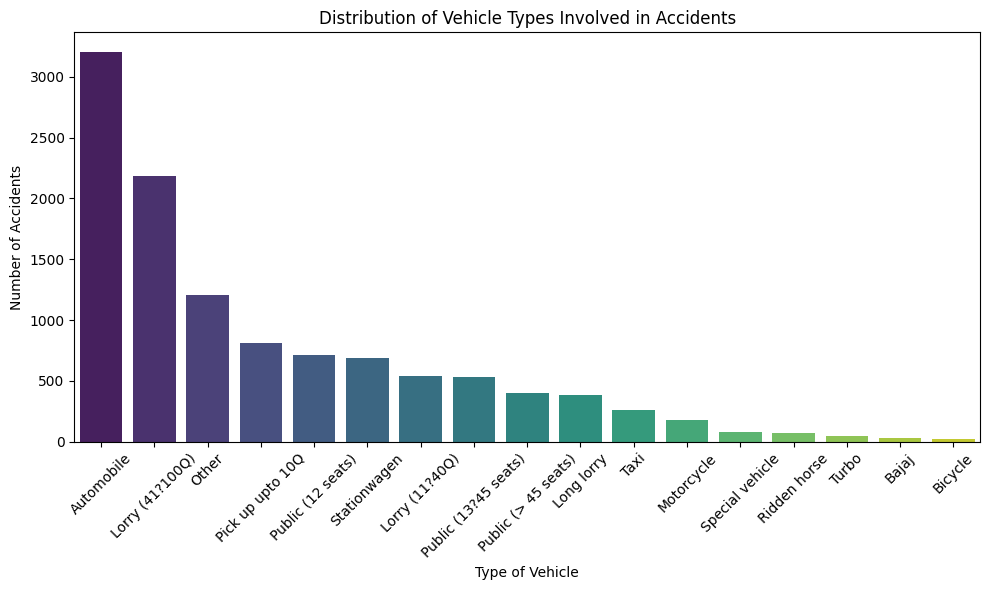

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10,6))
sns.countplot(data=df, x='Type_of_vehicle', order=df['Type_of_vehicle'].value_counts().index, palette='viridis')
plt.title('Distribution of Vehicle Types Involved in Accidents')
plt.xlabel('Type of Vehicle')
plt.ylabel('Number of Accidents')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
import plotly.graph_objects as go

# Prepare data for Sankey Diagram
cause_vehicle = pd.crosstab(df['Cause_of_accident_standardized'], df['Type_of_vehicle_standardized']).stack().reset_index(name='count')
cause_vehicle.columns = ['Cause_of_accident', 'Type_of_vehicle', 'count']

# Define unique labels
labels = list(cause_vehicle['Cause_of_accident'].unique()) + list(cause_vehicle['Type_of_vehicle'].unique())
label_indices = {label: idx for idx, label in enumerate(labels)}

# Define sources and targets
sources = cause_vehicle['Cause_of_accident'].map(label_indices)
targets = cause_vehicle['Type_of_vehicle'].map(label_indices)
values = cause_vehicle['count']

# Create Sankey Diagram
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        label=labels,
        color='blue'
    ),
    link=dict(
        source=sources,
        target=targets,
        value=values,
        color='lightblue'
    ))])

fig.update_layout(title_text="Sankey Diagram: Accident Causes to Vehicle Types", font_size=10)
fig.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
from folium.plugins import HeatMap, MarkerCluster
from datetime import datetime


<ipython-input-119-791647285f1e>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




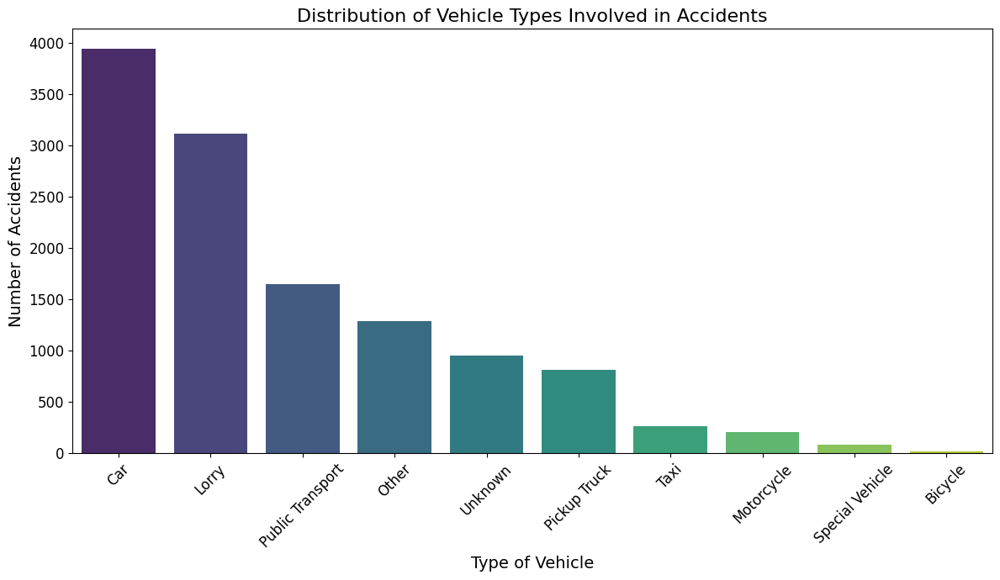

In [ ]:
plt.figure(figsize=(12,7))
sns.countplot(
    data=df,
    x='Type_of_vehicle_standardized',
    order=df['Type_of_vehicle_standardized'].value_counts().index,
    palette='viridis'
)
plt.title('Distribution of Vehicle Types Involved in Accidents', fontsize=16)
plt.xlabel('Type of Vehicle', fontsize=14)
plt.ylabel('Number of Accidents', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


<ipython-input-120-34e33c1f1eb7>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




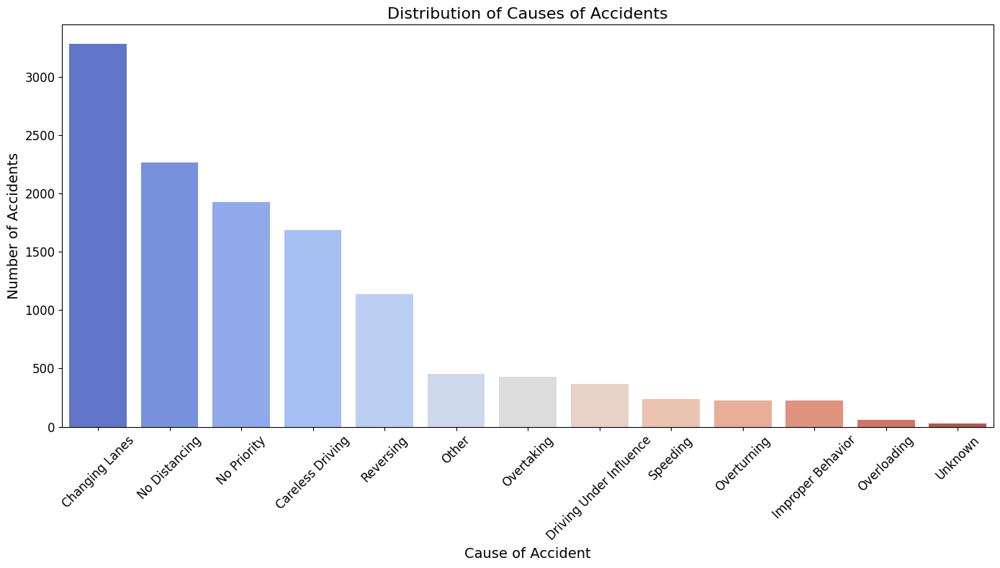

In [ ]:
plt.figure(figsize=(14,8))
sns.countplot(
    data=df,
    x='Cause_of_accident_standardized',
    order=df['Cause_of_accident_standardized'].value_counts().index,
    palette='coolwarm'
)
plt.title('Distribution of Causes of Accidents', fontsize=16)
plt.xlabel('Cause of Accident', fontsize=14)
plt.ylabel('Number of Accidents', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


<ipython-input-121-fc8184db804f>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




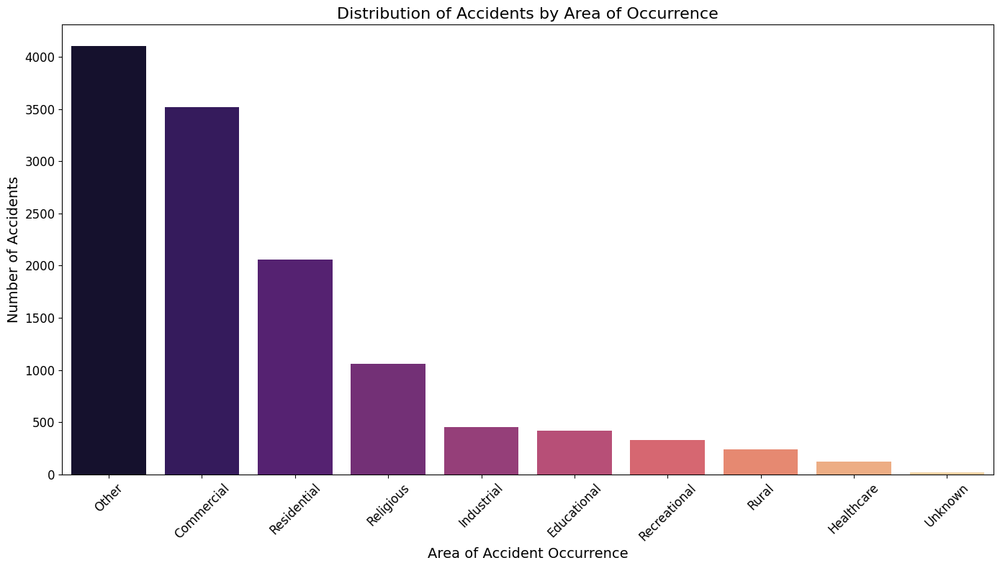

In [ ]:
plt.figure(figsize=(14,8))
sns.countplot(
    data=df,
    x='Area_accident_occured_standardized',
    order=df['Area_accident_occured_standardized'].value_counts().index,
    palette='magma'
)
plt.title('Distribution of Accidents by Area of Occurrence', fontsize=16)
plt.xlabel('Area of Accident Occurrence', fontsize=14)
plt.ylabel('Number of Accidents', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


<ipython-input-122-4c68ef5ad02c>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




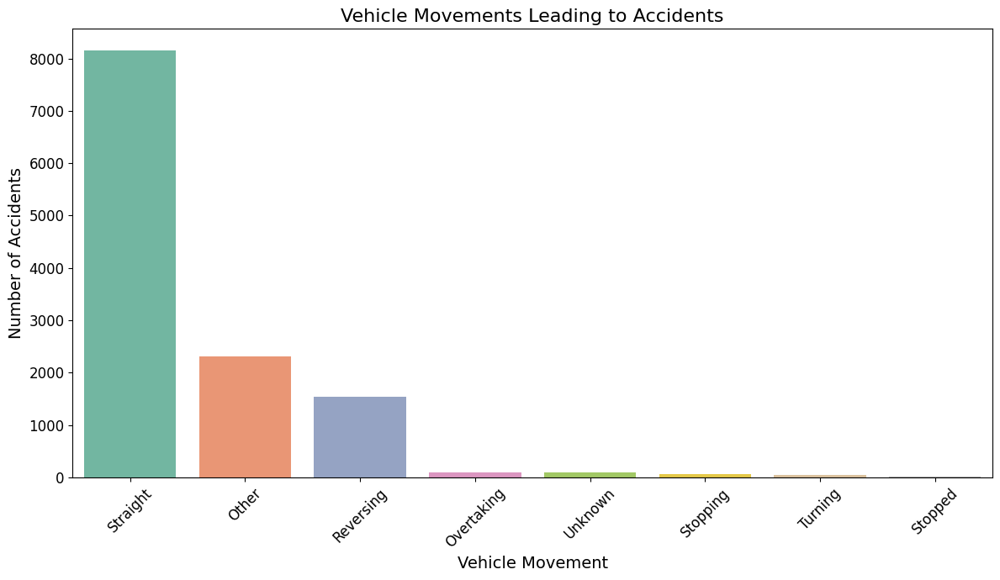

In [ ]:
plt.figure(figsize=(12,7))
sns.countplot(
    data=df,
    x='Vehicle_movement_standardized',
    order=df['Vehicle_movement_standardized'].value_counts().index,
    palette='Set2'
)
plt.title('Vehicle Movements Leading to Accidents', fontsize=16)
plt.xlabel('Vehicle Movement', fontsize=14)
plt.ylabel('Number of Accidents', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


<ipython-input-123-cf000f4c0277>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




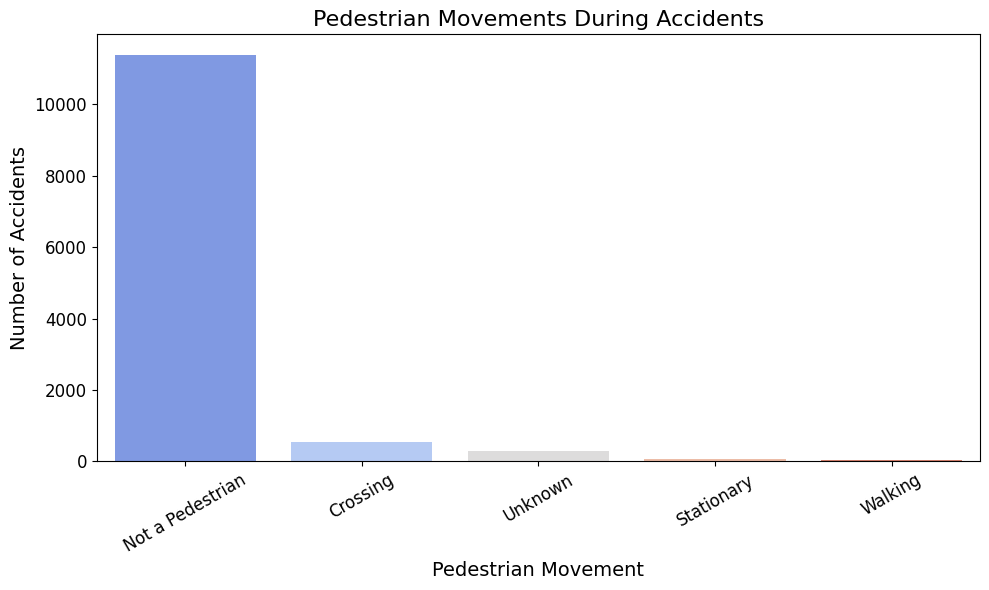

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(
    data=df,
    x='Pedestrian_movement_standardized',
    palette='coolwarm'
)
plt.title('Pedestrian Movements During Accidents', fontsize=16)
plt.xlabel('Pedestrian Movement', fontsize=14)
plt.ylabel('Number of Accidents', fontsize=14)
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


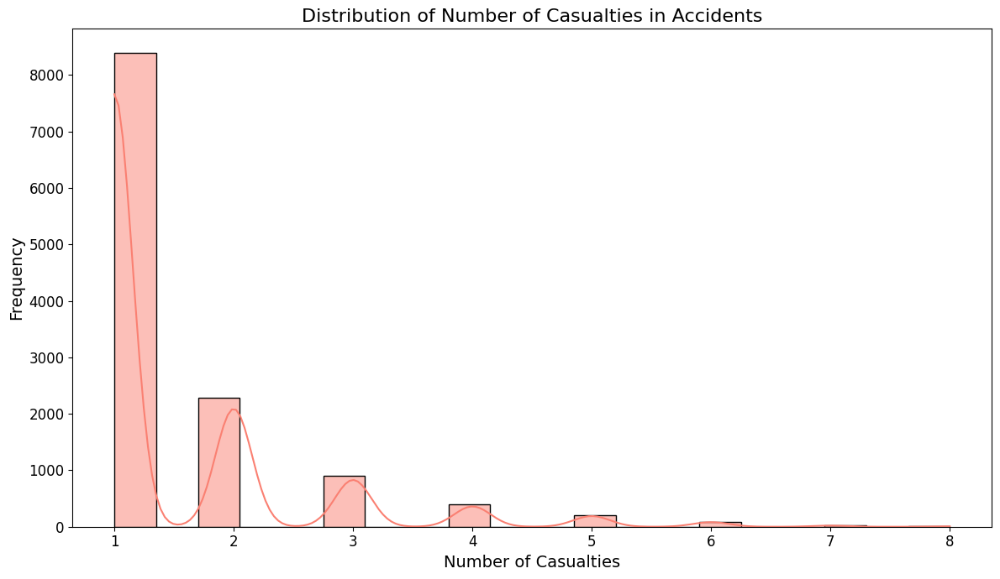

In [ ]:
plt.figure(figsize=(12,7))
sns.histplot(
    data=df,
    x='Number_of_casualties',
    bins=20,
    kde=True,
    color='salmon'
)
plt.title('Distribution of Number of Casualties in Accidents', fontsize=16)
plt.xlabel('Number of Casualties', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


<ipython-input-125-209405188349>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




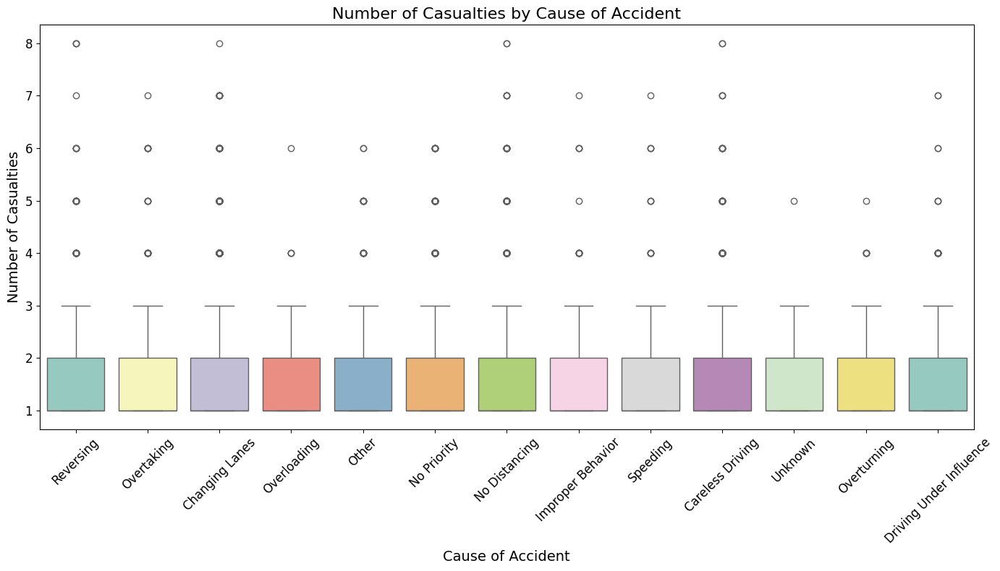

In [ ]:
plt.figure(figsize=(14,8))
sns.boxplot(
    data=df,
    x='Cause_of_accident_standardized',
    y='Number_of_casualties',
    palette='Set3'
)
plt.title('Number of Casualties by Cause of Accident', fontsize=16)
plt.xlabel('Cause of Accident', fontsize=14)
plt.ylabel('Number of Casualties', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


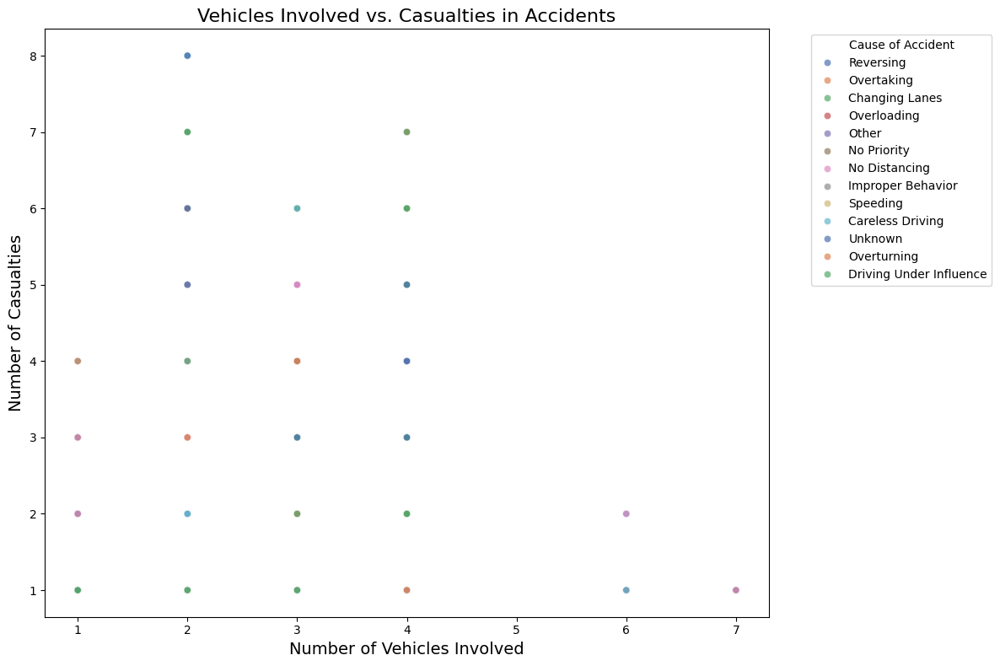

In [ ]:
plt.figure(figsize=(12,8))
sns.scatterplot(
    data=df,
    x='Number_of_vehicles_involved',
    y='Number_of_casualties',
    hue='Cause_of_accident_standardized',
    palette='deep',
    alpha=0.7
)
plt.title('Vehicles Involved vs. Casualties in Accidents', fontsize=16)
plt.xlabel('Number of Vehicles Involved', fontsize=14)
plt.ylabel('Number of Casualties', fontsize=14)
plt.legend(title='Cause of Accident', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


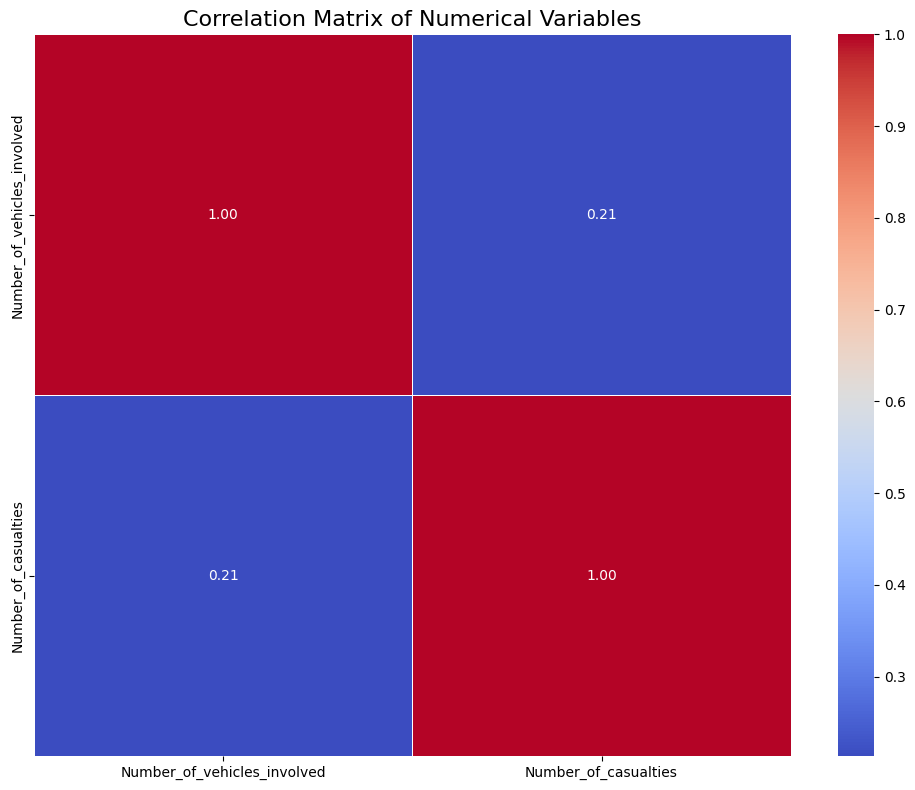

In [ ]:
plt.figure(figsize=(10,8))
numerical_cols = ['Number_of_vehicles_involved', 'Number_of_casualties']
corr_matrix = df[numerical_cols].corr()

sns.heatmap(
    corr_matrix,
    annot=True,
    cmap='coolwarm',
    linewidths=0.5,
    fmt=".2f"
)
plt.title('Correlation Matrix of Numerical Variables', fontsize=16)
plt.tight_layout()
plt.show()


<ipython-input-130-739c59c97960>:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




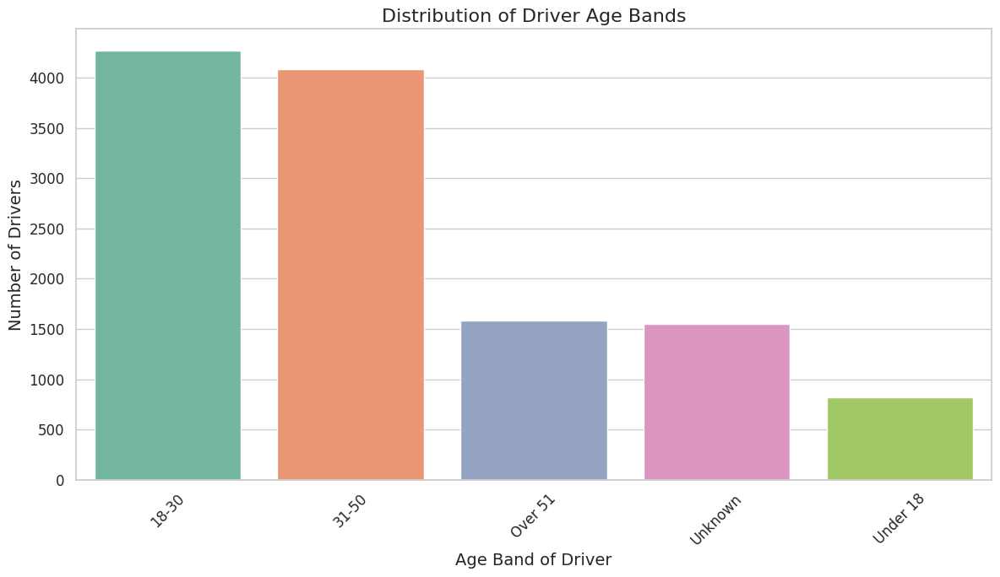

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set a consistent aesthetic
sns.set(style="whitegrid")

# 1. Distribution of Age Bands of Drivers
plt.figure(figsize=(12,7))
sns.countplot(
    data=df,
    x='Age_band_of_driver',
    order=df['Age_band_of_driver'].value_counts().index,
    palette='Set2'
)
plt.title('Distribution of Driver Age Bands', fontsize=16)
plt.xlabel('Age Band of Driver', fontsize=14)
plt.ylabel('Number of Drivers', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


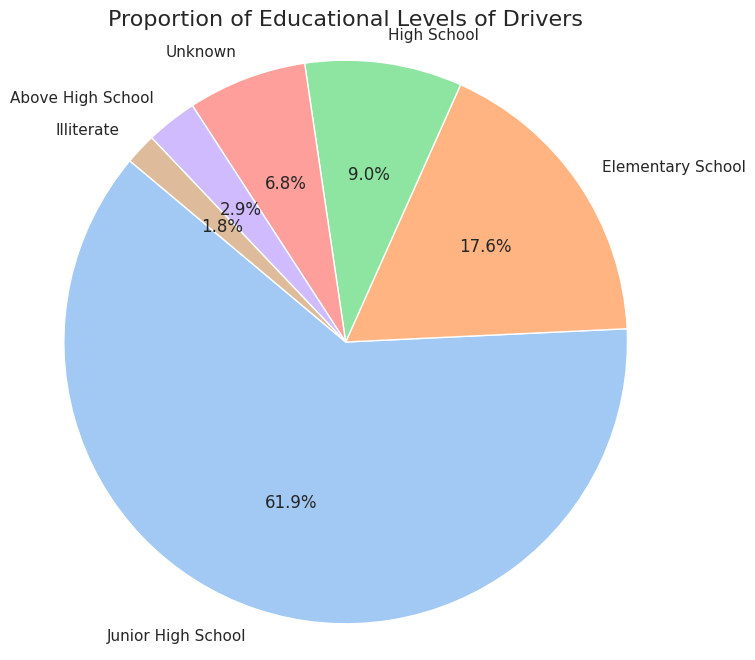

In [ ]:
# 2. Distribution of Educational Levels of Drivers
plt.figure(figsize=(8,8))
edu_counts = df['Educational_level'].value_counts()
plt.pie(
    edu_counts,
    labels=edu_counts.index,
    autopct='%1.1f%%',
    startangle=140,
    colors=sns.color_palette('pastel')
)
plt.title('Proportion of Educational Levels of Drivers', fontsize=16)
plt.axis('equal')  # Equal aspect ratio ensures the pie chart is circular.
plt.show()


<ipython-input-132-56ee15394efd>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




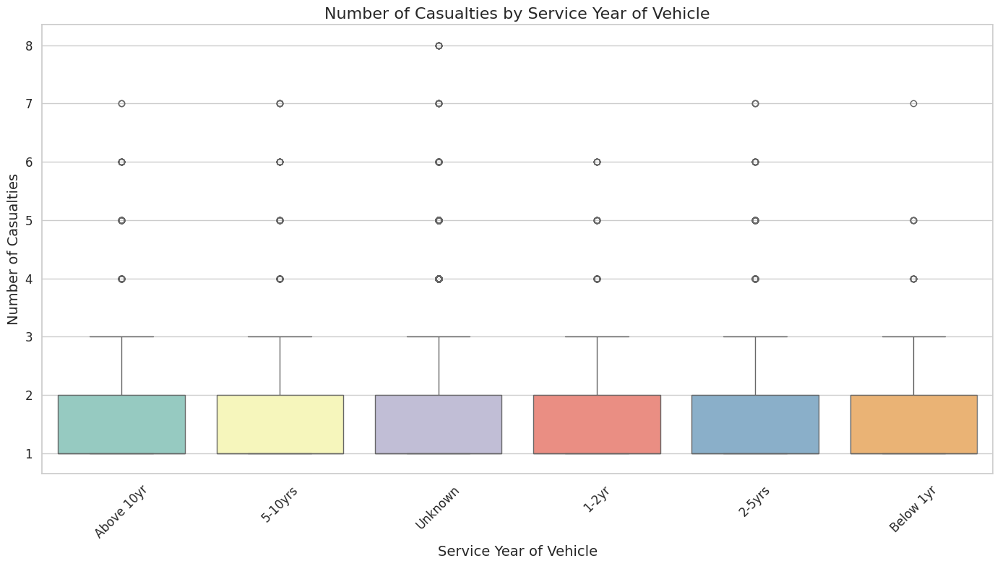

In [ ]:
# 3. Service Year of Vehicle vs. Number of Casualties
plt.figure(figsize=(14,8))
sns.boxplot(
    data=df,
    x='Service_year_of_vehicle',
    y='Number_of_casualties',
    palette='Set3'
)
plt.title('Number of Casualties by Service Year of Vehicle', fontsize=16)
plt.xlabel('Service Year of Vehicle', fontsize=14)
plt.ylabel('Number of Casualties', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


<ipython-input-133-4bdd8cee72e8>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




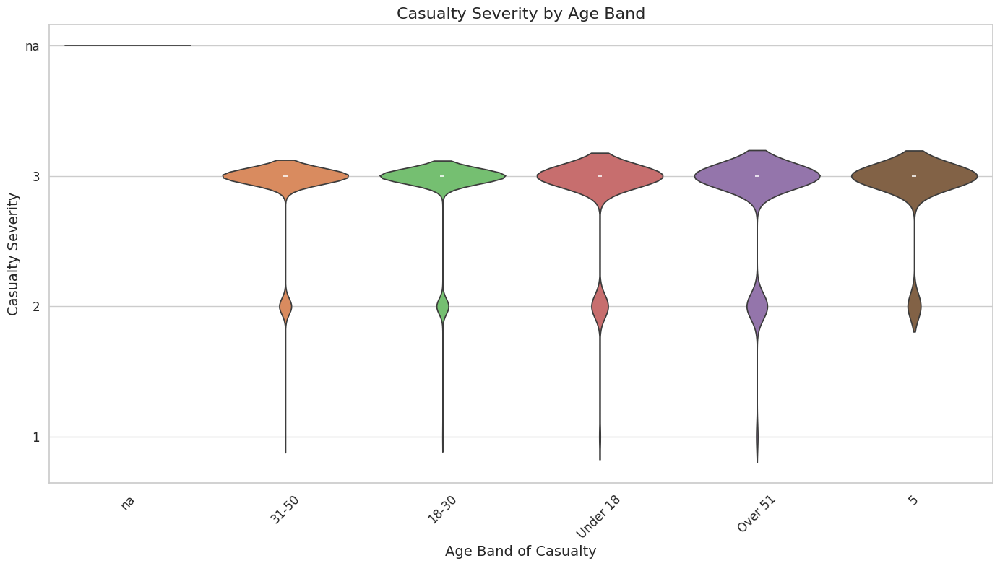

In [ ]:
# 4. Age Bands of Casualties vs. Severity
plt.figure(figsize=(14,8))
sns.violinplot(
    data=df,
    x='Age_band_of_casualty',
    y='Casualty_severity',
    palette='muted'
)
plt.title('Casualty Severity by Age Band', fontsize=16)
plt.xlabel('Age Band of Casualty', fontsize=14)
plt.ylabel('Casualty Severity', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


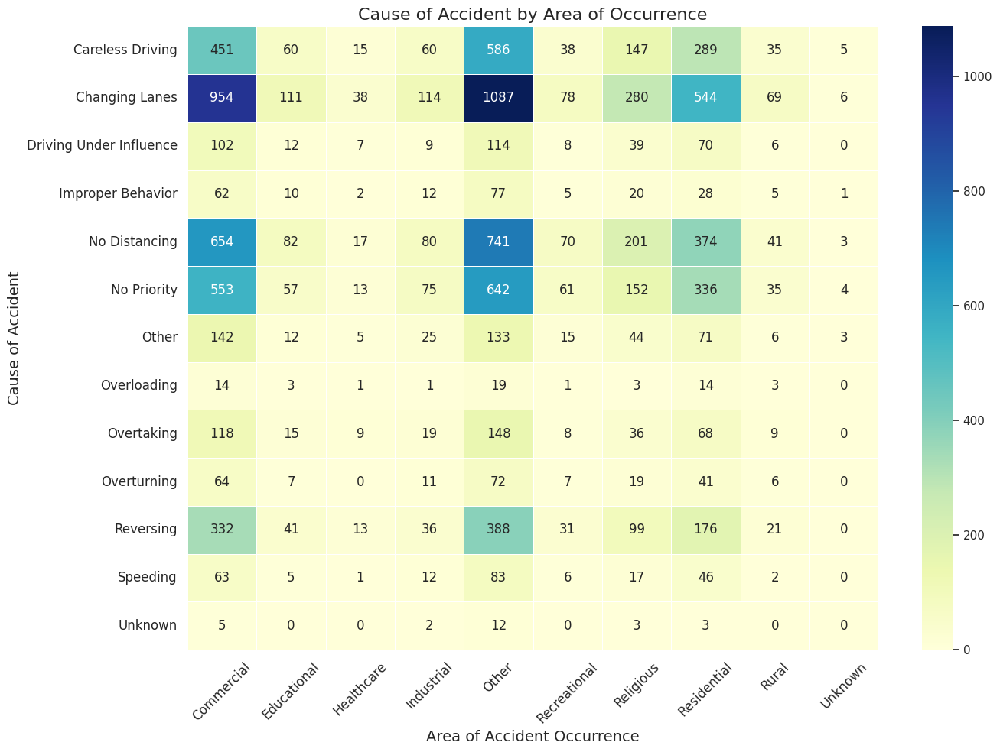

In [ ]:
# 5. Heatmap: Cause of Accident vs. Area of Occurrence
cause_area = pd.crosstab(df['Cause_of_accident_standardized'], df['Area_accident_occured_standardized'])

plt.figure(figsize=(14,10))
sns.heatmap(
    cause_area,
    annot=True,
    fmt='d',
    cmap='YlGnBu',
    linewidths=.5
)
plt.title('Cause of Accident by Area of Occurrence', fontsize=16)
plt.xlabel('Area of Accident Occurrence', fontsize=14)
plt.ylabel('Cause of Accident', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(rotation=0, fontsize=12)
plt.tight_layout()
plt.show()


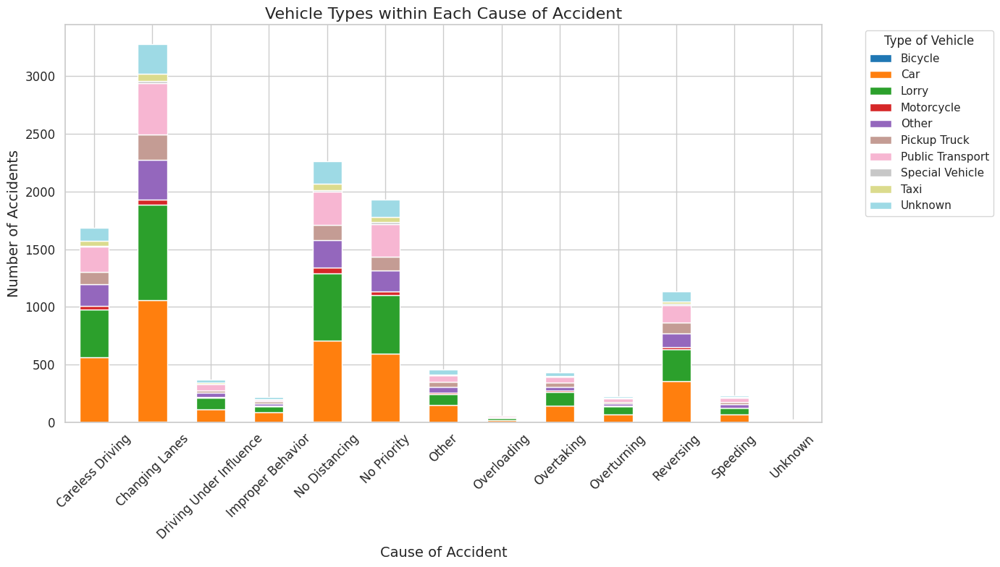

In [ ]:
# 6. Stacked Bar Chart: Vehicle Type within Each Cause of Accident
cause_vehicle = pd.crosstab(df['Cause_of_accident_standardized'], df['Type_of_vehicle_standardized'])

cause_vehicle.plot(
    kind='bar',
    stacked=True,
    figsize=(14,8),
    colormap='tab20'
)
plt.title('Vehicle Types within Each Cause of Accident', fontsize=16)
plt.xlabel('Cause of Accident', fontsize=14)
plt.ylabel('Number of Accidents', fontsize=14)
plt.legend(title='Type of Vehicle', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




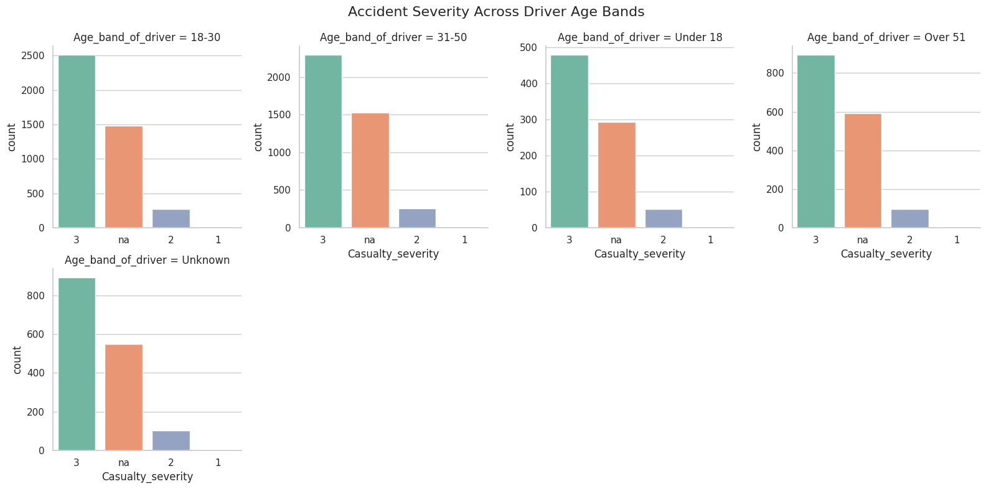

In [ ]:
# 7. Faceted Plots: Accident Severity across Different Age Bands
g = sns.FacetGrid(df, col='Age_band_of_driver', col_wrap=4, height=4, sharex=False, sharey=False)
g.map(sns.countplot, 'Casualty_severity', order=df['Casualty_severity'].value_counts().index, palette='Set2')
g.add_legend()
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Accident Severity Across Driver Age Bands', fontsize=16)
plt.show()


<ipython-input-137-af4ac89629a2>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




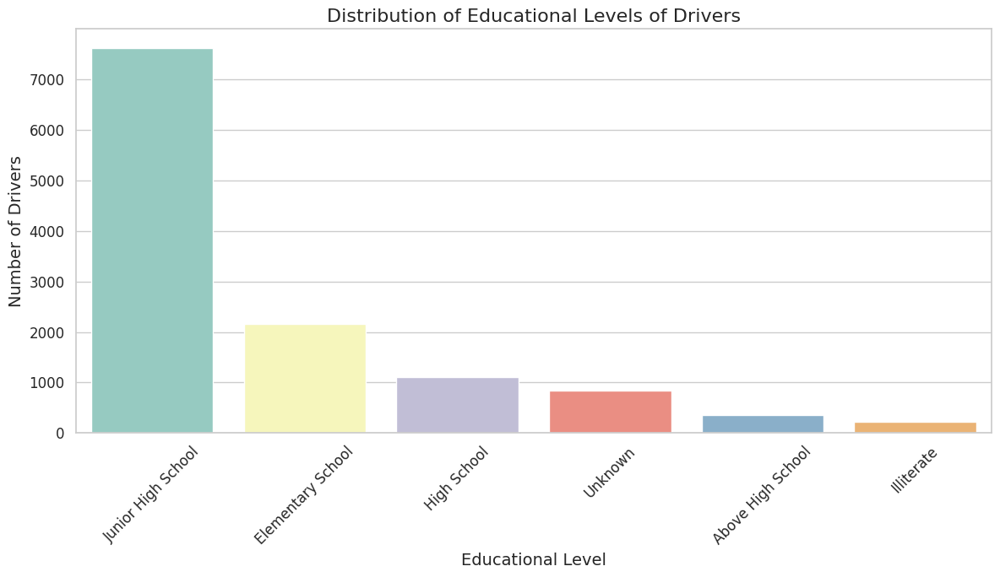

In [ ]:
plt.figure(figsize=(12,7))
sns.countplot(
    data=df,
    x='Educational_level',
    order=df['Educational_level'].value_counts().index,
    palette='Set3'
)
plt.title('Distribution of Educational Levels of Drivers', fontsize=16)
plt.xlabel('Educational Level', fontsize=14)
plt.ylabel('Number of Drivers', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


<ipython-input-138-d2d4d59cd73f>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




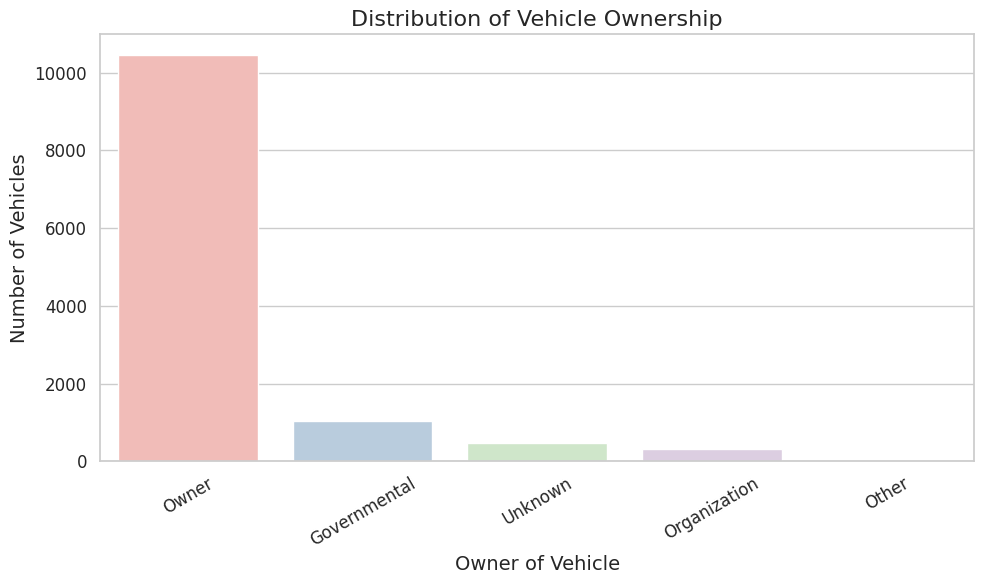

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(
    data=df,
    x='Owner_of_vehicle',
    palette='Pastel1'
)
plt.title('Distribution of Vehicle Ownership', fontsize=16)
plt.xlabel('Owner of Vehicle', fontsize=14)
plt.ylabel('Number of Vehicles', fontsize=14)
plt.xticks(rotation=30, fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


<ipython-input-139-46834a62da06>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




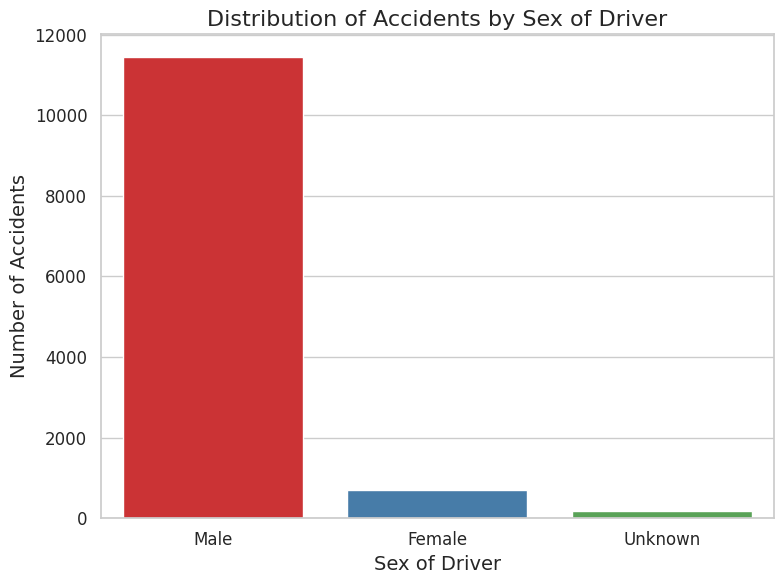

In [ ]:
plt.figure(figsize=(8,6))
sns.countplot(
    data=df,
    x='Sex_of_driver',
    palette='Set1'
)
plt.title('Distribution of Accidents by Sex of Driver', fontsize=16)
plt.xlabel('Sex of Driver', fontsize=14)
plt.ylabel('Number of Accidents', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


<ipython-input-140-def896d239e8>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




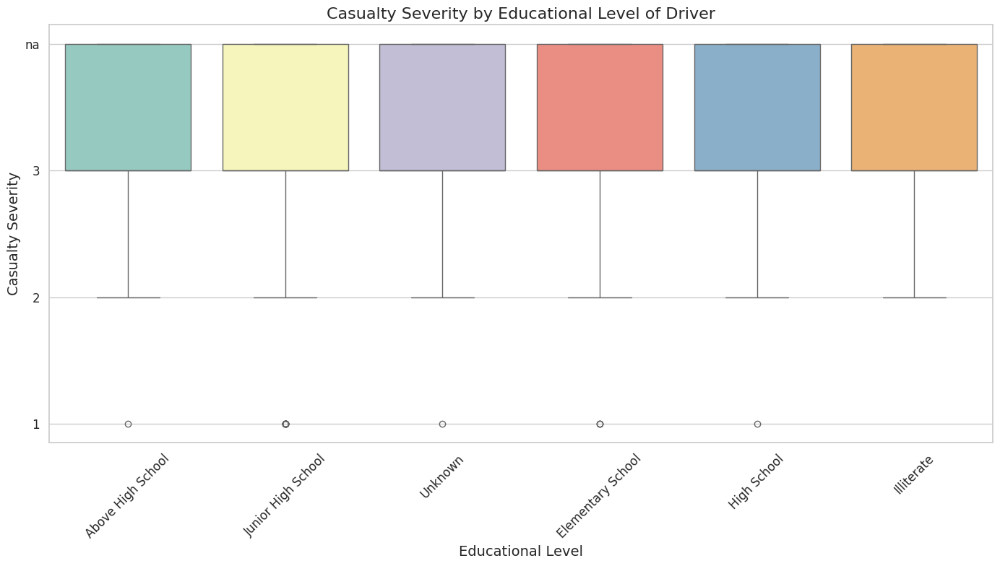

In [ ]:
plt.figure(figsize=(14,8))
sns.boxplot(
    data=df,
    x='Educational_level',
    y='Casualty_severity',
    palette='Set3'
)
plt.title('Casualty Severity by Educational Level of Driver', fontsize=16)
plt.xlabel('Educational Level', fontsize=14)
plt.ylabel('Casualty Severity', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


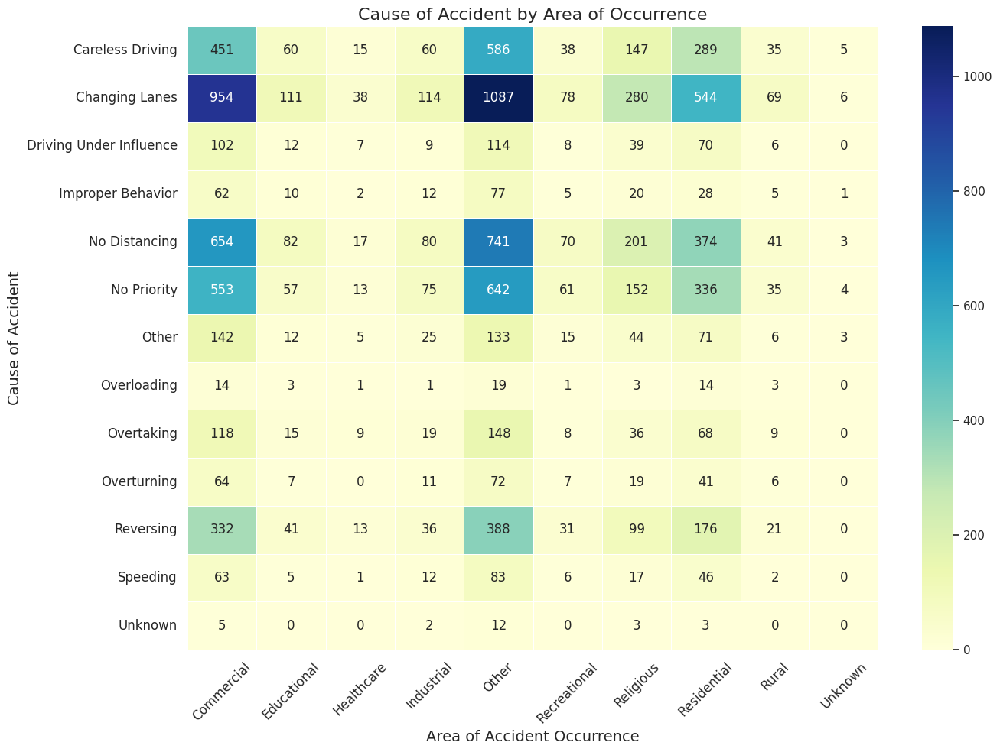

In [ ]:
plt.figure(figsize=(14,10))
sns.heatmap(
    pd.crosstab(df['Cause_of_accident_standardized'], df['Area_accident_occured_standardized']),
    annot=True,
    fmt='d',
    cmap='YlGnBu',
    linewidths=.5
)
plt.title('Cause of Accident by Area of Occurrence', fontsize=16)
plt.xlabel('Area of Accident Occurrence', fontsize=14)
plt.ylabel('Cause of Accident', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(rotation=0, fontsize=12)
plt.tight_layout()
plt.show()


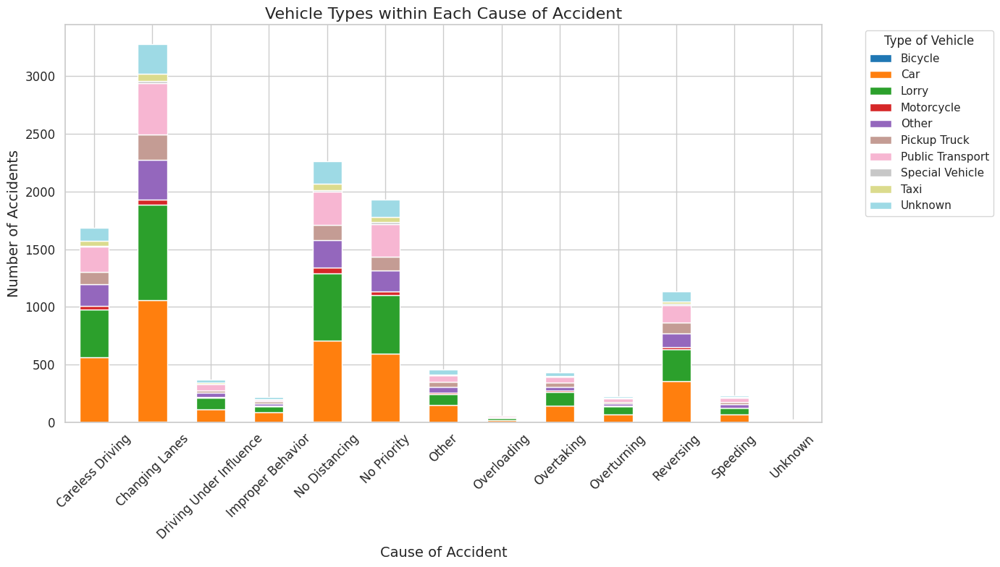

In [ ]:
cause_vehicle = pd.crosstab(df['Cause_of_accident_standardized'], df['Type_of_vehicle_standardized'])

cause_vehicle.plot(
    kind='bar',
    stacked=True,
    figsize=(14,8),
    colormap='tab20'
)
plt.title('Vehicle Types within Each Cause of Accident', fontsize=16)
plt.xlabel('Cause of Accident', fontsize=14)
plt.ylabel('Number of Accidents', fontsize=14)
plt.legend(title='Type of Vehicle', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




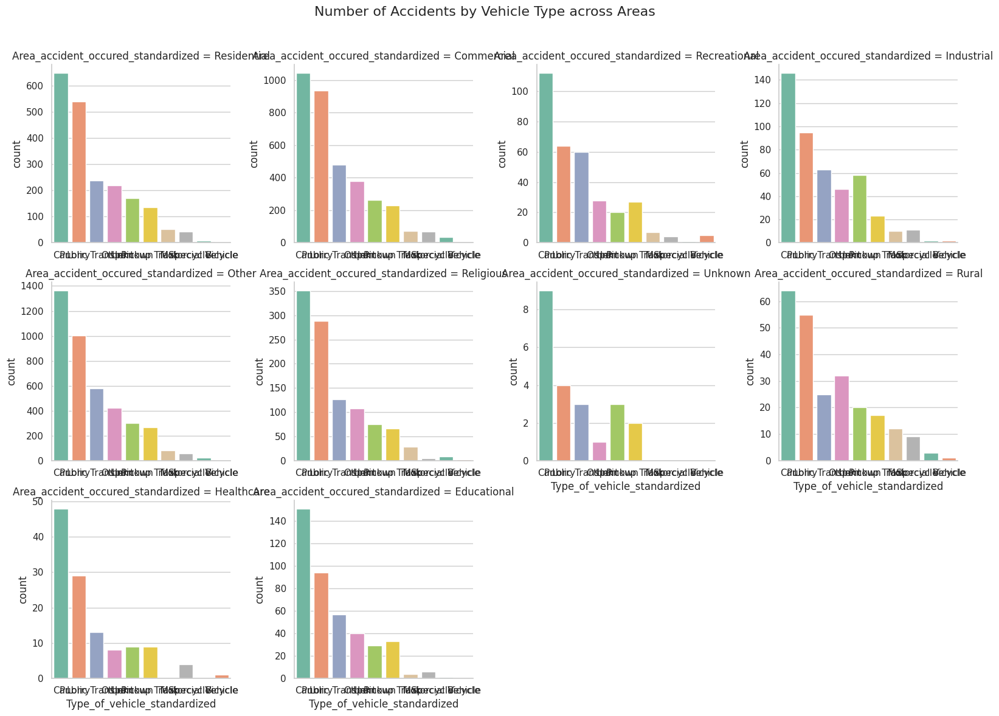

In [ ]:
g = sns.FacetGrid(df, col='Area_accident_occured_standardized', col_wrap=4, height=4, sharex=False, sharey=False)
g.map(sns.countplot, 'Type_of_vehicle_standardized', order=df['Type_of_vehicle_standardized'].value_counts().index, palette='Set2')
g.add_legend()
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Number of Accidents by Vehicle Type across Areas', fontsize=16)
plt.show()


<ipython-input-144-9c3317589022>:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




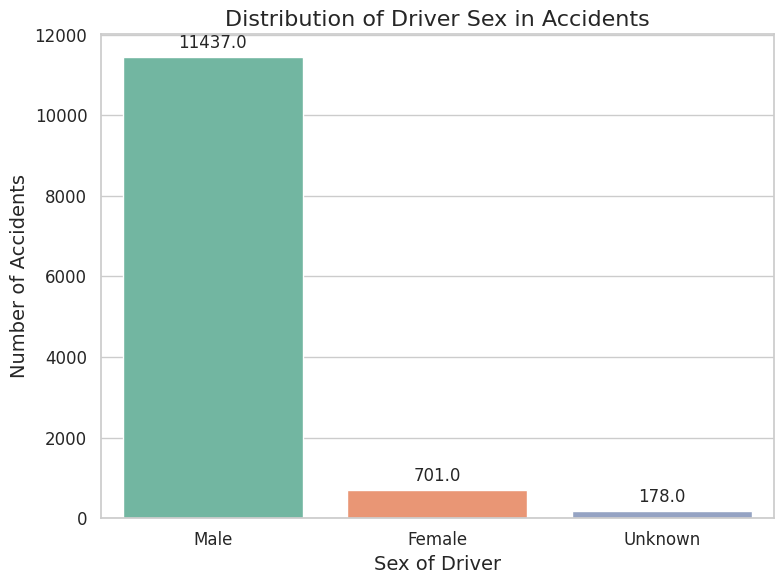

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set aesthetic style
sns.set(style="whitegrid")

plt.figure(figsize=(8,6))
sns.countplot(
    data=df,
    x='Sex_of_driver',
    palette='Set2'
)
plt.title('Distribution of Driver Sex in Accidents', fontsize=16)
plt.xlabel('Sex of Driver', fontsize=14)
plt.ylabel('Number of Accidents', fontsize=14)

# Annotate counts on bars
for p in plt.gca().patches:
    plt.gca().annotate(
        f'{p.get_height()}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center',
        va='center',
        xytext=(0, 10),
        textcoords='offset points',
        fontsize=12
    )

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


<ipython-input-145-d1dd50eca36e>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




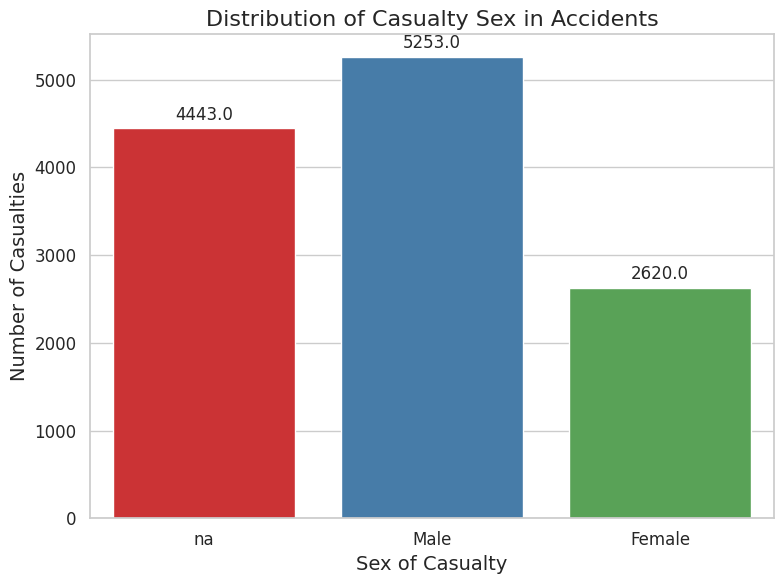

In [ ]:
plt.figure(figsize=(8,6))
sns.countplot(
    data=df,
    x='Sex_of_casualty',
    palette='Set1'
)
plt.title('Distribution of Casualty Sex in Accidents', fontsize=16)
plt.xlabel('Sex of Casualty', fontsize=14)
plt.ylabel('Number of Casualties', fontsize=14)

# Annotate counts on bars
for p in plt.gca().patches:
    plt.gca().annotate(
        f'{p.get_height()}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center',
        va='center',
        xytext=(0, 10),
        textcoords='offset points',
        fontsize=12
    )

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


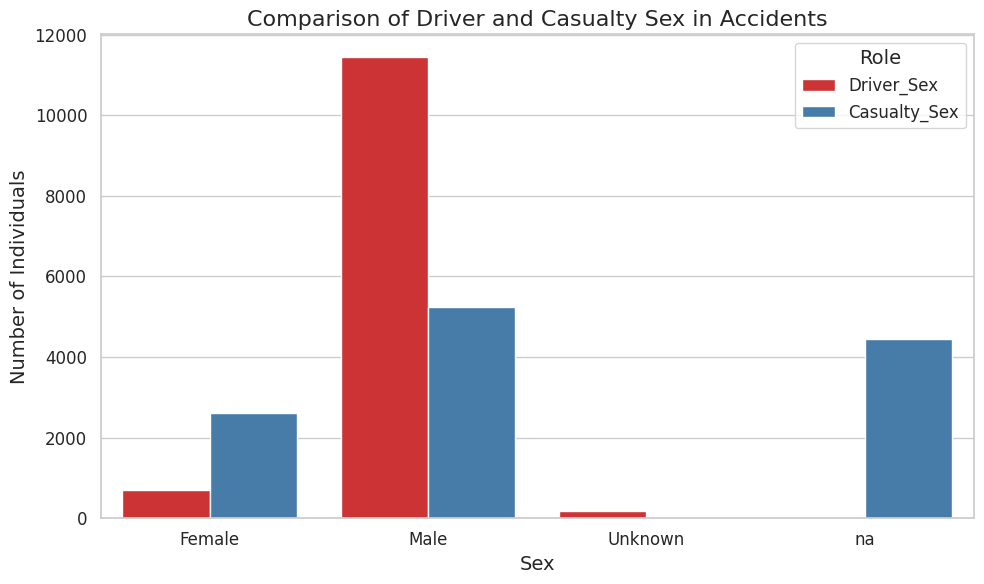

In [ ]:
# Create a DataFrame with counts
comparison_df = pd.DataFrame({
    'Driver_Sex': df['Sex_of_driver'].value_counts(),
    'Casualty_Sex': df['Sex_of_casualty'].value_counts()
}).reset_index().rename(columns={'index': 'Sex'})

# Melt the DataFrame for seaborn
melted_df = comparison_df.melt(id_vars='Sex', var_name='Role', value_name='Count')

plt.figure(figsize=(10,6))
sns.barplot(
    data=melted_df,
    x='Sex',
    y='Count',
    hue='Role',
    palette='Set1'
)
plt.title('Comparison of Driver and Casualty Sex in Accidents', fontsize=16)
plt.xlabel('Sex', fontsize=14)
plt.ylabel('Number of Individuals', fontsize=14)
plt.legend(title='Role', fontsize=12, title_fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


<ipython-input-147-05807c668363>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




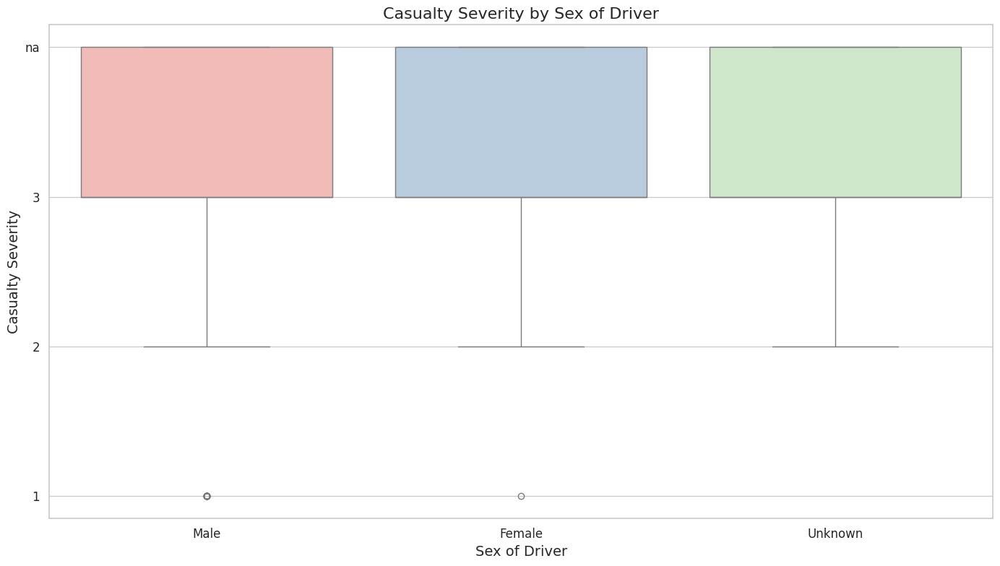

In [ ]:
plt.figure(figsize=(14,8))
sns.boxplot(
    data=df,
    x='Sex_of_driver',
    y='Casualty_severity',
    palette='Pastel1'
)
plt.title('Casualty Severity by Sex of Driver', fontsize=16)
plt.xlabel('Sex of Driver', fontsize=14)
plt.ylabel('Casualty Severity', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


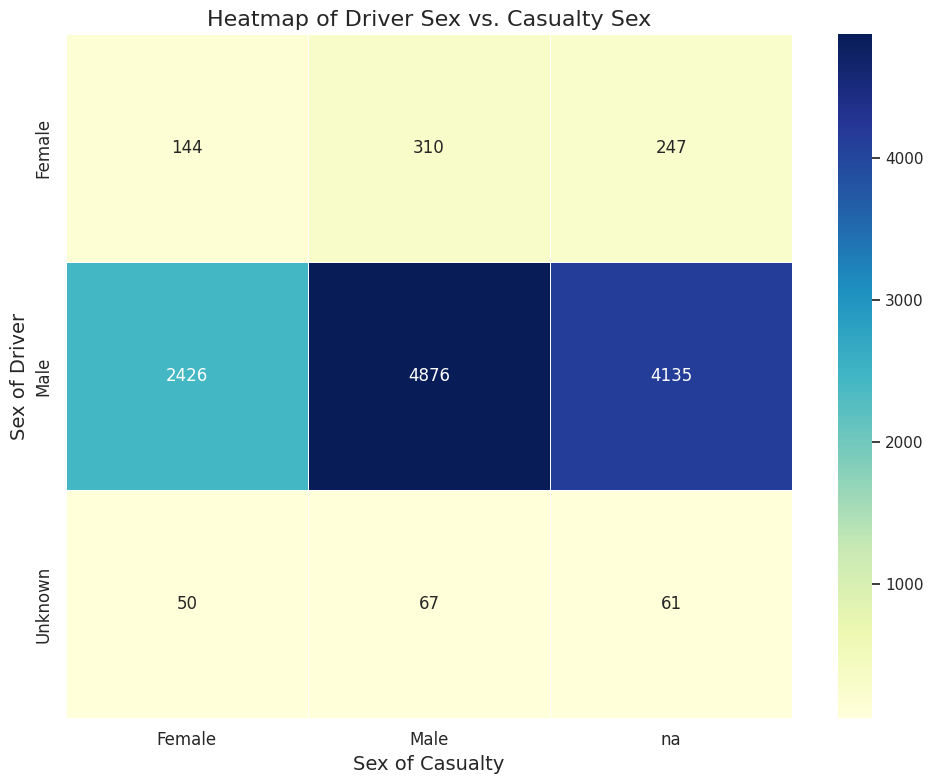

In [ ]:
# Create a crosstab
sex_crosstab = pd.crosstab(df['Sex_of_driver'], df['Sex_of_casualty'])

plt.figure(figsize=(10,8))
sns.heatmap(
    sex_crosstab,
    annot=True,
    fmt='d',
    cmap='YlGnBu',
    linewidths=.5
)
plt.title('Heatmap of Driver Sex vs. Casualty Sex', fontsize=16)
plt.xlabel('Sex of Casualty', fontsize=14)
plt.ylabel('Sex of Driver', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


In [ ]:
from scipy.stats import chi2_contingency

# Create a contingency table
contingency_table = pd.crosstab(df['Sex_of_driver'], df['Cause_of_accident_standardized'])

# Perform Chi-Square Test
chi2, p, dof, ex = chi2_contingency(contingency_table)

print("Chi-Square Test Results:")
print(f"Chi2 Statistic: {chi2}")
print(f"P-value: {p}")
print(f"Degrees of Freedom: {dof}")

# Interpretation
alpha = 0.05
if p < alpha:
    print("\nResult: There is a significant association between Sex of Driver and Cause of Accident.")
else:
    print("\nResult: There is no significant association between Sex of Driver and Cause of Accident.")


Chi-Square Test Results:
Chi2 Statistic: 24.44477927575748
P-value: 0.4364129648724299
Degrees of Freedom: 24

Result: There is no significant association between Sex of Driver and Cause of Accident.


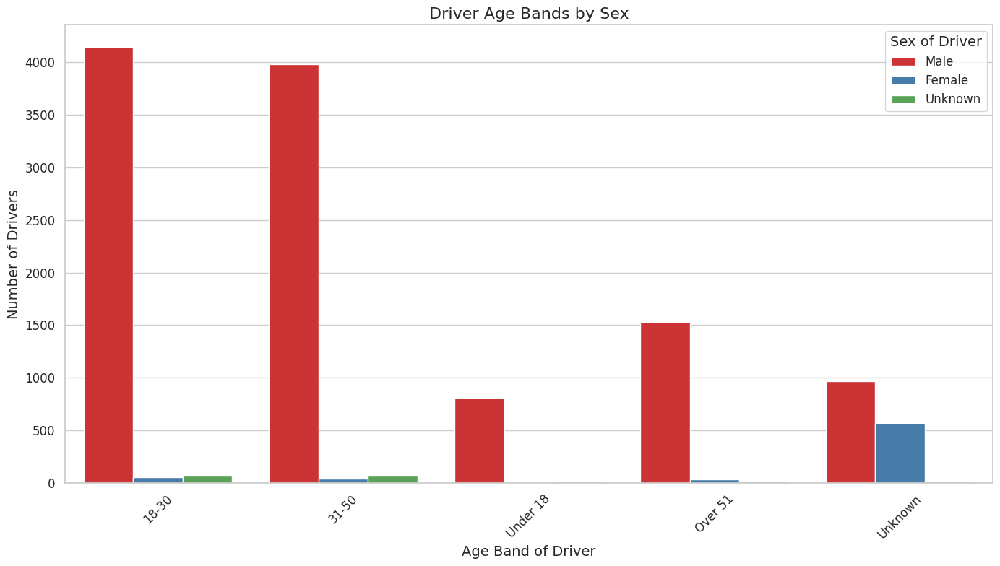

In [ ]:
plt.figure(figsize=(14,8))
sns.countplot(
    data=df,
    x='Age_band_of_driver',
    hue='Sex_of_driver',
    palette='Set1'
)
plt.title('Driver Age Bands by Sex', fontsize=16)
plt.xlabel('Age Band of Driver', fontsize=14)
plt.ylabel('Number of Drivers', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='Sex of Driver', fontsize=12, title_fontsize=14)
plt.tight_layout()
plt.show()


In [ ]:
def perform_chi_square_tests(df, variable_pairs):
    """
    Performs Chi-Square tests for given variable pairs.

    Parameters:
    - df: pandas DataFrame containing the data.
    - variable_pairs: List of tuples, where each tuple contains two categorical variable names.

    Returns:
    - results_df: pandas DataFrame containing the results of the Chi-Square tests.
    """
    results = []

    for var1, var2 in variable_pairs:
        # Create contingency table
        contingency_table = pd.crosstab(df[var1], df[var2])

        # Check if the contingency table has more than one unique value in both variables
        if contingency_table.shape[0] < 2 or contingency_table.shape[1] < 2:
            print(f"Skipping {var1} vs {var2}: Not enough categories for Chi-Square test.")
            continue

        # Perform Chi-Square test
        chi2, p, dof, ex = chi2_contingency(contingency_table)

        # Append the results
        results.append({
            'Variable 1': var1,
            'Variable 2': var2,
            'Chi2 Statistic': chi2,
            'P-value': p,
            'Degrees of Freedom': dof,
            'Expected Frequencies': ex
        })

    # Convert results to DataFrame
    results_df = pd.DataFrame(results)

    return results_df


In [ ]:
# Define variable pairs as tuples (Variable1, Variable2)
variable_pairs = [
    ('Sex_of_driver', 'Sex_of_casualty'),
    ('Age_band_of_driver', 'Sex_of_driver'),
    ('Age_band_of_casualty', 'Sex_of_casualty'),
    ('Educational_level', 'Cause_of_accident_standardized'),
    ('Driving_experience', 'Cause_of_accident_standardized'),
    ('Type_of_vehicle_standardized', 'Cause_of_accident_standardized'),
    ('Vehicle_movement_standardized', 'Cause_of_accident_standardized'),
    ('Weather_conditions', 'Cause_of_accident_standardized'),
    ('Light_conditions', 'Cause_of_accident_standardized'),
    ('Service_year_of_vehicle', 'Defect_of_vehicle'),
    ('Owner_of_vehicle', 'Cause_of_accident_standardized')
]


In [ ]:
# Perform Chi-Square tests
chi_square_results = perform_chi_square_tests(df, variable_pairs)

# Display the results
print("\nChi-Square Test Results:")
print(chi_square_results[['Variable 1', 'Variable 2', 'Chi2 Statistic', 'P-value', 'Degrees of Freedom']])



Chi-Square Test Results:
                       Variable 1                      Variable 2  \
0                   Sex_of_driver                 Sex_of_casualty   
1              Age_band_of_driver                   Sex_of_driver   
2            Age_band_of_casualty                 Sex_of_casualty   
3               Educational_level  Cause_of_accident_standardized   
4              Driving_experience  Cause_of_accident_standardized   
5    Type_of_vehicle_standardized  Cause_of_accident_standardized   
6   Vehicle_movement_standardized  Cause_of_accident_standardized   
7              Weather_conditions  Cause_of_accident_standardized   
8                Light_conditions  Cause_of_accident_standardized   
9         Service_year_of_vehicle               Defect_of_vehicle   
10               Owner_of_vehicle  Cause_of_accident_standardized   

    Chi2 Statistic       P-value  Degrees of Freedom  
0         5.856800  2.101008e-01                   4  
1      3186.493537  0.000000e+00   

In [ ]:
# Add interpretation based on P-value
chi_square_results['Significant (P < 0.05)'] = chi_square_results['P-value'] < 0.05

# Display the results with interpretation
print("\nChi-Square Test Results with Significance:")
print(chi_square_results[['Variable 1', 'Variable 2', 'Chi2 Statistic', 'P-value', 'Degrees of Freedom', 'Significant (P < 0.05)']])



Chi-Square Test Results with Significance:
                       Variable 1                      Variable 2  \
0                   Sex_of_driver                 Sex_of_casualty   
1              Age_band_of_driver                   Sex_of_driver   
2            Age_band_of_casualty                 Sex_of_casualty   
3               Educational_level  Cause_of_accident_standardized   
4              Driving_experience  Cause_of_accident_standardized   
5    Type_of_vehicle_standardized  Cause_of_accident_standardized   
6   Vehicle_movement_standardized  Cause_of_accident_standardized   
7              Weather_conditions  Cause_of_accident_standardized   
8                Light_conditions  Cause_of_accident_standardized   
9         Service_year_of_vehicle               Defect_of_vehicle   
10               Owner_of_vehicle  Cause_of_accident_standardized   

    Chi2 Statistic       P-value  Degrees of Freedom  Significant (P < 0.05)  
0         5.856800  2.101008e-01                

In [ ]:
# Filter significant results
significant_results = chi_square_results[chi_square_results['P-value'] < 0.05]

print("\nSignificant Chi-Square Test Results (P < 0.05):")
print(significant_results[['Variable 1', 'Variable 2', 'Chi2 Statistic', 'P-value']])



Significant Chi-Square Test Results (P < 0.05):
                Variable 1         Variable 2  Chi2 Statistic       P-value
1       Age_band_of_driver      Sex_of_driver     3186.493537  0.000000e+00
2     Age_band_of_casualty    Sex_of_casualty    12439.617641  0.000000e+00
9  Service_year_of_vehicle  Defect_of_vehicle      487.895657  2.050126e-94


In [ ]:
import statsmodels.api as sm

def plot_mosaic(var1, var2, df):
    """
    Plots a mosaic plot for two categorical variables.

    Parameters:
    - var1: Name of the first categorical variable.
    - var2: Name of the second categorical variable.
    - df: pandas DataFrame containing the data.
    """
    contingency_table = pd.crosstab(df[var1], df[var2])
    plt.figure(figsize=(10,7))
    sm.graphics.mosaic_plot(contingency_table, title=f'Mosaic Plot: {var1} vs {var2}')
    plt.show()

# Example: Plotting Mosaic Plot for 'Sex_of_driver' vs 'Sex_of_casualty' if significant
if ('Sex_of_driver' in significant_results['Variable 1'].values) and ('Sex_of_casualty' in significant_results['Variable 2'].values):
    plot_mosaic('Sex_of_driver', 'Sex_of_casualty', df)


In [ ]:
def plot_stacked_bar(var1, var2, df):
    """
    Plots a stacked bar chart for two categorical variables.

    Parameters:
    - var1: Name of the first categorical variable (e.g., Driver Sex).
    - var2: Name of the second categorical variable (e.g., Cause of Accident).
    - df: pandas DataFrame containing the data.
    """
    contingency_table = pd.crosstab(df[var1], df[var2])
    contingency_table.plot(
        kind='bar',
        stacked=True,
        figsize=(14,8),
        colormap='tab20'
    )
    plt.title(f'{var2} by {var1}', fontsize=16)
    plt.xlabel(var1, fontsize=14)
    plt.ylabel('Number of Accidents', fontsize=14)
    plt.legend(title=var2, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45, fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    plt.show()

# Example: Plotting Stacked Bar Chart for 'Sex_of_driver' vs 'Cause_of_accident_standardized'
if ('Sex_of_driver' in significant_results['Variable 1'].values) and ('Cause_of_accident_standardized' in significant_results['Variable 2'].values):
    plot_stacked_bar('Sex_of_driver', 'Cause_of_accident_standardized', df)


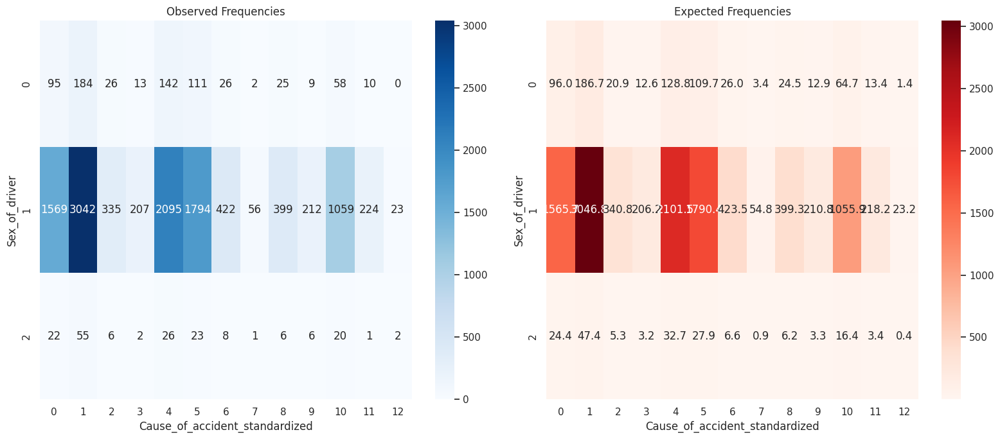

In [ ]:
def plot_expected_vs_observed(contingency_table, var1, var2):
    observed = contingency_table.values
    expected = chi2_contingency(contingency_table)[3]

    fig, axes = plt.subplots(1, 2, figsize=(16,7))

    sns.heatmap(observed, annot=True, fmt='d', cmap='Blues', ax=axes[0])
    axes[0].set_title('Observed Frequencies')
    axes[0].set_xlabel(var2)
    axes[0].set_ylabel(var1)

    sns.heatmap(expected, annot=True, fmt='.1f', cmap='Reds', ax=axes[1])
    axes[1].set_title('Expected Frequencies')
    axes[1].set_xlabel(var2)
    axes[1].set_ylabel(var1)

    plt.tight_layout()
    plt.show()

# Example usage:
plot_expected_vs_observed(contingency_table, 'Sex_of_driver', 'Cause_of_accident_standardized')


In [ ]:
import pandas as pd


df = pd.read_excel('/content/cleaned_accident_data.xlsx')

Nowf for the machine learning -> doing all of the encoding and scaling first then after training the models and explaining with XAI

In [ ]:
# Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time

# Machine Learning Models and Evaluation Metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, confusion_matrix, classification_report,
    cohen_kappa_score, roc_curve, auc
)

# Explainable AI Libraries
import shap
from lime import lime_tabular
from sklearn.inspection import PartialDependenceDisplay

# Statistical Tests
from scipy.stats import chi2_contingency
import statsmodels.api as sm

# Initialize seaborn style
sns.set(style="whitegrid")



In [ ]:
# Define the target variable
target = 'Cause_of_accident_standardized'

# Check the distribution of the target variable
print("\nTarget Variable Distribution:")
print(df[target].value_counts())



Target Variable Distribution:
Cause_of_accident_standardized
Changing Lanes             3281
No Distancing              2263
No Priority                1928
Careless Driving           1686
Reversing                  1137
Other                       456
Overtaking                  430
Driving Under Influence     367
Speeding                    235
Overturning                 227
Improper Behavior           222
Overloading                  59
Unknown                      25
Name: count, dtype: int64


In [ ]:
# List of binary categorical features
binary_features = ['Sex_of_driver', 'Sex_of_casualty']

# Initialize LabelEncoder
le = LabelEncoder()

# Apply Label Encoding to binary features
for feature in binary_features:
    # Check unique values before encoding
    print(f"\nUnique values in '{feature}': {df[feature].unique()}")

    # Encode and create a new column to avoid SettingWithCopyWarning
    df[f'{feature}_encoded'] = le.fit_transform(df[feature].astype(str))

    print(f"Encoded '{feature}' with classes: {le.classes_}")



Unique values in 'Sex_of_driver': ['Male' 'Female' 'Unknown']
Encoded 'Sex_of_driver' with classes: ['Female' 'Male' 'Unknown']

Unique values in 'Sex_of_casualty': ['na' 'Male' 'Female']
Encoded 'Sex_of_casualty' with classes: ['Female' 'Male' 'na']


In [ ]:
# Define mapping for 'Age_band_of_driver'
age_driver_mapping = {
    'Under 18': 1,
    '18-30': 2,
    '31-50': 3,
    'Over 51': 4,
    'Unknown': 0
}

# Display unique values
print("\nUnique values in 'Age_band_of_driver':", df['Age_band_of_driver'].unique())

# Apply mapping and create a new encoded column
df['Age_band_of_driver_encoded'] = df['Age_band_of_driver'].map(age_driver_mapping)

# Handle any unmapped categories by assigning 0
df['Age_band_of_driver_encoded'] = df['Age_band_of_driver_encoded'].fillna(0).astype(int)

# Verify encoding
print("\nEncoded 'Age_band_of_driver':")
print(df[['Age_band_of_driver', 'Age_band_of_driver_encoded']].head())



Unique values in 'Age_band_of_driver': ['18-30' '31-50' 'Under 18' 'Over 51' 'Unknown']

Encoded 'Age_band_of_driver':
  Age_band_of_driver  Age_band_of_driver_encoded
0              18-30                           2
1              31-50                           3
2              18-30                           2
3              18-30                           2
4              18-30                           2


In [ ]:
# Define mapping for 'Age_band_of_casualty'
age_casualty_mapping = {
    'Under 18': 1,
    '18-30': 2,
    '31-50': 3,
    'Over 51': 4,
    '5': 5,
    'na': 0
}

# Display unique values
print("\nUnique values in 'Age_band_of_casualty':", df['Age_band_of_casualty'].unique())

# Apply mapping and create a new encoded column
df['Age_band_of_casualty_encoded'] = df['Age_band_of_casualty'].map(age_casualty_mapping)

# Handle any unmapped categories by assigning 0
df['Age_band_of_casualty_encoded'] = df['Age_band_of_casualty_encoded'].fillna(0).astype(int)

# Verify encoding
print("\nEncoded 'Age_band_of_casualty':")
print(df[['Age_band_of_casualty', 'Age_band_of_casualty_encoded']].head())



Unique values in 'Age_band_of_casualty': ['na' '31-50' '18-30' 'Under 18' 'Over 51' '5']

Encoded 'Age_band_of_casualty':
  Age_band_of_casualty  Age_band_of_casualty_encoded
0                   na                             0
1                   na                             0
2                31-50                             3
3                18-30                             2
4                   na                             0


In [ ]:
# Define mapping for 'Service_year_of_vehicle'
service_year_mapping = {
    'Below 1yr': 1,
    '1-2yr': 2,
    '2-5yrs': 3,
    '5-10yrs': 4,
    'Above 10yr': 5,
    'Unknown': 0
}

# Display unique values
print("\nUnique values in 'Service_year_of_vehicle':", df['Service_year_of_vehicle'].unique())

# Apply mapping and create a new encoded column
df['Service_year_of_vehicle_encoded'] = df['Service_year_of_vehicle'].map(service_year_mapping)

# Handle any unmapped categories by assigning 0
df['Service_year_of_vehicle_encoded'] = df['Service_year_of_vehicle_encoded'].fillna(0).astype(int)

# Verify encoding
print("\nEncoded 'Service_year_of_vehicle':")
print(df[['Service_year_of_vehicle', 'Service_year_of_vehicle_encoded']].head())



Unique values in 'Service_year_of_vehicle': ['Above 10yr' '5-10yrs' 'Unknown' '1-2yr' '2-5yrs' 'Below 1yr']

Encoded 'Service_year_of_vehicle':
  Service_year_of_vehicle  Service_year_of_vehicle_encoded
0              Above 10yr                                5
1                 5-10yrs                                4
2                 Unknown                                0
3                 Unknown                                0
4                 5-10yrs                                4


In [ ]:
# Define mapping for 'Driving_experience'
driving_experience_mapping = {
    'No Licence': 0,
    'Below 1yr': 1,
    '1-2yr': 2,
    '2-5yr': 3,
    '5-10yr': 4,
    'Above 10yr': 5,
    'Unknown': 6,
    'unknown': 6  # Handling case-insensitive 'unknown'
}

# Display unique values
print("\nUnique values in 'Driving_experience':", df['Driving_experience'].unique())

# Apply mapping and create a new encoded column
df['Driving_experience_encoded'] = df['Driving_experience'].map(driving_experience_mapping)

# Handle any unmapped categories by assigning 6 (for 'Unknown')
df['Driving_experience_encoded'] = df['Driving_experience_encoded'].fillna(6).astype(int)

# Verify encoding
print("\nEncoded 'Driving_experience':")
print(df[['Driving_experience', 'Driving_experience_encoded']].head())



Unique values in 'Driving_experience': ['1-2yr' 'Above 10yr' '5-10yr' '2-5yr' 'Unknown' 'No Licence' 'Below 1yr'
 'unknown']

Encoded 'Driving_experience':
  Driving_experience  Driving_experience_encoded
0              1-2yr                           2
1         Above 10yr                           5
2              1-2yr                           2
3             5-10yr                           4
4              2-5yr                           3


In [ ]:
# List of encoded columns
encoded_columns = [
    'Age_band_of_driver_encoded',
    'Age_band_of_casualty_encoded',
    'Service_year_of_vehicle_encoded',
    'Driving_experience_encoded'
]

# Display first few rows of encoded columns
print("\nFirst 5 rows of encoded columns:")
print(df[encoded_columns].head())

# Check for any remaining NaN values in encoded columns
print("\nCheck for NaNs in encoded columns:")
print(df[encoded_columns].isnull().sum())



First 5 rows of encoded columns:
   Age_band_of_driver_encoded  Age_band_of_casualty_encoded  \
0                           2                             0   
1                           3                             0   
2                           2                             3   
3                           2                             2   
4                           2                             0   

   Service_year_of_vehicle_encoded  Driving_experience_encoded  
0                                5                           2  
1                                4                           5  
2                                0                           2  
3                                0                           4  
4                                4                           3  

Check for NaNs in encoded columns:
Age_band_of_driver_encoded         0
Age_band_of_casualty_encoded       0
Service_year_of_vehicle_encoded    0
Driving_experience_encoded         0
dtype: int64


In [ ]:
# List of nominal categorical features (excluding the ones already encoded)
nominal_features = [
    'Time', 'Day_of_week', 'Educational_level', 'Vehicle_driver_relation',
    'Type_of_vehicle_standardized', 'Owner_of_vehicle', 'Defect_of_vehicle',
    'Area_accident_occured_standardized', 'Lanes_or_Medians', 'Road_allignment',
    'Types_of_Junction', 'Road_surface_type', 'Road_surface_conditions',
    'Light_conditions', 'Weather_conditions', 'Type_of_collision',
    'Vehicle_movement_standardized', 'Casualty_class', 'Casualty_severity',
    'Work_of_casuality', 'Fitness_of_casuality', 'Pedestrian_movement_standardized',
    'Accident_severity', 'Part_of_day'
]

# Verify data types
print("\nData Types Before One-Hot Encoding:")
print(df[nominal_features].dtypes)

# Apply One-Hot Encoding
df_encoded = pd.get_dummies(df, columns=nominal_features, drop_first=True)

print("\nOne-Hot Encoding Applied to Nominal Features.")



Data Types Before One-Hot Encoding:
Time                                  object
Day_of_week                           object
Educational_level                     object
Vehicle_driver_relation               object
Type_of_vehicle_standardized          object
Owner_of_vehicle                      object
Defect_of_vehicle                     object
Area_accident_occured_standardized    object
Lanes_or_Medians                      object
Road_allignment                       object
Types_of_Junction                     object
Road_surface_type                     object
Road_surface_conditions               object
Light_conditions                      object
Weather_conditions                    object
Type_of_collision                     object
Vehicle_movement_standardized         object
Casualty_class                        object
Casualty_severity                     object
Work_of_casuality                     object
Fitness_of_casuality                  object
Pedestrian_movemen

In [ ]:
# Check data types after encoding
print("\nData Types After Encoding:")
print(df_encoded.dtypes)

# Identify any remaining object-type columns (should be none if all categorical features are encoded)
object_columns = df_encoded.select_dtypes(include=['object']).columns.tolist()
print("\nObject-type columns remaining:", object_columns)



Data Types After Encoding:
Age_band_of_driver                  object
Sex_of_driver                       object
Driving_experience                  object
Type_of_vehicle                     object
Service_year_of_vehicle             object
                                     ...  
Accident_severity_Serious Injury      bool
Accident_severity_Slight Injury       bool
Part_of_day_Evening                   bool
Part_of_day_Morning                   bool
Part_of_day_Night                     bool
Length: 1214, dtype: object

Object-type columns remaining: ['Age_band_of_driver', 'Sex_of_driver', 'Driving_experience', 'Type_of_vehicle', 'Service_year_of_vehicle', 'Area_accident_occured', 'Vehicle_movement', 'Sex_of_casualty', 'Age_band_of_casualty', 'Pedestrian_movement', 'Cause_of_accident', 'Cause_of_accident_standardized']


In [ ]:
from sklearn.preprocessing import StandardScaler

# Define features to scale
features_to_scale = [
    'Number_of_vehicles_involved',
    'Number_of_casualties',
    'Service_year_of_vehicle_encoded'
]

# Initialize StandardScaler
scaler = StandardScaler()

# Apply scaling and assign back to the DataFrame
df_encoded[features_to_scale] = scaler.fit_transform(df_encoded[features_to_scale])

print("\nFeature Scaling Applied.")



Feature Scaling Applied.


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split


In [ ]:
# Define the target variable
target = 'Cause_of_accident_standardized'

# Define the feature matrix by dropping the target column
X = df_encoded.drop(columns=[target])

# Define the target vector
y = df_encoded[target]

print(f"Feature matrix shape: {X.shape}")
print(f"Target vector shape: {y.shape}")


Feature matrix shape: (12316, 1213)
Target vector shape: (12316,)


In [ ]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y  # Ensures proportional representation of classes
)

print(f"Training set size: {X_train.shape}")
print(f"Testing set size: {X_test.shape}")


Training set size: (9852, 1213)
Testing set size: (2464, 1213)


In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
# Check if there are any non-numeric columns left in the dataset
non_numeric_columns = df_encoded.select_dtypes(include=['object']).columns
print(f"Non-numeric columns remaining: {non_numeric_columns}")


Non-numeric columns remaining: Index(['Age_band_of_driver', 'Sex_of_driver', 'Driving_experience',
       'Type_of_vehicle', 'Service_year_of_vehicle', 'Area_accident_occured',
       'Vehicle_movement', 'Sex_of_casualty', 'Age_band_of_casualty',
       'Pedestrian_movement', 'Cause_of_accident',
       'Cause_of_accident_standardized'],
      dtype='object')


In [ ]:
df_encoded.head()

,Age_band_of_driver,Sex_of_driver,Driving_experience,Type_of_vehicle,Service_year_of_vehicle,Area_accident_occured,Number_of_vehicles_involved,Number_of_casualties,Vehicle_movement,Sex_of_casualty,...,Fitness_of_casuality_Other,Pedestrian_movement_standardized_Not a Pedestrian,Pedestrian_movement_standardized_Stationary,Pedestrian_movement_standardized_Unknown,Pedestrian_movement_standardized_Walking,Accident_severity_Serious Injury,Accident_severity_Slight Injury,Part_of_day_Evening,Part_of_day_Morning,Part_of_day_Night
0,18-30,Male,1-2yr,Automobile,Above 10yr,Residential areas,-0.059061,0.448649,Going straight,na,...,False,True,False,False,False,False,True,True,False,False
1,31-50,Male,Above 10yr,Public (> 45 seats),5-10yrs,Office areas,-0.059061,0.448649,Going straight,na,...,False,True,False,False,False,False,True,True,False,False
2,18-30,Male,1-2yr,Lorry (41?100Q),Unknown,Recreational areas,-0.059061,0.448649,Going straight,Male,...,False,True,False,False,False,True,False,True,False,False
3,18-30,Male,5-10yr,Public (> 45 seats),Unknown,Office areas,-0.059061,0.448649,Going straight,Female,...,False,True,False,False,False,False,True,False,False,True
4,18-30,Male,2-5yr,NaN,5-10yrs,Industrial areas,-0.059061,0.448649,Going straight,na,...,False,True,False,False,False,False,True,False,False,True


TAKE 2









Trying to fix the issues with the encoding in the previous coding blocks

In [ ]:
df = pd.read_excel('/content/cleaned_accident_data(OtherColumns removed).xlsx')

In [ ]:
df.head()

,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Owner_of_vehicle,Defect_of_vehicle,Lanes_or_Medians,...,Work_of_casuality,Fitness_of_casuality,Accident_severity,Hour,Part_of_day,Type_of_vehicle_standardized,Area_accident_occured_standardized,Vehicle_movement_standardized,Pedestrian_movement_standardized,Cause_of_accident_standardized
0,17:02:00,Monday,18-30,Male,Above High School,Employee,1-2yr,Owner,No defect,Unknown,...,NaN,NaN,Slight Injury,17,Evening,Car,Residential,Straight,Not a Pedestrian,Reversing
1,17:02:00,Monday,31-50,Male,Junior High School,Employee,Above 10yr,Owner,No defect,Undivided Two way,...,NaN,NaN,Slight Injury,17,Evening,Public Transport,Commercial,Straight,Not a Pedestrian,Overtaking
2,17:02:00,Monday,18-30,Male,Junior High School,Employee,1-2yr,Owner,No defect,other,...,Driver,NaN,Serious Injury,17,Evening,Lorry,Recreational,Straight,Not a Pedestrian,Changing Lanes
3,01:06:00,Sunday,18-30,Male,Junior High School,Employee,5-10yr,Governmental,No defect,other,...,Driver,Normal,Slight Injury,1,Night,Public Transport,Commercial,Straight,Not a Pedestrian,Changing Lanes
4,01:06:00,Sunday,18-30,Male,Junior High School,Employee,2-5yr,Owner,No defect,other,...,NaN,NaN,Slight Injury,1,Night,Unknown,Industrial,Straight,Not a Pedestrian,Overtaking


In [ ]:
# List of categorical columns
categorical_columns = [
    'Time', 'Day_of_week', 'Age_band_of_driver', 'Sex_of_driver',
    'Educational_level', 'Vehicle_driver_relation', 'Driving_experience',
    'Owner_of_vehicle', 'Defect_of_vehicle', 'Lanes_or_Medians',
    'Work_of_casuality', 'Fitness_of_casuality', 'Accident_severity',
    'Part_of_day', 'Type_of_vehicle_standardized',
    'Area_accident_occured_standardized', 'Vehicle_movement_standardized',
    'Pedestrian_movement_standardized', 'Cause_of_accident_standardized'
]

# Fill missing values in categorical columns with 'Unknown'
df[categorical_columns] = df[categorical_columns].fillna('Unknown')

# Check for any remaining missing values
print("\nMissing values after imputation:")
print(df.isnull().sum())




Missing values after imputation:
Time                                    0
Day_of_week                             0
Age_band_of_driver                      0
Sex_of_driver                           0
Educational_level                       0
Vehicle_driver_relation                 0
Driving_experience                      0
Owner_of_vehicle                        0
Defect_of_vehicle                       0
Lanes_or_Medians                        0
Road_allignment                         0
Types_of_Junction                       0
Road_surface_type                       0
Road_surface_conditions                 0
Light_conditions                        0
Weather_conditions                      0
Type_of_collision                     155
Number_of_vehicles_involved             0
Number_of_casualties                    0
Casualty_class                          0
Sex_of_casualty                         0
Age_band_of_casualty                    0
Casualty_severity                       0


In [ ]:
# Using dictionary comprehension to exclude 'Time'
unique_values_dict = {col: df[col].unique().tolist() for col in df.columns if col != 'Time'}

print(unique_values_dict)


{'Day_of_week': ['Monday', 'Sunday', 'Friday', 'Wednesday', 'Saturday', 'Thursday', 'Tuesday'], 'Age_band_of_driver': ['18-30', '31-50', 'Under 18', 'Over 51', 'Unknown'], 'Sex_of_driver': ['Male', 'Female', 'Unknown'], 'Educational_level': ['Above High School', 'Junior High School', 'Unknown', 'Elementary School', 'High School', 'Illiterate'], 'Vehicle_driver_relation': ['Employee', 'Unknown', 'Owner', 'Other'], 'Driving_experience': ['1-2yr', 'Above 10yr', '5-10yr', '2-5yr', 'Unknown', 'No Licence', 'Below 1yr', 'unknown'], 'Owner_of_vehicle': ['Owner', 'Governmental', 'Unknown', 'Organization', 'Other'], 'Defect_of_vehicle': ['No defect', 'Unknown', '7', '5'], 'Lanes_or_Medians': ['Unknown', 'Undivided Two way', 'other', 'Double carriageway (median)', 'One way', 'Two-way (divided with solid lines road marking)', 'Two-way (divided with broken lines road marking)'], 'Road_allignment': ['Tangent road with flat terrain', 'Unknown', 'Tangent road with mild grade and flat terrain', 'Escar

In [ ]:
# Define binary features
binary_features = ['Sex_of_driver', 'Sex_of_casualty']

# Define ordinal features and their mappings
ordinal_features = {
    'Age_band_of_driver': {
        'Under 18': 1,
        '18-30': 2,
        '31-50': 3,
        'Over 51': 4,
        'Unknown': 0
    },
    'Age_band_of_casualty': {
        'Under 18': 1,
        '18-30': 2,
        '31-50': 3,
        'Over 51': 4,
        '5': 0,          # Assuming '5' is an error or unspecified
        'Unknown': 0
    },
    'Driving_experience': {
        'No Licence': 0,
        'Below 1yr': 1,
        '1-2yr': 2,
        '2-5yr': 3,
        '5-10yr': 4,
        'Above 10yr': 5,
        'Unknown': 6,
        'unknown': 6     # Handling case-insensitive 'unknown'
    },
    'Service_year_of_vehicle': {
        'Below 1yr': 1,
        '1-2yr': 2,
        '2-5yrs': 3,
        '5-10yrs': 4,
        'Above 10yr': 5,
        'Unknown': 0
    },
    'Accident_severity': {  # Assuming an order
        'Slight Injury': 1,
        'Serious Injury': 2,
        'Fatal injury': 3,
        'Unknown': 0
    },
    'Fitness_of_casuality': {  # Example mapping
        'Normal': 1,
        'Driver': 2,
        'Deaf': 3,
        'Other': 4,
        'Blind': 5,
        'Unknown': 0
    },
    'Work_of_casuality': {  # Example mapping
        'Unknown': 0,
        'Driver': 1,
        'Other': 2,
        'Unemployed': 3,
        'Employee': 4,
        'Self-employed': 5,
        'Student': 6
    }
}

# Define nominal features (excluding binary and ordinal features)
nominal_features = [
    'Time', 'Day_of_week', 'Educational_level', 'Vehicle_driver_relation',
    'Owner_of_vehicle', 'Defect_of_vehicle', 'Lanes_or_Medians',
    'Part_of_day', 'Type_of_vehicle_standardized',
    'Area_accident_occured_standardized', 'Vehicle_movement_standardized',
    'Pedestrian_movement_standardized', 'Cause_of_accident_standardized',
    'Road_allignment', 'Types_of_Junction', 'Road_surface_type',
    'Road_surface_conditions', 'Light_conditions', 'Weather_conditions',
    'Type_of_collision', 'Casualty_class'
]


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
le = LabelEncoder()

# Apply Label Encoding to binary features
for feature in binary_features:
    encoded_feature = feature + '_encoded'
    df[encoded_feature] = le.fit_transform(df[feature].astype(str))
    print(f"Encoded '{feature}' with classes: {le.classes_}")

# Verify encoding
print("\nEncoded Binary Features:")
print(df[[f + '_encoded' for f in binary_features]].head())


Encoded 'Sex_of_driver' with classes: ['Female' 'Male' 'Unknown']
Encoded 'Sex_of_casualty' with classes: ['Female' 'Male' 'na']

Encoded Binary Features:
   Sex_of_driver_encoded  Sex_of_casualty_encoded
0                      1                        2
1                      1                        2
2                      1                        1
3                      1                        0
4                      1                        2


In [ ]:
# Display the current columns in the DataFrame
print("Current columns in the DataFrame:")
print(df.columns.tolist())


Current columns in the DataFrame:
['Time', 'Day_of_week', 'Age_band_of_driver', 'Sex_of_driver', 'Educational_level', 'Vehicle_driver_relation', 'Driving_experience', 'Owner_of_vehicle', 'Defect_of_vehicle', 'Lanes_or_Medians', 'Road_allignment', 'Types_of_Junction', 'Road_surface_type', 'Road_surface_conditions', 'Light_conditions', 'Weather_conditions', 'Type_of_collision', 'Number_of_vehicles_involved', 'Number_of_casualties', 'Casualty_class', 'Sex_of_casualty', 'Age_band_of_casualty', 'Casualty_severity', 'Work_of_casuality', 'Fitness_of_casuality', 'Accident_severity', 'Hour', 'Part_of_day', 'Type_of_vehicle_standardized', 'Area_accident_occured_standardized', 'Vehicle_movement_standardized', 'Pedestrian_movement_standardized', 'Cause_of_accident_standardized', 'Age_band_of_driver_encoded', 'Age_band_of_casualty_encoded', 'Driving_experience_encoded', 'Sex_of_driver_encoded', 'Sex_of_casualty_encoded']


In [ ]:
# Define ordinal features and their mappings based on provided categories
ordinal_features = {
    'Age_band_of_driver': {
        'Under 18': 1,
        '18-30': 2,
        '31-50': 3,
        'Over 51': 4,
        'Unknown': 0
    },
    'Age_band_of_casualty': {
        'Under 18': 1,
        '18-30': 2,
        '31-50': 3,
        'Over 51': 4,
        '5': 0,          # Assuming '5' is an error or unspecified
        'Unknown': 0
    },
    'Driving_experience': {
        'No Licence': 0,
        'Below 1yr': 1,
        '1-2yr': 2,
        '2-5yr': 3,
        '5-10yr': 4,
        'Above 10yr': 5,
        'Unknown': 6,
        'unknown': 6     # Handling case-insensitive 'unknown'
    },
    'Casualty_severity': {  # Assuming an order
        '1': 1,
        '2': 2,
        '3': 3,
        'na': 0,             # Treat 'na' as 0 or 'Unknown'
        'Unknown': 0
    },
    'Accident_severity': {  # Assuming an order
        'Slight Injury': 1,
        'Serious Injury': 2,
        'Fatal injury': 3,
        'Unknown': 0
    },
    'Fitness_of_casuality': {  # Example mapping
        'Normal': 1,
        'Driver': 2,
        'Deaf': 3,
        'Other': 4,
        'Blind': 5,
        'Unknown': 0
    },
    'Work_of_casuality': {  # Example mapping
        'Unknown': 0,
        'Driver': 1,
        'Other': 2,
        'Unemployed': 3,
        'Employee': 4,
        'Self-employed': 5,
        'Student': 6
    }
}


In [ ]:
# Apply ordinal encoding
for feature, mapping in ordinal_features.items():
    encoded_feature = feature + '_encoded'
    df[encoded_feature] = df[feature].map(mapping).fillna(0).astype(int)

# Verify encoding
print("\nEncoded Ordinal Features:")
print(df[[f + '_encoded' for f in ordinal_features.keys()]].head())



Encoded Ordinal Features:
   Age_band_of_driver_encoded  Age_band_of_casualty_encoded  \
0                           2                             0   
1                           3                             0   
2                           2                             3   
3                           2                             2   
4                           2                             0   

   Driving_experience_encoded  Casualty_severity_encoded  \
0                           2                          0   
1                           5                          0   
2                           2                          3   
3                           4                          3   
4                           3                          0   

   Accident_severity_encoded  Fitness_of_casuality_encoded  \
0                          1                             0   
1                          1                             0   
2                          2                   

In [ ]:
# Apply One-Hot Encoding to nominal features
df_encoded = pd.get_dummies(df, columns=nominal_features, drop_first=True)

# Verify encoding
print("\nData after One-Hot Encoding:")
print(df_encoded.head())



Data after One-Hot Encoding:
  Age_band_of_driver Sex_of_driver Driving_experience  \
0              18-30          Male              1-2yr   
1              31-50          Male         Above 10yr   
2              18-30          Male              1-2yr   
3              18-30          Male             5-10yr   
4              18-30          Male              2-5yr   

   Number_of_vehicles_involved  Number_of_casualties Sex_of_casualty  \
0                            2                     2              na   
1                            2                     2              na   
2                            2                     2            Male   
3                            2                     2          Female   
4                            2                     2              na   

  Age_band_of_casualty Casualty_severity Work_of_casuality  \
0                   na                na           Unknown   
1                   na                na           Unknown   
2       

In [ ]:
# Check for any remaining non-numeric columns
non_numeric_columns_remaining = df_encoded.select_dtypes(include=['object']).columns
print(f"\nNon-numeric columns remaining: {non_numeric_columns_remaining}")

# Check for any remaining missing values
print("\nMissing values after encoding:")
print(df_encoded.isnull().sum())



Non-numeric columns remaining: Index(['Age_band_of_driver', 'Sex_of_driver', 'Driving_experience',
       'Sex_of_casualty', 'Age_band_of_casualty', 'Casualty_severity',
       'Work_of_casuality', 'Fitness_of_casuality', 'Accident_severity'],
      dtype='object')

Missing values after encoding:
Age_band_of_driver                                  0
Sex_of_driver                                       0
Driving_experience                                  0
Number_of_vehicles_involved                         0
Number_of_casualties                                0
                                                   ..
Type_of_collision_Vehicle with vehicle collision    0
Type_of_collision_With Train                        0
Casualty_class_Passenger                            0
Casualty_class_Pedestrian                           0
Casualty_class_na                                   0
Length: 1212, dtype: int64


In [ ]:
from sklearn.preprocessing import StandardScaler

# Define features to scale (typically numerical features)
features_to_scale = ['Hour', 'Number_of_vehicles_involved', 'Number_of_casualties']

# Check if these features exist in the dataframe
existing_features_to_scale = [feature for feature in features_to_scale if feature in df_encoded.columns]

# Initialize the scaler
scaler = StandardScaler()

# Apply scaling
df_encoded[existing_features_to_scale] = scaler.fit_transform(df_encoded[existing_features_to_scale])

# Verify scaling
print("\nScaled Numerical Features:")
print(df_encoded[existing_features_to_scale].head())



Scaled Numerical Features:
       Hour  Number_of_vehicles_involved  Number_of_casualties
0  0.608178                    -0.059061              0.448649
1  0.608178                    -0.059061              0.448649
2  0.608178                    -0.059061              0.448649
3 -2.467141                    -0.059061              0.448649
4 -2.467141                    -0.059061              0.448649


In [ ]:
df_encoded.head()

,Age_band_of_driver,Sex_of_driver,Driving_experience,Number_of_vehicles_involved,Number_of_casualties,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,...,Type_of_collision_Collision with roadside-parked vehicles,Type_of_collision_Fall from vehicles,Type_of_collision_Other,Type_of_collision_Rollover,Type_of_collision_Unknown,Type_of_collision_Vehicle with vehicle collision,Type_of_collision_With Train,Casualty_class_Passenger,Casualty_class_Pedestrian,Casualty_class_na
0,18-30,Male,1-2yr,-0.059061,0.448649,na,na,na,Unknown,Unknown,...,True,False,False,False,False,False,False,False,False,True
1,31-50,Male,Above 10yr,-0.059061,0.448649,na,na,na,Unknown,Unknown,...,False,False,False,False,False,True,False,False,False,True
2,18-30,Male,1-2yr,-0.059061,0.448649,Male,31-50,3,Driver,Unknown,...,False,False,False,False,False,False,False,False,False,False
3,18-30,Male,5-10yr,-0.059061,0.448649,Female,18-30,3,Driver,Normal,...,False,False,False,False,False,True,False,False,True,False
4,18-30,Male,2-5yr,-0.059061,0.448649,na,na,na,Unknown,Unknown,...,False,False,False,False,False,True,False,False,False,True


In [ ]:
pip install shap lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=7fdc463f1480b61889b14bad2fa976bb32e4f010e9fe6534d245e09f1c4653c6
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


First 5 rows of the dataset:
       Time Day_of_week Age_band_of_driver Sex_of_driver   Educational_level  \
0  17:02:00      Monday              18-30          Male   Above High School   
1  17:02:00      Monday              31-50          Male  Junior High School   
2  17:02:00      Monday              18-30          Male  Junior High School   
3  01:06:00      Sunday              18-30          Male  Junior High School   
4  01:06:00      Sunday              18-30          Male  Junior High School   

  Vehicle_driver_relation Driving_experience Owner_of_vehicle  \
0                Employee              1-2yr            Owner   
1                Employee         Above 10yr            Owner   
2                Employee              1-2yr            Owner   
3                Employee             5-10yr     Governmental   
4                Employee              2-5yr            Owner   

  Defect_of_vehicle   Lanes_or_Medians  ... Work_of_casuality  \
0         No defect            Unk

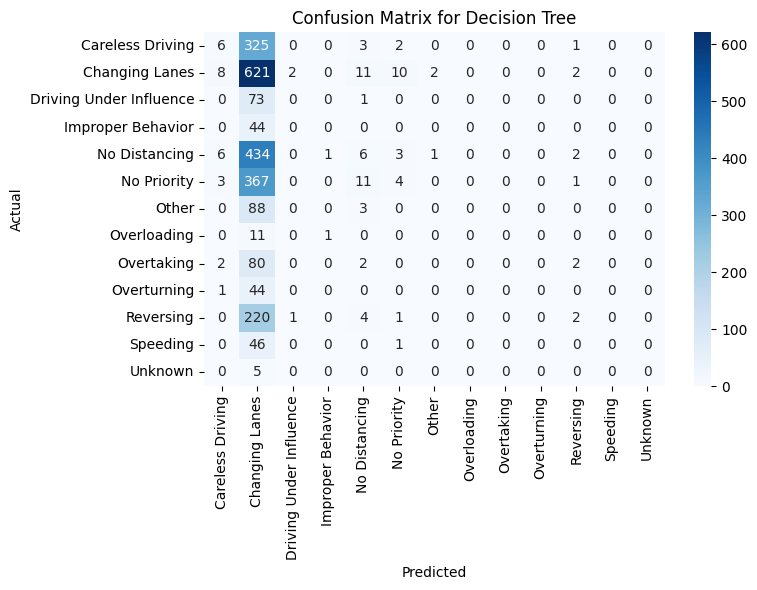

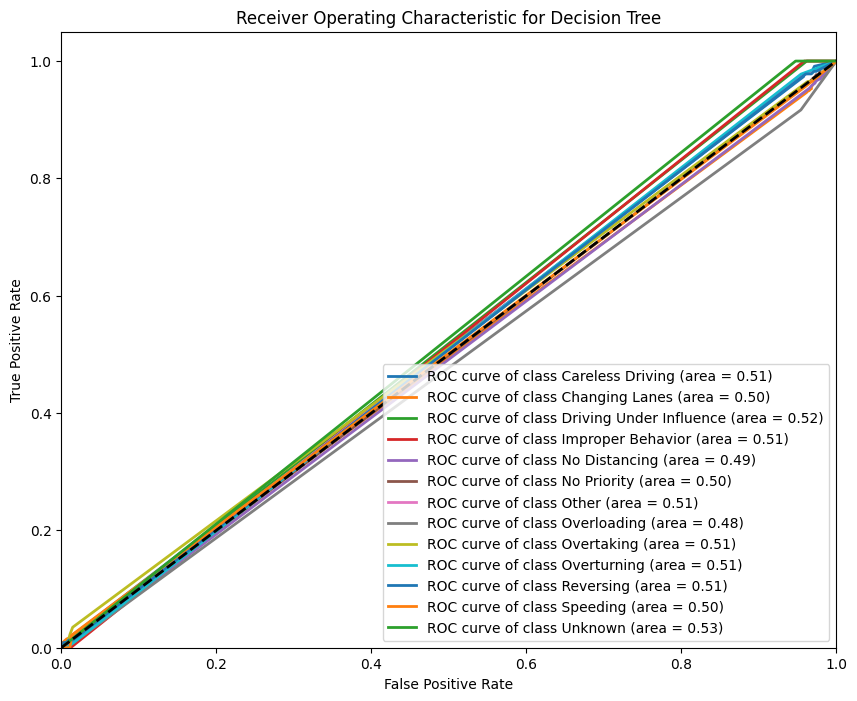


Classification Report for Logistic Regression:
                         precision    recall  f1-score   support

       Careless Driving       0.14      0.08      0.10       337
         Changing Lanes       0.26      0.60      0.37       656
Driving Under Influence       0.00      0.00      0.00        74
      Improper Behavior       0.00      0.00      0.00        44
          No Distancing       0.20      0.18      0.19       453
            No Priority       0.18      0.14      0.16       386
                  Other       0.00      0.00      0.00        91
            Overloading       0.00      0.00      0.00        12
             Overtaking       0.00      0.00      0.00        86
            Overturning       0.00      0.00      0.00        45
              Reversing       0.11      0.03      0.05       228
               Speeding       0.00      0.00      0.00        47
                Unknown       0.00      0.00      0.00         5

               accuracy                 

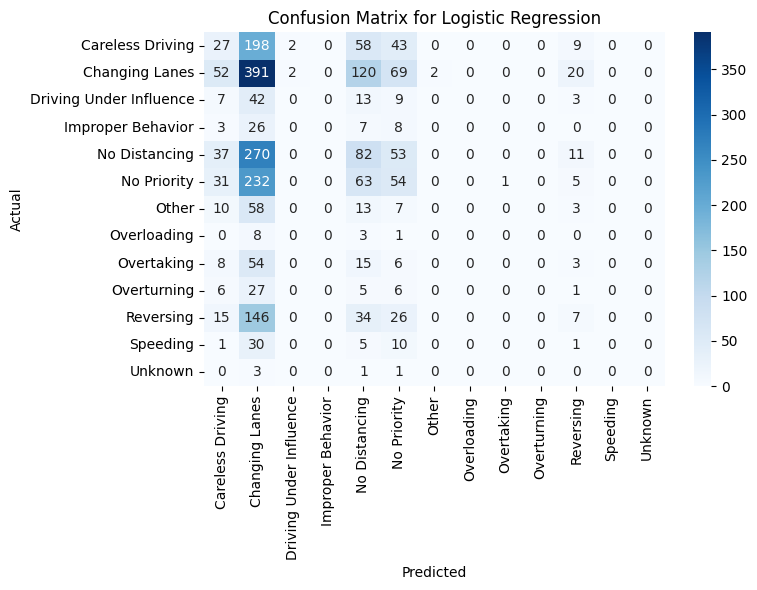

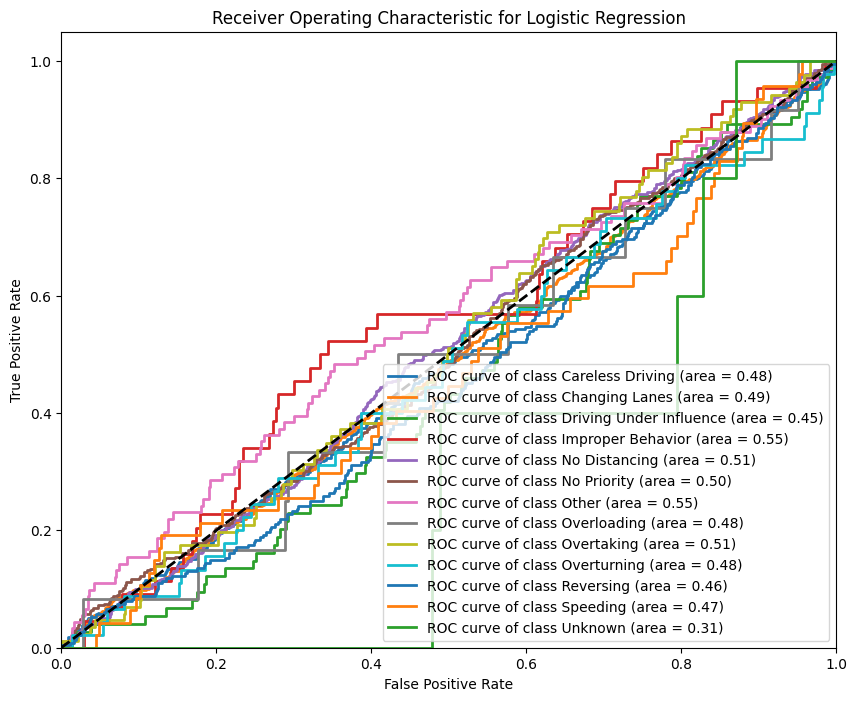


Model Performance Comparison:
        Metric  Decision Tree  Logistic Regression
0     Accuracy       0.259334             0.227679
1    Precision       0.176927             0.163977
2       Recall       0.259334             0.227679
3     F1-Score       0.123330             0.175018
4  Cohen Kappa      -0.002375             0.005076
5      ROC AUC       0.501127             0.493647

Applying SHAP for Logistic Regression...


ValueError: The option feature_dependence has been renamed to feature_perturbation!

In [ ]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time

# Machine Learning Models and Evaluation Metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, confusion_matrix, classification_report,
    cohen_kappa_score, roc_curve, auc
)

# Explainable AI Libraries
import shap
from lime import lime_tabular
from sklearn.inspection import PartialDependenceDisplay

# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')


df = pd.read_excel('/content/cleaned_accident_data(OtherColumns removed).xlsx')

# Display the first few rows
print("First 5 rows of the dataset:")
print(df.head())


# Display missing values in each column
print("\nMissing values in each column:")
print(df.isnull().sum())

# Define categorical and numerical columns based on your dataset
categorical_columns = [
    'Time', 'Day_of_week', 'Age_band_of_driver', 'Sex_of_driver',
    'Educational_level', 'Vehicle_driver_relation', 'Driving_experience',
    'Owner_of_vehicle', 'Defect_of_vehicle', 'Lanes_or_Medians',
    'Road_allignment', 'Types_of_Junction', 'Road_surface_type',
    'Road_surface_conditions', 'Light_conditions', 'Weather_conditions',
    'Type_of_collision', 'Casualty_class', 'Sex_of_casualty',
    'Age_band_of_casualty', 'Casualty_severity', 'Work_of_casuality',
    'Fitness_of_casuality', 'Accident_severity', 'Part_of_day',
    'Type_of_vehicle_standardized', 'Area_accident_occured_standardized',
    'Vehicle_movement_standardized', 'Pedestrian_movement_standardized',
    'Cause_of_accident_standardized'
]

numerical_columns = [
    'Hour', 'Number_of_vehicles_involved', 'Number_of_casualties'
]

# Fill missing values in categorical columns with 'Unknown'
df[categorical_columns] = df[categorical_columns].fillna('Unknown')

# Fill missing values in numerical columns with the median
for col in numerical_columns:
    if col in df.columns:
        if df[col].isnull().sum() > 0:
            median_value = df[col].median()
            df[col].fillna(median_value, inplace=True)
            print(f"Filled missing values in '{col}' with median value {median_value}.")
        else:
            print(f"No missing values in '{col}'.")



# Define Binary Features
binary_features = ['Sex_of_driver', 'Sex_of_casualty']

# Define Ordinal Features and Their Mappings
ordinal_features = {
    'Age_band_of_driver': {
        'Under 18': 1,
        '18-30': 2,
        '31-50': 3,
        'Over 51': 4,
        'Unknown': 0  # Mapping 'Unknown' to 0
    },
    'Age_band_of_casualty': {
        'Under 18': 1,
        '18-30': 2,
        '31-50': 3,
        'Over 51': 4,
        '5': 0,          # Assuming '5' is an error or unspecified
        'Unknown': 0
    },
    'Driving_experience': {
        'No Licence': 0,
        'Below 1yr': 1,
        '1-2yr': 2,
        '2-5yr': 3,
        '5-10yr': 4,
        'Above 10yr': 5,
        'Unknown': 6,
        'unknown': 6     # Handling case-insensitive 'unknown'
    },
    'Casualty_severity': {  # Assuming an order
        '1': 1,
        '2': 2,
        '3': 3,
        'na': 0,             # Treat 'na' as 0 or 'Unknown'
        'Unknown': 0
    },
    'Accident_severity': {  # Assuming an order
        'Slight Injury': 1,
        'Serious Injury': 2,
        'Fatal injury': 3,
        'Unknown': 0
    },
    'Fitness_of_casuality': {  # Example mapping
        'Normal': 1,
        'Driver': 2,
        'Deaf': 3,
        'Other': 4,
        'Blind': 5,
        'Unknown': 0
    },
    'Work_of_casuality': {  # Example mapping
        'Unknown': 0,
        'Driver': 1,
        'Other': 2,
        'Unemployed': 3,
        'Employee': 4,
        'Self-employed': 5,
        'Student': 6
    }
}

# Apply Ordinal Encoding
for feature, mapping in ordinal_features.items():
    encoded_feature = feature + '_encoded'
    df[encoded_feature] = df[feature].map(mapping).fillna(0).astype(int)

# Verify Ordinal Encoding
print("\nEncoded Ordinal Features:")
ordinal_encoded_cols = [f"{feat}_encoded" for feat in ordinal_features.keys()]
print(df[ordinal_encoded_cols].head())

# Apply Label Encoding to Binary Features
le = LabelEncoder()
for feature in binary_features:
    encoded_feature = feature + '_encoded'
    df[encoded_feature] = le.fit_transform(df[feature].astype(str))
    print(f"Encoded '{feature}' with classes: {le.classes_}")

# Verify Label Encoding
print("\nEncoded Binary Features:")
binary_encoded_cols = [f"{feat}_encoded" for feat in binary_features]
print(df[binary_encoded_cols].head())

# Define Nominal Features (excluding Binary and Ordinal Features)
nominal_features = [
    'Time', 'Day_of_week', 'Educational_level', 'Vehicle_driver_relation',
    'Owner_of_vehicle', 'Defect_of_vehicle', 'Lanes_or_Medians',
    'Road_allignment', 'Types_of_Junction', 'Road_surface_type',
    'Road_surface_conditions', 'Light_conditions', 'Weather_conditions',
    'Type_of_collision', 'Casualty_class', 'Part_of_day',
    'Type_of_vehicle_standardized', 'Area_accident_occured_standardized',
    'Vehicle_movement_standardized', 'Pedestrian_movement_standardized'
    # Note: 'Cause_of_accident_standardized' is the target and is excluded
]

# Apply One-Hot Encoding to Nominal Features
df_encoded = pd.get_dummies(df, columns=nominal_features, drop_first=True)



# Define the target variable
target = 'Cause_of_accident_standardized'

# Verify that the target exists in df_encoded
if target not in df_encoded.columns:
    print(f"\nError: Target column '{target}' not found in the DataFrame.")
else:
    # Define the feature matrix by dropping the target column
    # Additionally, drop original categorical columns to prevent 'Unknown' strings
    original_categorical_cols = [
        'Age_band_of_driver', 'Sex_of_driver', 'Driving_experience',
        'Sex_of_casualty', 'Age_band_of_casualty', 'Casualty_severity',
        'Work_of_casuality', 'Fitness_of_casuality', 'Accident_severity'
    ]

    X = df_encoded.drop(columns=[target] + original_categorical_cols)

    # Define the target vector
    y = df_encoded[target]

    print(f"\nFeature matrix shape: {X.shape}")
    print(f"Target vector shape: {y.shape}")


if target in df_encoded.columns:
    # Check data types of all features in X
    print("\nData Types in Feature Matrix (X):")
    print(X.dtypes.value_counts())

    # Check for any non-numeric columns
    non_numeric_columns = X.select_dtypes(include=['object']).columns.tolist()
    print("\nNon-numeric columns in Feature Matrix:", non_numeric_columns)

    if non_numeric_columns:
        print("\nError: The following columns are non-numeric and need to be encoded:")
        print(non_numeric_columns)
    else:
        print("\nAll features are numeric.")


    contains_unknown = X.apply(lambda col: col.astype(str).str.contains('Unknown').any())
    columns_with_unknown = contains_unknown[contains_unknown].index.tolist()
    print("\nColumns containing 'Unknown':", columns_with_unknown)

    if columns_with_unknown:
        print("\nError: The following columns contain 'Unknown' and need to be encoded:")
        print(columns_with_unknown)
    else:
        print("\nNo 'Unknown' values found in the feature matrix.")

    # Additional verification: Check for NaN values
    print("\nChecking for NaN values in Feature Matrix:")
    print(X.isnull().sum())

    if X.isnull().sum().any():
        print("\nError: There are still missing values in the feature matrix. Please handle them before modeling.")
    else:
        print("\nNo missing values found in the feature matrix.")


# Define features to scale (numerical features)
features_to_scale = ['Hour', 'Number_of_vehicles_involved', 'Number_of_casualties']

# Verify that these features exist in the feature matrix
existing_features_to_scale = [feature for feature in features_to_scale if feature in X.columns]
print(f"\nFeatures to scale: {existing_features_to_scale}")

# Initialize the scaler
scaler = StandardScaler()

# Apply scaling
X[existing_features_to_scale] = scaler.fit_transform(X[existing_features_to_scale])

# Verify scaling
print("\nScaled Numerical Features:")
print(X[existing_features_to_scale].head())



# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y  # Ensures proportional representation of classes
)

print(f"\nTraining set size: {X_train.shape}")
print(f"Testing set size: {X_test.shape}")



# Initialize the Decision Tree Classifier
dt_classifier = DecisionTreeClassifier(
    random_state=42,
    max_depth=10,  # Adjust depth to prevent overfitting
    min_samples_split=5,
    min_samples_leaf=2
)

# Train the Decision Tree model
start_time = time.time()
dt_classifier.fit(X_train, y_train)
end_time = time.time()
dt_training_time = end_time - start_time
print(f"\nDecision Tree Training Time: {dt_training_time:.4f} seconds")

# Initialize the Logistic Regression Classifier
lr_classifier = LogisticRegression(
    multi_class='multinomial',
    solver='lbfgs',
    max_iter=1000,
    random_state=42
)

# Train the Logistic Regression model
start_time = time.time()
lr_classifier.fit(X_train, y_train)
end_time = time.time()
lr_training_time = end_time - start_time
print(f"Logistic Regression Training Time: {lr_training_time:.4f} seconds")



def evaluate_model(model, X_test, y_test, model_name):
    """
    Evaluates the given model on the test data and prints performance metrics.

    Parameters:
    - model: Trained machine learning model.
    - X_test: Features for testing.
    - y_test: True labels for testing.
    - model_name: Name of the model (string).

    Returns:
    - metrics_dict: Dictionary containing the calculated metrics.
    """
    metrics_dict = {}

    # Predictions
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test) if hasattr(model, "predict_proba") else None

    # Calculate metrics
    metrics_dict['Accuracy'] = accuracy_score(y_test, y_pred)
    metrics_dict['Precision'] = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    metrics_dict['Recall'] = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    metrics_dict['F1-Score'] = f1_score(y_test, y_pred, average='weighted', zero_division=0)
    metrics_dict['Cohen Kappa'] = cohen_kappa_score(y_test, y_pred)

    # ROC AUC
    if y_pred_proba is not None:
        if len(model.classes_) == 2:
            metrics_dict['ROC AUC'] = roc_auc_score(y_test, y_pred_proba[:,1])
        else:
            metrics_dict['ROC AUC'] = roc_auc_score(
                y_test, y_pred_proba, multi_class='ovr', average='weighted'
            )
    else:
        metrics_dict['ROC AUC'] = 'N/A'

    # Print Classification Report
    print(f"\nClassification Report for {model_name}:")
    print(classification_report(y_test, y_pred, zero_division=0))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8,6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=model.classes_, yticklabels=model.classes_)
    plt.title(f'Confusion Matrix for {model_name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.tight_layout()
    plt.show()

    # ROC Curve
    if metrics_dict['ROC AUC'] != 'N/A':
        if len(model.classes_) == 2:
            fpr, tpr, _ = roc_curve(y_test, y_pred_proba[:,1], pos_label=model.classes_[1])
            roc_auc = auc(fpr, tpr)
            plt.figure(figsize=(8,6))
            plt.plot(fpr, tpr, color='darkorange',
                     lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
            plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'Receiver Operating Characteristic for {model_name}')
            plt.legend(loc="lower right")
            plt.show()
        else:
            from sklearn.preprocessing import label_binarize
            from sklearn.metrics import roc_curve, auc
            n_classes = len(model.classes_)
            y_test_binarized = label_binarize(y_test, classes=model.classes_)
            fpr = dict()
            tpr = dict()
            roc_auc = dict()
            for i in range(n_classes):
                fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
                roc_auc[i] = auc(fpr[i], tpr[i])

            # Plot all ROC curves
            plt.figure(figsize=(10,8))
            for i in range(n_classes):
                plt.plot(fpr[i], tpr[i], lw=2,
                         label=f'ROC curve of class {model.classes_[i]} (area = {roc_auc[i]:0.2f})')
            plt.plot([0, 1], [0, 1], 'k--', lw=2)
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'Receiver Operating Characteristic for {model_name}')
            plt.legend(loc="lower right")
            plt.show()

    return metrics_dict



# Evaluate Decision Tree
dt_metrics = evaluate_model(dt_classifier, X_test, y_test, "Decision Tree")

# Evaluate Logistic Regression
lr_metrics = evaluate_model(lr_classifier, X_test, y_test, "Logistic Regression")

# Summarize Model Performance
performance_df = pd.DataFrame({
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Cohen Kappa', 'ROC AUC'],
    'Decision Tree': [
        dt_metrics.get('Accuracy'),
        dt_metrics.get('Precision'),
        dt_metrics.get('Recall'),
        dt_metrics.get('F1-Score'),
        dt_metrics.get('Cohen Kappa'),
        dt_metrics.get('ROC AUC')
    ],
    'Logistic Regression': [
        lr_metrics.get('Accuracy'),
        lr_metrics.get('Precision'),
        lr_metrics.get('Recall'),
        lr_metrics.get('F1-Score'),
        lr_metrics.get('Cohen Kappa'),
        lr_metrics.get('ROC AUC')
    ]
})

print("\nModel Performance Comparison:")
print(performance_df)



if not columns_with_unknown and not non_numeric_columns and not X.isnull().sum().any():
    # 12.1. SHAP (SHapley Additive exPlanations)
    print("\nApplying SHAP for Logistic Regression...")
    explainer_shap = shap.LinearExplainer(lr_classifier, X_train, feature_dependence="independent")
    shap_values = explainer_shap.shap_values(X_test)

    # SHAP Summary Plot
    plt.figure(figsize=(12,8))
    shap.summary_plot(shap_values, X_test, plot_type="bar")

    # 12.2. LIME (Local Interpretable Model-agnostic Explanations)
    print("\nApplying LIME for Logistic Regression...")
    explainer_lime = lime_tabular.LimeTabularExplainer(
        training_data=np.array(X_train),
        feature_names=X.columns,
        class_names=lr_classifier.classes_,
        mode='classification'
    )

    # Explain a few samples
    num_samples = 3
    samples = X_test.sample(n=num_samples, random_state=42)

    for i in range(num_samples):
        sample = samples.iloc[i].values.reshape(1, -1)
        explanation = explainer_lime.explain_instance(
            data_row=samples.iloc[i],
            predict_fn=lr_classifier.predict_proba
        )
        print(f"\nLIME Explanation for Sample {i+1}:")
        explanation.show_in_notebook(show_table=True, show_all=False)
        # For scripts, you can save the explanation as an HTML file:
        # explanation.save_to_file(f'lime_explanation_sample_{i+1}.html')

    # 12.3. Partial Dependence Plots (PDP)
    print("\nGenerating Partial Dependence Plots...")
    features_pdp = ['Hour', 'Driving_experience_encoded', 'Age_band_of_driver_encoded']

    plt.figure(figsize=(20,5))
    PartialDependenceDisplay.from_estimator(
        lr_classifier,
        X_train,
        features_pdp,
        kind='average',
        grid_resolution=20
    )
    plt.suptitle('Partial Dependence Plots - Logistic Regression', fontsize=16)
    plt.tight_layout()
    plt.show()
else:
    print("\nSkipping XAI techniques due to encoding issues. Please resolve the errors above before applying XAI.")

# --------------------------------------------
# 13. Visualize Feature Importances
# --------------------------------------------

# Proceed only if there are no encoding issues
if not columns_with_unknown and not non_numeric_columns and not X.isnull().sum().any():
    # 13.1. Feature Importance for Logistic Regression
    print("\nVisualizing Feature Importances for Logistic Regression...")
    lr_coefficients = pd.Series(lr_classifier.coef_.flatten(), index=X.columns)
    lr_feature_importances = lr_coefficients.abs().sort_values(ascending=False)

    plt.figure(figsize=(12,8))
    lr_feature_importances.head(20).plot(kind='barh', color='salmon')
    plt.title('Top 20 Feature Importances - Logistic Regression', fontsize=16)
    plt.xlabel('Coefficient Magnitude', fontsize=14)
    plt.ylabel('Features', fontsize=14)
    plt.gca().invert_yaxis()  # Highest importance at the top
    plt.tight_layout()
    plt.show()

    # 13.2. Feature Importance for Decision Tree
    print("\nVisualizing Feature Importances for Decision Tree...")
    dt_feature_importances = pd.Series(dt_classifier.feature_importances_, index=X.columns).sort_values(ascending=False)

    plt.figure(figsize=(12,8))
    dt_feature_importances.head(20).plot(kind='barh', color='skyblue')
    plt.title('Top 20 Feature Importances - Decision Tree', fontsize=16)
    plt.xlabel('Importance Score', fontsize=14)
    plt.ylabel('Features', fontsize=14)
    plt.gca().invert_yaxis()  # Highest importance at the top
    plt.tight_layout()
    plt.show()

    # 13.3. Comparing Feature Importances Across Models
    print("\nComparing Feature Importances Between Models...")
    comparison_df = pd.DataFrame({
        'Logistic Regression': lr_feature_importances.head(20),
        'Decision Tree': dt_feature_importances.head(20)
    })

    comparison_df.plot(kind='barh', figsize=(14,10), color=['salmon', 'skyblue'])
    plt.title('Feature Importances Comparison: Logistic Regression vs Decision Tree', fontsize=16)
    plt.xlabel('Importance Score')
    plt.ylabel('Features')
    plt.gca().invert_yaxis()
    plt.legend()
    plt.tight_layout()
    plt.show()
else:
    print("\nSkipping Feature Importance visualization due to encoding issues. Please resolve the errors above before visualizing feature importances.")

# --------------------------------------------
# 14. Final Verification
# --------------------------------------------

# Final check to ensure no 'Unknown' values and all features are numeric
if not columns_with_unknown and not non_numeric_columns and not X.isnull().sum().any():
    print("\nData preprocessing completed successfully. Your dataset is ready for modeling.")
else:
    print("\nData preprocessing encountered issues. Please review the errors above.")


Predicting  Accident  Severity


In [ ]:
# Define the target variable
target = 'Accident_severity_encoded'

# Define the feature matrix by dropping the target and original categorical columns
original_categorical_cols = [
    'Age_band_of_driver', 'Sex_of_driver', 'Driving_experience',
    'Sex_of_casualty', 'Age_band_of_casualty', 'Casualty_severity',
    'Work_of_casuality', 'Fitness_of_casuality', 'Accident_severity'
]

X = df_encoded.drop(columns=[target] + original_categorical_cols)

# Define the target vector
y = df_encoded[target]

print(f"\nFeature matrix shape: {X.shape}")
print(f"Target vector shape: {y.shape}")



Feature matrix shape: (12316, 1191)
Target vector shape: (12316,)


In [ ]:
# Check data types of all features in X
print("\nData Types in Feature Matrix (X):")
print(X.dtypes.value_counts())

# Check for any non-numeric columns
non_numeric_columns = X.select_dtypes(include=['object']).columns.tolist()
print("\nNon-numeric columns in Feature Matrix:", non_numeric_columns)

if non_numeric_columns:
    print("\nError: The following columns are non-numeric and need to be encoded:")
    print(non_numeric_columns)
else:
    print("\nAll features are numeric.")

# Check for any 'Unknown' string values in X
contains_unknown = X.apply(lambda col: col.astype(str).str.contains('Unknown').any())
columns_with_unknown = contains_unknown[contains_unknown].index.tolist()
print("\nColumns containing 'Unknown':", columns_with_unknown)

if columns_with_unknown:
    print("\nError: The following columns contain 'Unknown' and need to be encoded:")
    print(columns_with_unknown)
else:
    print("\nNo 'Unknown' values found in the feature matrix.")

# Additional verification: Check for NaN values
print("\nChecking for NaN values in Feature Matrix:")
print(X.isnull().sum())

if X.isnull().sum().any():
    print("\nError: There are still missing values in the feature matrix. Please handle them before modeling.")
else:
    print("\nNo missing values found in the feature matrix.")



Data Types in Feature Matrix (X):
bool      1179
int64       11
object       1
Name: count, dtype: int64

Non-numeric columns in Feature Matrix: ['Cause_of_accident_standardized']

Error: The following columns are non-numeric and need to be encoded:
['Cause_of_accident_standardized']

Columns containing 'Unknown': ['Cause_of_accident_standardized']

Error: The following columns contain 'Unknown' and need to be encoded:
['Cause_of_accident_standardized']

Checking for NaN values in Feature Matrix:
Number_of_vehicles_involved                          0
Number_of_casualties                                 0
Hour                                                 0
Cause_of_accident_standardized                       0
Age_band_of_driver_encoded                           0
                                                    ..
Vehicle_movement_standardized_Unknown                0
Pedestrian_movement_standardized_Not a Pedestrian    0
Pedestrian_movement_standardized_Stationary          0
Pe

In [ ]:
# Define features to scale (numerical features)
features_to_scale = ['Hour', 'Number_of_vehicles_involved', 'Number_of_casualties']

# Verify that these features exist in the feature matrix
existing_features_to_scale = [feature for feature in features_to_scale if feature in X.columns]
print(f"\nFeatures to scale: {existing_features_to_scale}")

# Initialize the scaler
scaler = StandardScaler()

# Apply scaling
X[existing_features_to_scale] = scaler.fit_transform(X[existing_features_to_scale])

# Verify scaling
print("\nScaled Numerical Features:")
print(X[existing_features_to_scale].head())



Features to scale: ['Hour', 'Number_of_vehicles_involved', 'Number_of_casualties']

Scaled Numerical Features:
       Hour  Number_of_vehicles_involved  Number_of_casualties
0  0.608178                    -0.059061              0.448649
1  0.608178                    -0.059061              0.448649
2  0.608178                    -0.059061              0.448649
3 -2.467141                    -0.059061              0.448649
4 -2.467141                    -0.059061              0.448649


In [ ]:
# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y  # Ensures proportional representation of classes
)

print(f"\nTraining set size: {X_train.shape}")
print(f"Testing set size: {X_test.shape}")



Training set size: (9852, 1191)
Testing set size: (2464, 1191)


First 5 rows of the dataset:
       Time Day_of_week Age_band_of_driver Sex_of_driver   Educational_level  \
0  17:02:00      Monday              18-30          Male   Above High School   
1  17:02:00      Monday              31-50          Male  Junior High School   
2  17:02:00      Monday              18-30          Male  Junior High School   
3  01:06:00      Sunday              18-30          Male  Junior High School   
4  01:06:00      Sunday              18-30          Male  Junior High School   

  Vehicle_driver_relation Driving_experience Owner_of_vehicle  \
0                Employee              1-2yr            Owner   
1                Employee         Above 10yr            Owner   
2                Employee              1-2yr            Owner   
3                Employee             5-10yr     Governmental   
4                Employee              2-5yr            Owner   

  Defect_of_vehicle   Lanes_or_Medians  ... Work_of_casuality  \
0         No defect            Unk

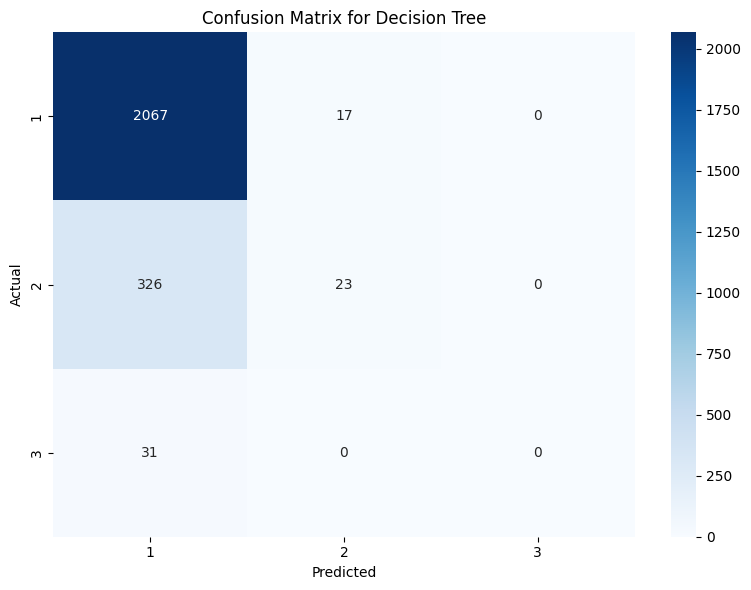

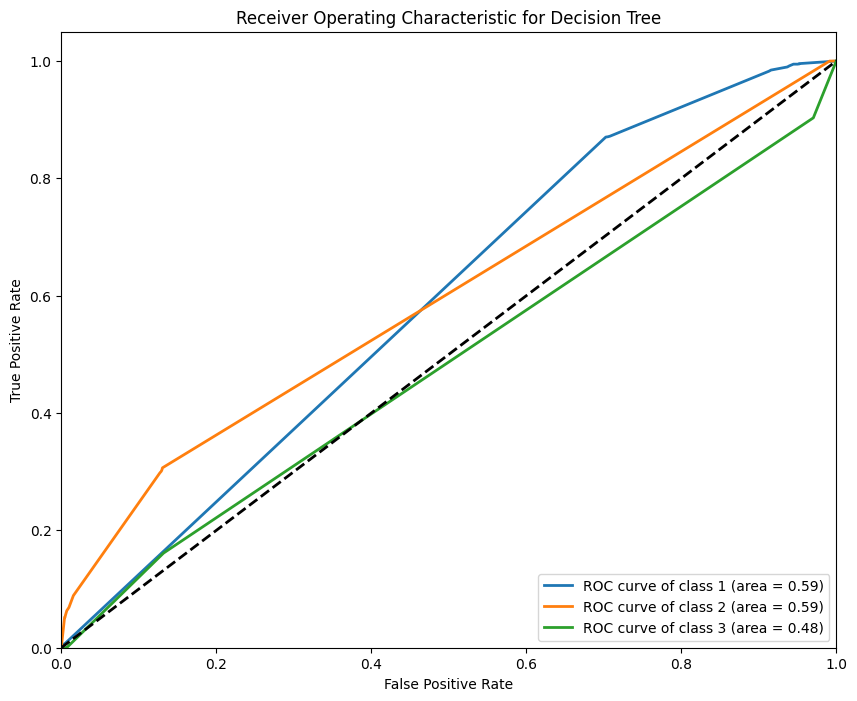


Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           1       0.85      0.98      0.91      2084
           2       0.45      0.08      0.13       349
           3       0.67      0.06      0.12        31

    accuracy                           0.84      2464
   macro avg       0.66      0.38      0.39      2464
weighted avg       0.79      0.84      0.79      2464



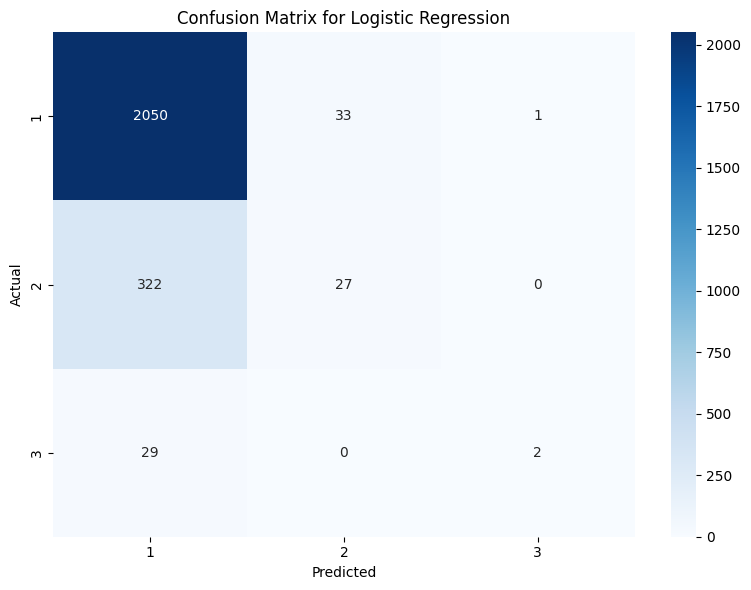

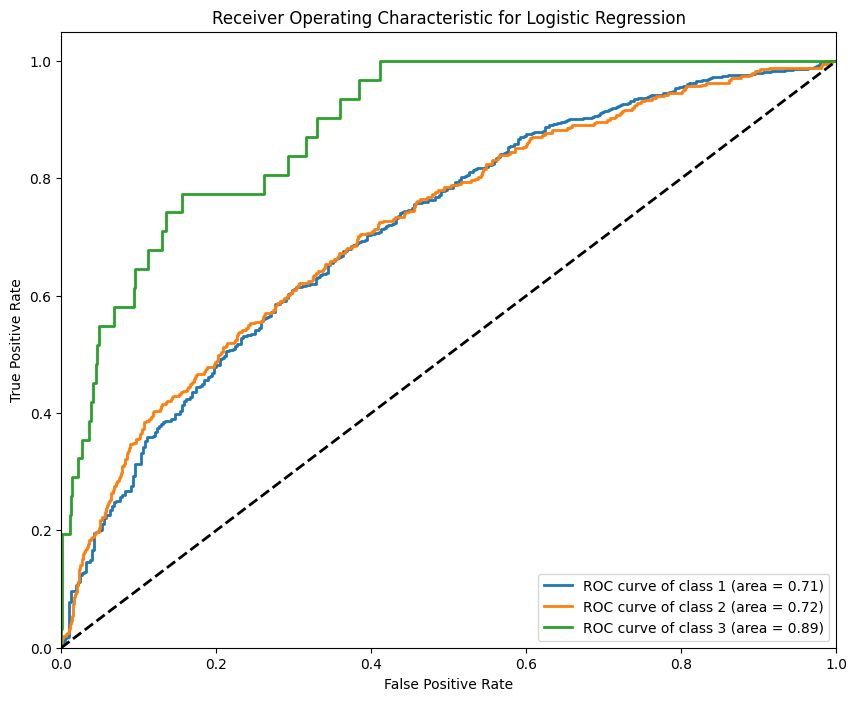


Model Performance Comparison:
        Metric  Decision Tree  Logistic Regression
0     Accuracy       0.848214             0.843750
1    Precision       0.802658             0.794261
2       Recall       0.848214             0.843750
3     F1-Score       0.792359             0.793357
4  Cohen Kappa       0.083705             0.093580
5      ROC AUC       0.587167             0.717217

Applying SHAP for Logistic Regression...

SHAP encountered an error: feature_perturbation must be one of 'interventional' or 'correlation_dependent'

Applying LIME for Logistic Regression...

LIME Explanation for Sample 1:



LIME Explanation for Sample 2:



LIME Explanation for Sample 3:



Generating Partial Dependence Plots...

Partial Dependence Plots encountered an error: target must be specified for multi-class

Visualizing Feature Importances for Logistic Regression...


ValueError: Length of values (3570) does not match length of index (1190)

<Figure size 2000x500 with 0 Axes>

In [ ]:
# --------------------------------------------
# 1. Import Necessary Libraries
# --------------------------------------------
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time

# Machine Learning Models and Evaluation Metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, confusion_matrix, classification_report,
    cohen_kappa_score, roc_curve, auc
)

# Explainable AI Libraries (Optional)
import shap
from lime import lime_tabular
from sklearn.inspection import PartialDependenceDisplay

# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')

# --------------------------------------------
# 2. Load Your Dataset
# --------------------------------------------

# Replace 'your_dataset.csv' with your actual dataset file path
df = pd.read_excel('/content/cleaned_accident_data(OtherColumns removed).xlsx')

# Display the first few rows
print("First 5 rows of the dataset:")
print(df.head())

# --------------------------------------------
# 3. Handle Missing Values
# --------------------------------------------

# Display missing values in each column
print("\nMissing values in each column:")
print(df.isnull().sum())

# Define categorical and numerical columns based on your dataset
categorical_columns = [
    'Time', 'Day_of_week', 'Age_band_of_driver', 'Sex_of_driver',
    'Educational_level', 'Vehicle_driver_relation', 'Driving_experience',
    'Owner_of_vehicle', 'Defect_of_vehicle', 'Lanes_or_Medians',
    'Road_allignment', 'Types_of_Junction', 'Road_surface_type',
    'Road_surface_conditions', 'Light_conditions', 'Weather_conditions',
    'Type_of_collision', 'Casualty_class', 'Sex_of_casualty',
    'Age_band_of_casualty', 'Casualty_severity', 'Work_of_casuality',
    'Fitness_of_casuality', 'Accident_severity', 'Part_of_day',
    'Type_of_vehicle_standardized', 'Area_accident_occured_standardized',
    'Vehicle_movement_standardized', 'Pedestrian_movement_standardized',
    'Cause_of_accident_standardized'
]

numerical_columns = [
    'Hour', 'Number_of_vehicles_involved', 'Number_of_casualties'
]

# Fill missing values in categorical columns with 'Unknown'
df[categorical_columns] = df[categorical_columns].fillna('Unknown')

# Fill missing values in numerical columns with the median
for col in numerical_columns:
    if col in df.columns:
        if df[col].isnull().sum() > 0:
            median_value = df[col].median()
            df[col].fillna(median_value, inplace=True)
            print(f"Filled missing values in '{col}' with median value {median_value}.")
        else:
            print(f"No missing values in '{col}'.")

# --------------------------------------------
# 4. Encode Categorical Variables
# --------------------------------------------

# Define Binary Features
binary_features = ['Sex_of_driver', 'Sex_of_casualty']

# Define Ordinal Features and Their Mappings
ordinal_features = {
    'Age_band_of_driver': {
        'Under 18': 1,
        '18-30': 2,
        '31-50': 3,
        'Over 51': 4,
        'Unknown': 0  # Mapping 'Unknown' to 0
    },
    'Age_band_of_casualty': {
        'Under 18': 1,
        '18-30': 2,
        '31-50': 3,
        'Over 51': 4,
        '5': 0,          # Assuming '5' is an error or unspecified
        'Unknown': 0
    },
    'Driving_experience': {
        'No Licence': 0,
        'Below 1yr': 1,
        '1-2yr': 2,
        '2-5yr': 3,
        '5-10yr': 4,
        'Above 10yr': 5,
        'Unknown': 6,
        'unknown': 6     # Handling case-insensitive 'unknown'
    },
    'Casualty_severity': {  # Assuming an order
        '1': 1,
        '2': 2,
        '3': 3,
        'na': 0,             # Treat 'na' as 0 or 'Unknown'
        'Unknown': 0
    },
    'Accident_severity': {  # Assuming an order
        'Slight Injury': 1,
        'Serious Injury': 2,
        'Fatal injury': 3,
        'Unknown': 0
    },
    'Fitness_of_casuality': {  # Example mapping
        'Normal': 1,
        'Driver': 2,
        'Deaf': 3,
        'Other': 4,
        'Blind': 5,
        'Unknown': 0
    },
    'Work_of_casuality': {  # Example mapping
        'Unknown': 0,
        'Driver': 1,
        'Other': 2,
        'Unemployed': 3,
        'Employee': 4,
        'Self-employed': 5,
        'Student': 6
    }
}

# Apply Ordinal Encoding
for feature, mapping in ordinal_features.items():
    encoded_feature = feature + '_encoded'
    df[encoded_feature] = df[feature].map(mapping).fillna(0).astype(int)

# Verify Ordinal Encoding
print("\nEncoded Ordinal Features:")
ordinal_encoded_cols = [f"{feat}_encoded" for feat in ordinal_features.keys()]
print(df[ordinal_encoded_cols].head())

# Apply Label Encoding to Binary Features
le = LabelEncoder()
for feature in binary_features:
    encoded_feature = feature + '_encoded'
    df[encoded_feature] = le.fit_transform(df[feature].astype(str))
    print(f"Encoded '{feature}' with classes: {le.classes_}")

# Verify Label Encoding
print("\nEncoded Binary Features:")
binary_encoded_cols = [f"{feat}_encoded" for feat in binary_features]
print(df[binary_encoded_cols].head())

# Define Nominal Features (excluding Binary and Ordinal Features)
nominal_features = [
    'Time', 'Day_of_week', 'Educational_level', 'Vehicle_driver_relation',
    'Owner_of_vehicle', 'Defect_of_vehicle', 'Lanes_or_Medians',
    'Road_allignment', 'Types_of_Junction', 'Road_surface_type',
    'Road_surface_conditions', 'Light_conditions', 'Weather_conditions',
    'Type_of_collision', 'Casualty_class', 'Part_of_day',
    'Type_of_vehicle_standardized', 'Area_accident_occured_standardized',
    'Vehicle_movement_standardized', 'Pedestrian_movement_standardized'
    # Note: 'Cause_of_accident_standardized' is the target and is excluded
]

# Apply One-Hot Encoding to Nominal Features
df_encoded = pd.get_dummies(df, columns=nominal_features, drop_first=True)

# --------------------------------------------
# 5. Define Feature Matrix (X) and Target Vector (y)
# --------------------------------------------

# Define the target variable
target = 'Accident_severity_encoded'  # Ensure this is the correct encoded target

# Define the feature matrix by dropping the target and original categorical columns
original_categorical_cols = [
    'Age_band_of_driver', 'Sex_of_driver', 'Driving_experience',
    'Sex_of_casualty', 'Age_band_of_casualty', 'Casualty_severity',
    'Work_of_casuality', 'Fitness_of_casuality', 'Accident_severity',
    'Cause_of_accident_standardized'  # Important: Drop this to remove 'Changing Lanes'
]

X = df_encoded.drop(columns=[target] + original_categorical_cols)

# Define the target vector
y = df_encoded[target]

print(f"\nFeature matrix shape: {X.shape}")
print(f"Target vector shape: {y.shape}")

# --------------------------------------------
# 6. Verify the Encoded Feature Matrix
# --------------------------------------------

# Check data types of all features in X
print("\nData Types in Feature Matrix (X):")
print(X.dtypes.value_counts())

# Check for any non-numeric columns
non_numeric_columns = X.select_dtypes(include=['object']).columns.tolist()
print("\nNon-numeric columns in Feature Matrix:", non_numeric_columns)

if non_numeric_columns:
    print("\nError: The following columns are non-numeric and need to be encoded:")
    print(non_numeric_columns)
else:
    print("\nAll features are numeric.")

# Check for any 'Unknown' string values in X
# Since all non-numeric columns have been handled, this should be zero
contains_unknown = X.apply(lambda col: col.astype(str).str.contains('Unknown').any())
columns_with_unknown = contains_unknown[contains_unknown].index.tolist()
print("\nColumns containing 'Unknown':", columns_with_unknown)

if columns_with_unknown:
    print("\nError: The following columns contain 'Unknown' and need to be encoded:")
    print(columns_with_unknown)
else:
    print("\nNo 'Unknown' values found in the feature matrix.")

# Additional verification: Check for NaN values
print("\nChecking for NaN values in Feature Matrix:")
print(X.isnull().sum())

if X.isnull().sum().any():
    print("\nError: There are still missing values in the feature matrix. Please handle them before modeling.")
else:
    print("\nNo missing values found in the feature matrix.")

# --------------------------------------------
# 7. Feature Scaling
# --------------------------------------------

# Define features to scale (numerical features)
features_to_scale = ['Hour', 'Number_of_vehicles_involved', 'Number_of_casualties']

# Verify that these features exist in the feature matrix
existing_features_to_scale = [feature for feature in features_to_scale if feature in X.columns]
print(f"\nFeatures to scale: {existing_features_to_scale}")

# Initialize the scaler
scaler = StandardScaler()

# Apply scaling
X[existing_features_to_scale] = scaler.fit_transform(X[existing_features_to_scale])

# Verify scaling
print("\nScaled Numerical Features:")
print(X[existing_features_to_scale].head())

# --------------------------------------------
# 8. Split the Dataset into Training and Testing Sets
# --------------------------------------------

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y  # Ensures proportional representation of classes
)

print(f"\nTraining set size: {X_train.shape}")
print(f"Testing set size: {X_test.shape}")

# --------------------------------------------
# 9. Train and Evaluate Machine Learning Models
# --------------------------------------------

# Initialize the Decision Tree Classifier
dt_classifier = DecisionTreeClassifier(
    random_state=42,
    max_depth=10,  # Adjust depth to prevent overfitting
    min_samples_split=5,
    min_samples_leaf=2
)

# Train the Decision Tree model
start_time = time.time()
dt_classifier.fit(X_train, y_train)
end_time = time.time()
dt_training_time = end_time - start_time
print(f"\nDecision Tree Training Time: {dt_training_time:.4f} seconds")

# Initialize the Logistic Regression Classifier
lr_classifier = LogisticRegression(
    multi_class='multinomial',
    solver='lbfgs',
    max_iter=1000,
    random_state=42
)

# Train the Logistic Regression model
start_time = time.time()
lr_classifier.fit(X_train, y_train)
end_time = time.time()
lr_training_time = end_time - start_time
print(f"Logistic Regression Training Time: {lr_training_time:.4f} seconds")

# --------------------------------------------
# 10. Define an Evaluation Function
# --------------------------------------------

def evaluate_model(model, X_test, y_test, model_name):
    """
    Evaluates the given model on the test data and prints performance metrics.

    Parameters:
    - model: Trained machine learning model.
    - X_test: Features for testing.
    - y_test: True labels for testing.
    - model_name: Name of the model (string).

    Returns:
    - metrics_dict: Dictionary containing the calculated metrics.
    """
    metrics_dict = {}

    # Predictions
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test) if hasattr(model, "predict_proba") else None

    # Calculate metrics
    metrics_dict['Accuracy'] = accuracy_score(y_test, y_pred)
    metrics_dict['Precision'] = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    metrics_dict['Recall'] = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    metrics_dict['F1-Score'] = f1_score(y_test, y_pred, average='weighted', zero_division=0)
    metrics_dict['Cohen Kappa'] = cohen_kappa_score(y_test, y_pred)

    # ROC AUC
    if y_pred_proba is not None:
        if len(model.classes_) == 2:
            metrics_dict['ROC AUC'] = roc_auc_score(y_test, y_pred_proba[:,1])
        else:
            metrics_dict['ROC AUC'] = roc_auc_score(
                y_test, y_pred_proba, multi_class='ovr', average='weighted'
            )
    else:
        metrics_dict['ROC AUC'] = 'N/A'

    # Print Classification Report
    print(f"\nClassification Report for {model_name}:")
    print(classification_report(y_test, y_pred, zero_division=0))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8,6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=model.classes_, yticklabels=model.classes_)
    plt.title(f'Confusion Matrix for {model_name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.tight_layout()
    plt.show()

    # ROC Curve
    if metrics_dict['ROC AUC'] != 'N/A':
        if len(model.classes_) == 2:
            fpr, tpr, _ = roc_curve(y_test, y_pred_proba[:,1], pos_label=model.classes_[1])
            roc_auc = auc(fpr, tpr)
            plt.figure(figsize=(8,6))
            plt.plot(fpr, tpr, color='darkorange',
                     lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
            plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'Receiver Operating Characteristic for {model_name}')
            plt.legend(loc="lower right")
            plt.show()
        else:
            from sklearn.preprocessing import label_binarize
            from sklearn.metrics import roc_curve, auc
            n_classes = len(model.classes_)
            y_test_binarized = label_binarize(y_test, classes=model.classes_)
            fpr = dict()
            tpr = dict()
            roc_auc = dict()
            for i in range(n_classes):
                fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
                roc_auc[i] = auc(fpr[i], tpr[i])

            # Plot all ROC curves
            plt.figure(figsize=(10,8))
            for i in range(n_classes):
                plt.plot(fpr[i], tpr[i], lw=2,
                         label=f'ROC curve of class {model.classes_[i]} (area = {roc_auc[i]:0.2f})')
            plt.plot([0, 1], [0, 1], 'k--', lw=2)
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'Receiver Operating Characteristic for {model_name}')
            plt.legend(loc="lower right")
            plt.show()

    return metrics_dict

# --------------------------------------------
# 11. Evaluate the Models
# --------------------------------------------

# Evaluate Decision Tree
dt_metrics = evaluate_model(dt_classifier, X_test, y_test, "Decision Tree")

# Evaluate Logistic Regression
lr_metrics = evaluate_model(lr_classifier, X_test, y_test, "Logistic Regression")

# Summarize Model Performance
performance_df = pd.DataFrame({
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Cohen Kappa', 'ROC AUC'],
    'Decision Tree': [
        dt_metrics.get('Accuracy'),
        dt_metrics.get('Precision'),
        dt_metrics.get('Recall'),
        dt_metrics.get('F1-Score'),
        dt_metrics.get('Cohen Kappa'),
        dt_metrics.get('ROC AUC')
    ],
    'Logistic Regression': [
        lr_metrics.get('Accuracy'),
        lr_metrics.get('Precision'),
        lr_metrics.get('Recall'),
        lr_metrics.get('F1-Score'),
        lr_metrics.get('Cohen Kappa'),
        lr_metrics.get('ROC AUC')
    ]
})

print("\nModel Performance Comparison:")
print(performance_df)

# --------------------------------------------
# 12. Apply Explainable AI (XAI) Techniques (Optional)
# --------------------------------------------

# Since you encountered issues with SHAP earlier, we'll address them here
# Only proceed if there are no encoding issues

if not columns_with_unknown and not non_numeric_columns and not X.isnull().sum().any():
    try:
        # 12.1. SHAP (SHapley Additive exPlanations)
        print("\nApplying SHAP for Logistic Regression...")
        explainer_shap = shap.LinearExplainer(
            lr_classifier,
            X_train,
            feature_perturbation="independent"  # Updated parameter name
        )
        shap_values = explainer_shap.shap_values(X_test)

        # SHAP Summary Plot
        plt.figure(figsize=(12,8))
        shap.summary_plot(shap_values, X_test, plot_type="bar")
    except Exception as e:
        print(f"\nSHAP encountered an error: {e}")

    try:
        # 12.2. LIME (Local Interpretable Model-agnostic Explanations)
        print("\nApplying LIME for Logistic Regression...")
        explainer_lime = lime_tabular.LimeTabularExplainer(
            training_data=np.array(X_train),
            feature_names=X.columns,
            class_names=lr_classifier.classes_,
            mode='classification'
        )

        # Explain a few samples
        num_samples = 3
        samples = X_test.sample(n=num_samples, random_state=42)

        for i in range(num_samples):
            sample = samples.iloc[i].values.reshape(1, -1)
            explanation = explainer_lime.explain_instance(
                data_row=samples.iloc[i],
                predict_fn=lr_classifier.predict_proba
            )
            print(f"\nLIME Explanation for Sample {i+1}:")
            explanation.show_in_notebook(show_table=True, show_all=False)
            # For scripts, you can save the explanation as an HTML file:
            # explanation.save_to_file(f'lime_explanation_sample_{i+1}.html')
    except Exception as e:
        print(f"\nLIME encountered an error: {e}")

    try:
        # 12.3. Partial Dependence Plots (PDP)
        print("\nGenerating Partial Dependence Plots...")
        features_pdp = ['Hour', 'Driving_experience_encoded', 'Age_band_of_driver_encoded']

        plt.figure(figsize=(20,5))
        PartialDependenceDisplay.from_estimator(
            lr_classifier,
            X_train,
            features_pdp,
            kind='average',
            grid_resolution=20
        )
        plt.suptitle('Partial Dependence Plots - Logistic Regression', fontsize=16)
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"\nPartial Dependence Plots encountered an error: {e}")
else:
    print("\nSkipping XAI techniques due to encoding issues. Please resolve the errors above before applying XAI.")

# --------------------------------------------
# 13. Visualize Feature Importances (Optional)
# --------------------------------------------

# Proceed only if there are no encoding issues
if not columns_with_unknown and not non_numeric_columns and not X.isnull().sum().any():
    # 13.1. Feature Importance for Logistic Regression
    print("\nVisualizing Feature Importances for Logistic Regression...")
    lr_coefficients = pd.Series(lr_classifier.coef_.flatten(), index=X.columns)
    lr_feature_importances = lr_coefficients.abs().sort_values(ascending=False)

    plt.figure(figsize=(12,8))
    lr_feature_importances.head(20).plot(kind='barh', color='salmon')
    plt.title('Top 20 Feature Importances - Logistic Regression', fontsize=16)
    plt.xlabel('Coefficient Magnitude', fontsize=14)
    plt.ylabel('Features', fontsize=14)
    plt.gca().invert_yaxis()  # Highest importance at the top
    plt.tight_layout()
    plt.show()

    # 13.2. Feature Importance for Decision Tree
    print("\nVisualizing Feature Importances for Decision Tree...")
    dt_feature_importances = pd.Series(dt_classifier.feature_importances_, index=X.columns).sort_values(ascending=False)

    plt.figure(figsize=(12,8))
    dt_feature_importances.head(20).plot(kind='barh', color='skyblue')
    plt.title('Top 20 Feature Importances - Decision Tree', fontsize=16)
    plt.xlabel('Importance Score', fontsize=14)
    plt.ylabel('Features', fontsize=14)
    plt.gca().invert_yaxis()  # Highest importance at the top
    plt.tight_layout()
    plt.show()

    # 13.3. Comparing Feature Importances Across Models
    print("\nComparing Feature Importances Between Models...")
    comparison_df = pd.DataFrame({
        'Logistic Regression': lr_feature_importances.head(20),
        'Decision Tree': dt_feature_importances.head(20)
    })

    comparison_df.plot(kind='barh', figsize=(14,10), color=['salmon', 'skyblue'])
    plt.title('Feature Importances Comparison: Logistic Regression vs Decision Tree', fontsize=16)
    plt.xlabel('Importance Score')
    plt.ylabel('Features')
    plt.gca().invert_yaxis()
    plt.legend()
    plt.tight_layout()
    plt.show()
else:
    print("\nSkipping Feature Importance visualization due to encoding issues. Please resolve the errors above before visualizing feature importances.")

# --------------------------------------------
# 14. Final Verification
# --------------------------------------------

# Final check to ensure no 'Unknown' values and all features are numeric
if not columns_with_unknown and not non_numeric_columns and not X.isnull().sum().any():
    print("\nData preprocessing and model training completed successfully. Your dataset is ready for further analysis.")
else:
    print("\nData preprocessing encountered issues. Please review the errors above.")



Applying SHAP for Logistic Regression...

SHAP encountered an error: feature_perturbation must be one of 'interventional' or 'correlation_dependent'

Applying LIME for Logistic Regression...

LIME Explanation for Sample 1:



LIME Explanation for Sample 2:



LIME Explanation for Sample 3:



Generating Partial Dependence Plots...


<Figure size 2000x500 with 0 Axes>

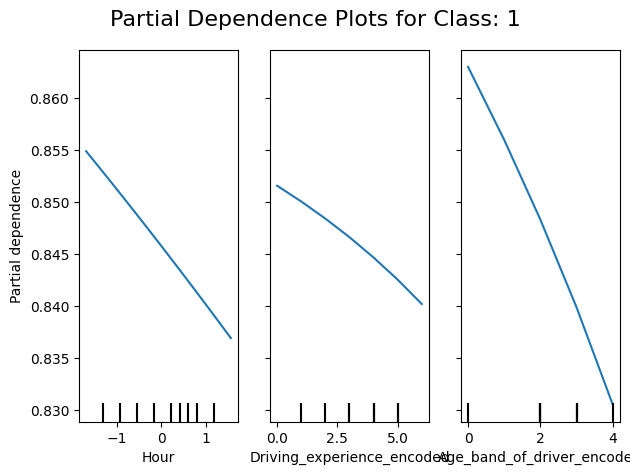

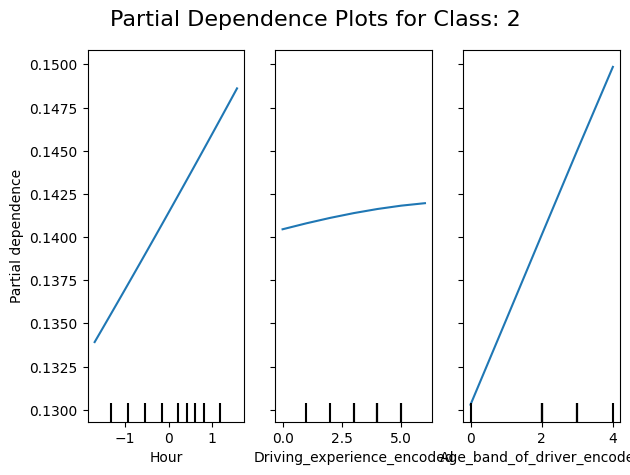

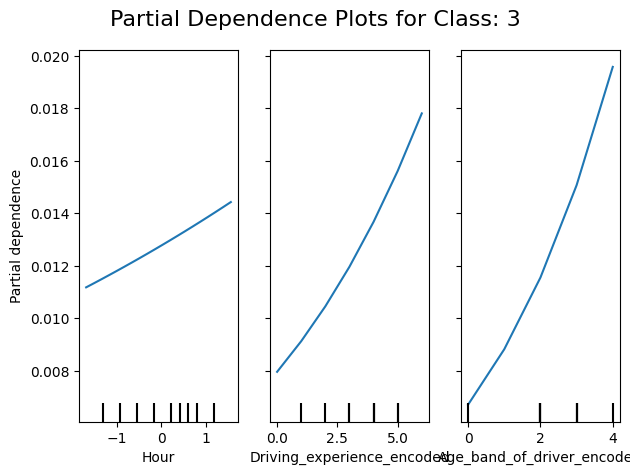

In [ ]:
# ... [Previous code sections]

# --------------------------------------------
# 12. Apply Explainable AI (XAI) Techniques (Optional)
# --------------------------------------------

# Since you encountered issues with SHAP earlier, we'll address them here
# Only proceed if there are no encoding issues

if not columns_with_unknown and not non_numeric_columns and not X.isnull().sum().any():
    try:
        # 12.1. SHAP (SHapley Additive exPlanations)
        print("\nApplying SHAP for Logistic Regression...")
        explainer_shap = shap.LinearExplainer(
            lr_classifier,
            X_train,
            feature_perturbation="independent"  # Updated parameter name
        )
        shap_values = explainer_shap.shap_values(X_test)

        # SHAP Summary Plot
        plt.figure(figsize=(12,8))
        shap.summary_plot(shap_values, X_test, plot_type="bar")
    except Exception as e:
        print(f"\nSHAP encountered an error: {e}")

    try:
        # 12.2. LIME (Local Interpretable Model-agnostic Explanations)
        print("\nApplying LIME for Logistic Regression...")
        explainer_lime = lime_tabular.LimeTabularExplainer(
            training_data=np.array(X_train),
            feature_names=X.columns,
            class_names=lr_classifier.classes_,
            mode='classification'
        )

        # Explain a few samples
        num_samples = 3
        samples = X_test.sample(n=num_samples, random_state=42)

        for i in range(num_samples):
            sample = samples.iloc[i].values.reshape(1, -1)
            explanation = explainer_lime.explain_instance(
                data_row=samples.iloc[i],
                predict_fn=lr_classifier.predict_proba
            )
            print(f"\nLIME Explanation for Sample {i+1}:")
            explanation.show_in_notebook(show_table=True, show_all=False)
            # For scripts, you can save the explanation as an HTML file:
            # explanation.save_to_file(f'lime_explanation_sample_{i+1}.html')
    except Exception as e:
        print(f"\nLIME encountered an error: {e}")

    try:
        # 12.3. Partial Dependence Plots (PDP)
        print("\nGenerating Partial Dependence Plots...")
        features_pdp = ['Hour', 'Driving_experience_encoded', 'Age_band_of_driver_encoded']

        plt.figure(figsize=(20,5))
        for cls in lr_classifier.classes_:
            PartialDependenceDisplay.from_estimator(
                lr_classifier,
                X_train,
                features_pdp,
                kind='average',
                grid_resolution=20,
                target=cls  # Specify the target class
            )
            plt.suptitle(f'Partial Dependence Plots for Class: {cls}', fontsize=16)
            plt.tight_layout()
            plt.show()
    except Exception as e:
        print(f"\nPartial Dependence Plots encountered an error: {e}")
else:
    print("\nSkipping XAI techniques due to encoding issues. Please resolve the errors above before applying XAI.")



Visualizing Feature Importances for Logistic Regression...


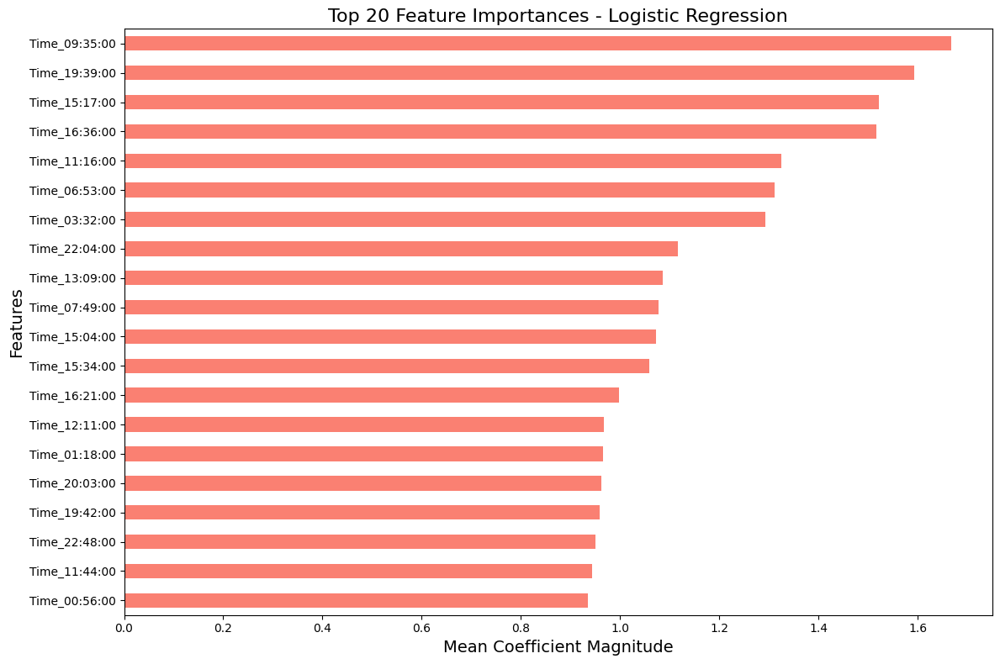


Visualizing Feature Importances for Decision Tree...


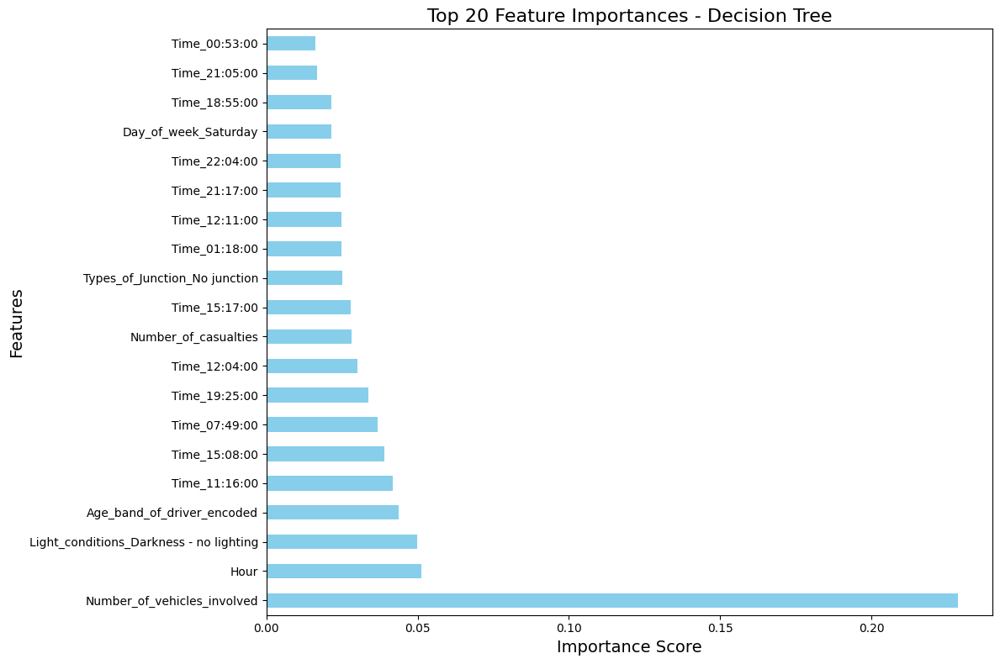


Comparing Feature Importances Between Models...


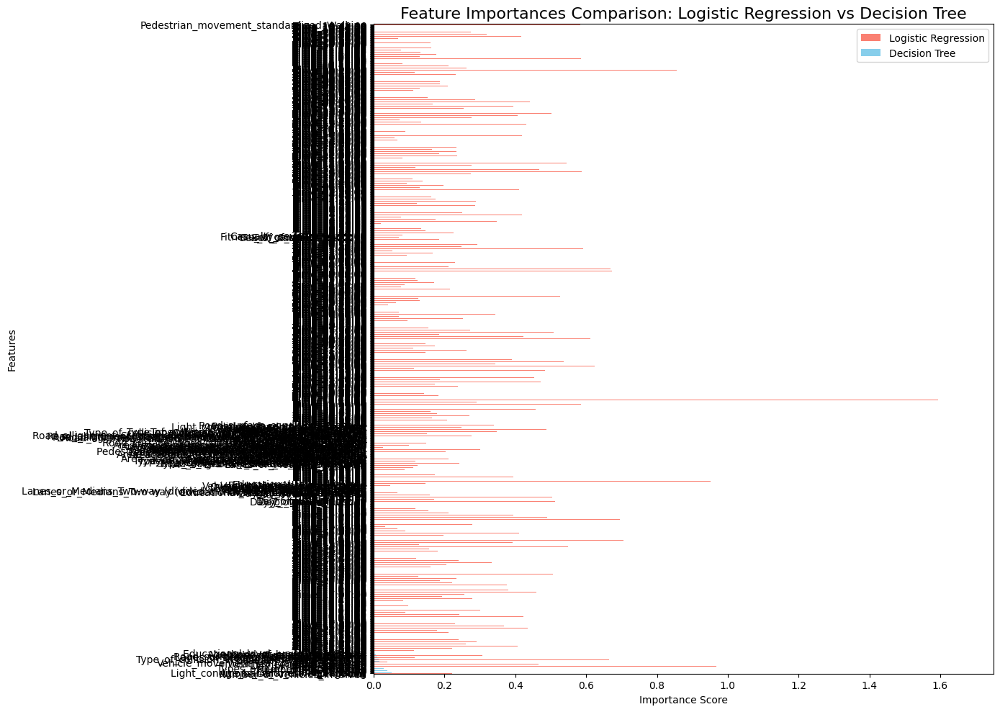

In [ ]:
# --------------------------------------------
# 13. Visualize Feature Importances (Optional)
# --------------------------------------------

# Proceed only if there are no encoding issues
if not columns_with_unknown and not non_numeric_columns and not X.isnull().sum().any():
    # 13.1. Feature Importance for Logistic Regression
    print("\nVisualizing Feature Importances for Logistic Regression...")
    # Compute the mean of absolute coefficients across all classes
    lr_feature_importances = np.mean(np.abs(lr_classifier.coef_), axis=0)

    # Create a Series with feature names and their importances
    lr_feature_importances_series = pd.Series(lr_feature_importances, index=X.columns)

    # Sort the features by importance
    lr_feature_importances_sorted = lr_feature_importances_series.sort_values(ascending=True)

    # Plot the top 20 feature importances
    plt.figure(figsize=(12,8))
    lr_feature_importances_sorted.tail(20).plot(kind='barh', color='salmon')
    plt.title('Top 20 Feature Importances - Logistic Regression', fontsize=16)
    plt.xlabel('Mean Coefficient Magnitude', fontsize=14)
    plt.ylabel('Features', fontsize=14)
    plt.tight_layout()
    plt.show()

    # 13.2. Feature Importance for Decision Tree
    print("\nVisualizing Feature Importances for Decision Tree...")
    dt_feature_importances = pd.Series(dt_classifier.feature_importances_, index=X.columns).sort_values(ascending=False)

    plt.figure(figsize=(12,8))
    dt_feature_importances.head(20).plot(kind='barh', color='skyblue')
    plt.title('Top 20 Feature Importances - Decision Tree', fontsize=16)
    plt.xlabel('Importance Score', fontsize=14)
    plt.ylabel('Features', fontsize=14)
    plt.tight_layout()
    plt.show()

    # 13.3. Comparing Feature Importances Across Models
    print("\nComparing Feature Importances Between Models...")
    comparison_df = pd.DataFrame({
        'Logistic Regression': lr_feature_importances_series,
        'Decision Tree': dt_feature_importances
    })

    # To avoid mismatch, ensure the indices align
    comparison_df = comparison_df.loc[dt_feature_importances.index.intersection(lr_feature_importances_series.index)]

    # Compute mean feature importance if needed
    # comparison_df['Mean Importance'] = comparison_df.mean(axis=1)

    # Plot comparison
    comparison_df.plot(kind='barh', figsize=(14,10), color=['salmon', 'skyblue'])
    plt.title('Feature Importances Comparison: Logistic Regression vs Decision Tree', fontsize=16)
    plt.xlabel('Importance Score')
    plt.ylabel('Features')
    plt.tight_layout()
    plt.show()
else:
    print("\nSkipping Feature Importance visualization due to encoding issues. Please resolve the errors above before visualizing feature importances.")



Performing Principal Component Analysis (PCA)...
PCA Training Time: 17.5561 seconds
Number of principal components to retain 95% variance: 78

Decision Tree (PCA) Training Time: 2.9996 seconds
Logistic Regression (PCA) Training Time: 1.7612 seconds

Classification Report for Decision Tree (PCA) (PCA):
              precision    recall  f1-score   support

           1       0.86      0.97      0.91      2084
           2       0.40      0.11      0.17       349
           3       0.25      0.03      0.06        31

    accuracy                           0.84      2464
   macro avg       0.50      0.37      0.38      2464
weighted avg       0.78      0.84      0.79      2464



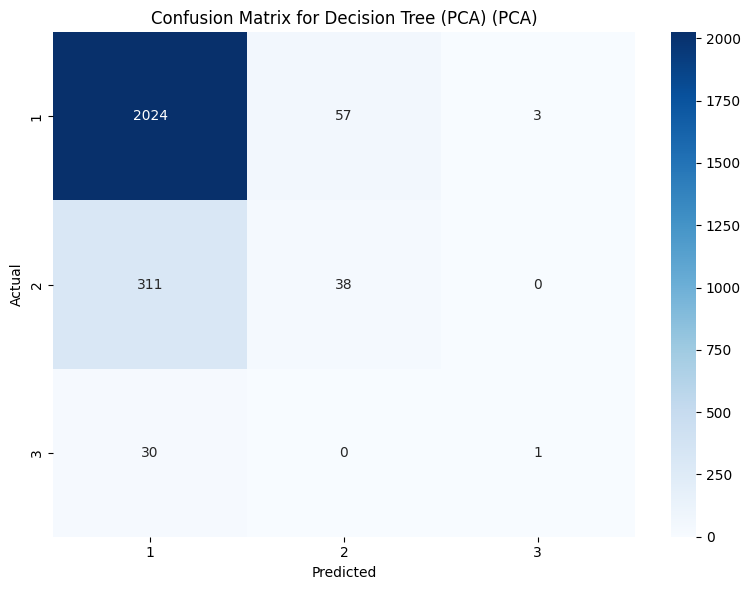

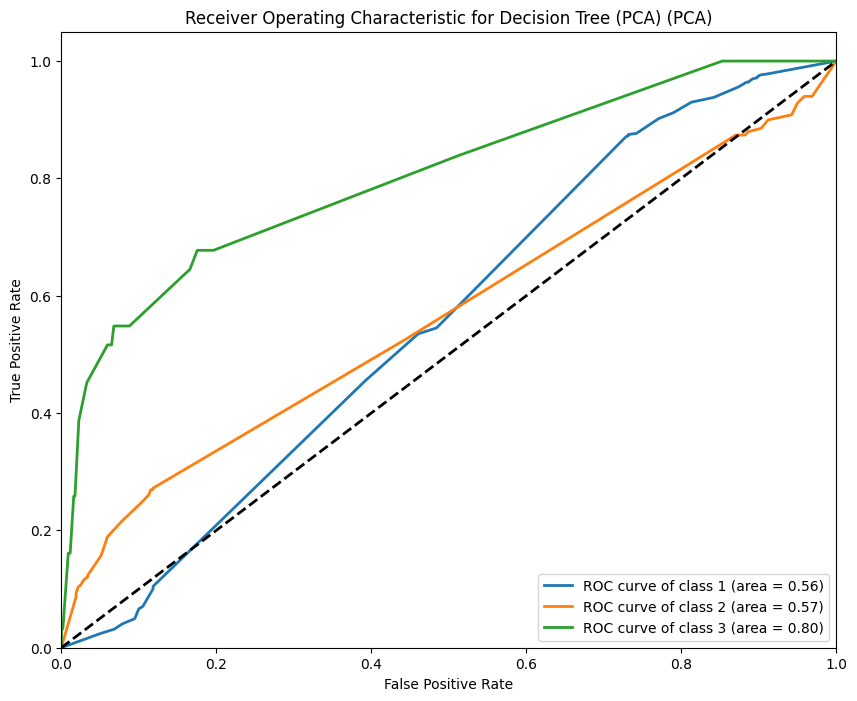


Classification Report for Logistic Regression (PCA) (PCA):
              precision    recall  f1-score   support

           1       0.85      1.00      0.92      2084
           2       1.00      0.00      0.01       349
           3       0.00      0.00      0.00        31

    accuracy                           0.85      2464
   macro avg       0.62      0.33      0.31      2464
weighted avg       0.86      0.85      0.78      2464



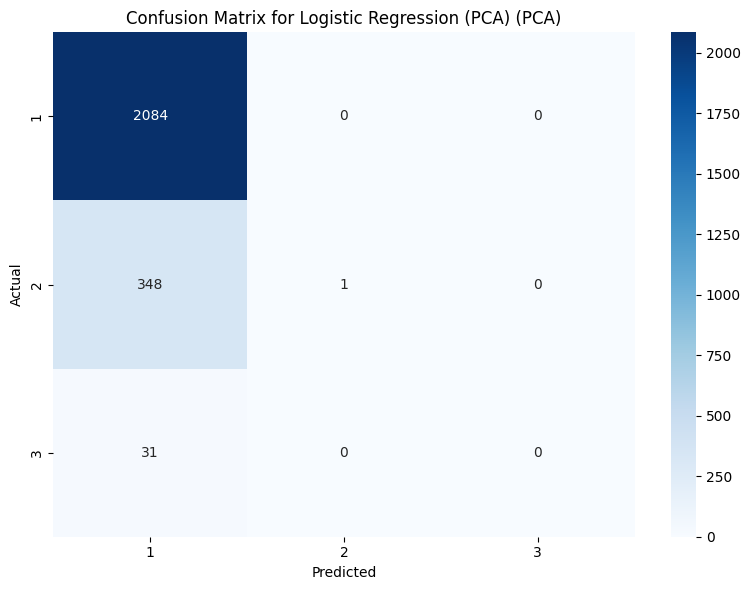

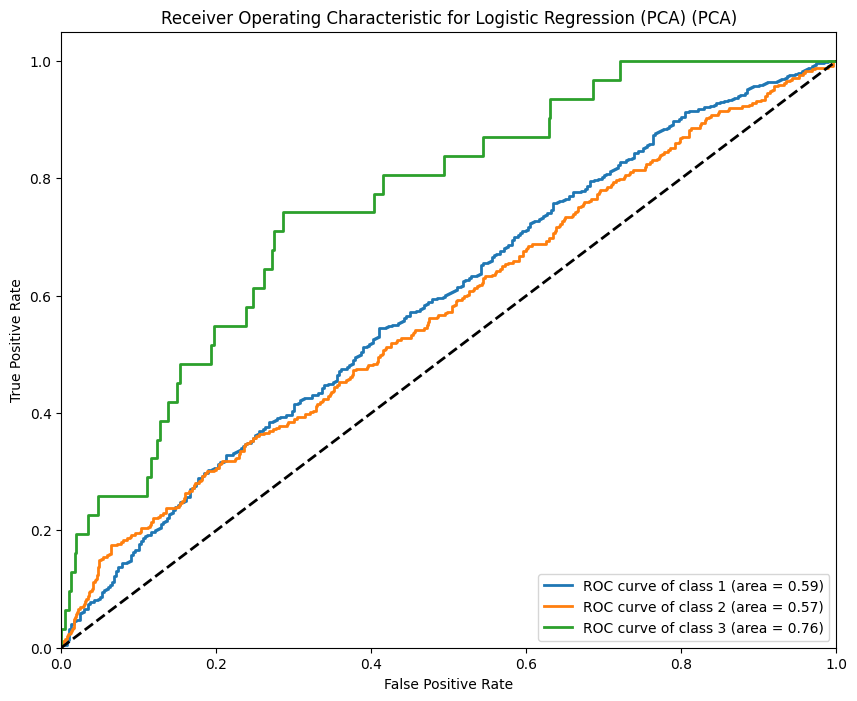


PCA Model Performance Comparison:
        Metric  Decision Tree (PCA)  Logistic Regression (PCA)
0     Accuracy             0.837256                   0.846185
1    Precision             0.783631                   0.857273
2       Recall             0.837256                   0.846185
3     F1-Score             0.794510                   0.776091
4  Cohen Kappa             0.109336                   0.004476
5      ROC AUC             0.561880                   0.589666


In [ ]:
from sklearn.decomposition import PCA

# --------------------------------------------
# 14. Perform Principal Component Analysis (PCA)
# --------------------------------------------

print("\nPerforming Principal Component Analysis (PCA)...")

# Decide the number of components or the amount of variance you want to retain
# For example, retain 95% of the variance
pca = PCA(n_components=0.95, random_state=42)

# Fit PCA on the training data
start_time = time.time()
X_train_pca = pca.fit_transform(X_train)
end_time = time.time()
pca_training_time = end_time - start_time
print(f"PCA Training Time: {pca_training_time:.4f} seconds")

# Transform the testing data
X_test_pca = pca.transform(X_test)

# Display the number of components
print(f"Number of principal components to retain 95% variance: {pca.n_components_}")

# --------------------------------------------
# 15. Train Models on PCA-Transformed Data
# --------------------------------------------

# Initialize the Decision Tree Classifier
dt_classifier_pca = DecisionTreeClassifier(
    random_state=42,
    max_depth=10,
    min_samples_split=5,
    min_samples_leaf=2
)

# Train the Decision Tree model on PCA data
start_time = time.time()
dt_classifier_pca.fit(X_train_pca, y_train)
end_time = time.time()
dt_pca_training_time = end_time - start_time
print(f"\nDecision Tree (PCA) Training Time: {dt_pca_training_time:.4f} seconds")

# Initialize the Logistic Regression Classifier
lr_classifier_pca = LogisticRegression(
    multi_class='multinomial',
    solver='lbfgs',
    max_iter=1000,
    random_state=42
)

# Train the Logistic Regression model on PCA data
start_time = time.time()
lr_classifier_pca.fit(X_train_pca, y_train)
end_time = time.time()
lr_pca_training_time = end_time - start_time
print(f"Logistic Regression (PCA) Training Time: {lr_pca_training_time:.4f} seconds")

# --------------------------------------------
# 16. Evaluate Models Trained on PCA Data
# --------------------------------------------

# Define Evaluation Function (reuse or redefine if necessary)
def evaluate_model_pca(model, X_test_pca, y_test, model_name):
    """
    Evaluates the given PCA-trained model on the test data and prints performance metrics.

    Parameters:
    - model: Trained machine learning model.
    - X_test_pca: PCA-transformed features for testing.
    - y_test: True labels for testing.
    - model_name: Name of the model (string).

    Returns:
    - metrics_dict: Dictionary containing the calculated metrics.
    """
    metrics_dict = {}

    # Predictions
    y_pred = model.predict(X_test_pca)
    y_pred_proba = model.predict_proba(X_test_pca) if hasattr(model, "predict_proba") else None

    # Calculate metrics
    metrics_dict['Accuracy'] = accuracy_score(y_test, y_pred)
    metrics_dict['Precision'] = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    metrics_dict['Recall'] = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    metrics_dict['F1-Score'] = f1_score(y_test, y_pred, average='weighted', zero_division=0)
    metrics_dict['Cohen Kappa'] = cohen_kappa_score(y_test, y_pred)

    # ROC AUC
    if y_pred_proba is not None:
        if len(model.classes_) == 2:
            metrics_dict['ROC AUC'] = roc_auc_score(y_test, y_pred_proba[:,1])
        else:
            metrics_dict['ROC AUC'] = roc_auc_score(
                y_test, y_pred_proba, multi_class='ovr', average='weighted'
            )
    else:
        metrics_dict['ROC AUC'] = 'N/A'

    # Print Classification Report
    print(f"\nClassification Report for {model_name} (PCA):")
    print(classification_report(y_test, y_pred, zero_division=0))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8,6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=model.classes_, yticklabels=model.classes_)
    plt.title(f'Confusion Matrix for {model_name} (PCA)')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.tight_layout()
    plt.show()

    # ROC Curve
    if metrics_dict['ROC AUC'] != 'N/A':
        if len(model.classes_) == 2:
            fpr, tpr, _ = roc_curve(y_test, y_pred_proba[:,1], pos_label=model.classes_[1])
            roc_auc = auc(fpr, tpr)
            plt.figure(figsize=(8,6))
            plt.plot(fpr, tpr, color='darkorange',
                     lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
            plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'Receiver Operating Characteristic for {model_name} (PCA)')
            plt.legend(loc="lower right")
            plt.show()
        else:
            from sklearn.preprocessing import label_binarize
            from sklearn.metrics import roc_curve, auc
            n_classes = len(model.classes_)
            y_test_binarized = label_binarize(y_test, classes=model.classes_)
            fpr = dict()
            tpr = dict()
            roc_auc = dict()
            for i in range(n_classes):
                fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
                roc_auc[i] = auc(fpr[i], tpr[i])

            # Plot all ROC curves
            plt.figure(figsize=(10,8))
            for i in range(n_classes):
                plt.plot(fpr[i], tpr[i], lw=2,
                         label=f'ROC curve of class {model.classes_[i]} (area = {roc_auc[i]:0.2f})')
            plt.plot([0, 1], [0, 1], 'k--', lw=2)
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'Receiver Operating Characteristic for {model_name} (PCA)')
            plt.legend(loc="lower right")
            plt.show()

    return metrics_dict

# Evaluate Decision Tree with PCA
dt_pca_metrics = evaluate_model_pca(dt_classifier_pca, X_test_pca, y_test, "Decision Tree (PCA)")

# Evaluate Logistic Regression with PCA
lr_pca_metrics = evaluate_model_pca(lr_classifier_pca, X_test_pca, y_test, "Logistic Regression (PCA)")

# Summarize PCA Model Performance
performance_pca_df = pd.DataFrame({
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Cohen Kappa', 'ROC AUC'],
    'Decision Tree (PCA)': [
        dt_pca_metrics.get('Accuracy'),
        dt_pca_metrics.get('Precision'),
        dt_pca_metrics.get('Recall'),
        dt_pca_metrics.get('F1-Score'),
        dt_pca_metrics.get('Cohen Kappa'),
        dt_pca_metrics.get('ROC AUC')
    ],
    'Logistic Regression (PCA)': [
        lr_pca_metrics.get('Accuracy'),
        lr_pca_metrics.get('Precision'),
        lr_pca_metrics.get('Recall'),
        lr_pca_metrics.get('F1-Score'),
        lr_pca_metrics.get('Cohen Kappa'),
        lr_pca_metrics.get('ROC AUC')
    ]
})

print("\nPCA Model Performance Comparison:")
print(performance_pca_df)


Now removing the time feature and rather using time of day only  

TO PREDICT THE SEVERITY OF AN ACCIDENT

In [ ]:
df.head()

,Time,Day_of_week,Vehicle_driver_relation,Owner_of_vehicle,Defect_of_vehicle,Lanes_or_Medians,Road_allignment,Types_of_Junction,Road_surface_type,Road_surface_conditions,...,Age_band_of_driver_encoded,Age_band_of_casualty_encoded,Driving_experience_encoded,Casualty_severity_encoded,Accident_severity_encoded,Fitness_of_casuality_encoded,Work_of_casuality_encoded,Educational_level_encoded,Sex_of_driver_encoded,Sex_of_casualty_encoded
0,17:02:00,Monday,Employee,Owner,No defect,Unknown,Tangent road with flat terrain,No junction,Asphalt roads,Dry,...,2,0,2,0,1,0,0,5,1,2
1,17:02:00,Monday,Employee,Owner,No defect,Undivided Two way,Tangent road with flat terrain,No junction,Asphalt roads,Dry,...,3,0,5,0,1,0,0,3,1,2
2,17:02:00,Monday,Employee,Owner,No defect,other,Unknown,No junction,Asphalt roads,Dry,...,2,3,2,3,2,0,1,3,1,1
3,01:06:00,Sunday,Employee,Governmental,No defect,other,Tangent road with mild grade and flat terrain,Y Shape,Earth roads,Dry,...,2,2,4,3,1,1,1,3,1,0
4,01:06:00,Sunday,Employee,Owner,No defect,other,Tangent road with flat terrain,Y Shape,Asphalt roads,Dry,...,2,0,3,0,1,0,0,3,1,2


In [ ]:
# --------------------------------------------
# 1. Import Necessary Libraries
# --------------------------------------------
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time

# Machine Learning Models and Evaluation Metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, confusion_matrix, classification_report,
    cohen_kappa_score, roc_curve, auc
)

# Explainable AI Libraries (Optional)
import shap
from lime import lime_tabular
from sklearn.inspection import PartialDependenceDisplay

# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')

# --------------------------------------------
# 2. Load Your Dataset
# --------------------------------------------

# Replace with your actual dataset file path
df = pd.read_excel('/content/cleaned_accident_data(OtherColumns removed).xlsx')

# Display the first few rows
print("First 5 rows of the dataset:")
print(df.head())

# --------------------------------------------
# 3. Handle Missing Values
# --------------------------------------------

# Display missing values in each column
print("\nMissing values in each column:")
print(df.isnull().sum())

# --------------------------------------------
# 3.1. Drop the 'Time' Column Completely
# --------------------------------------------

# Drop the 'Time' column as per your instruction
if 'Time' in df.columns:
    df.drop(columns=['Time'], inplace=True)
    print("\n'Dropped the 'Time' column successfully.")
else:
    print("\n'Time' column not found in the dataset. Proceeding without dropping.")

# --------------------------------------------
# 3.2. Define Categorical and Numerical Columns
# --------------------------------------------

# Define categorical and numerical columns based on your dataset
# EXCLUDING 'Time' as it has been dropped
categorical_columns = [
    'Day_of_week', 'Age_band_of_driver', 'Sex_of_driver',
    'Educational_level', 'Vehicle_driver_relation', 'Driving_experience',
    'Owner_of_vehicle', 'Defect_of_vehicle', 'Lanes_or_Medians',
    'Road_allignment', 'Types_of_Junction', 'Road_surface_type',
    'Road_surface_conditions', 'Light_conditions', 'Weather_conditions',
    'Type_of_collision', 'Casualty_class', 'Sex_of_casualty',
    'Age_band_of_casualty', 'Casualty_severity', 'Work_of_casuality',
    'Fitness_of_casuality', 'Accident_severity', 'Part_of_day',
    'Type_of_vehicle_standardized', 'Area_accident_occured_standardized',
    'Vehicle_movement_standardized', 'Pedestrian_movement_standardized',
    'Cause_of_accident_standardized'
]

numerical_columns = [
    'Hour', 'Number_of_vehicles_involved', 'Number_of_casualties'
]

# --------------------------------------------
# 3.3. Fill Missing Values
# --------------------------------------------

# Fill missing values in categorical columns with 'Unknown'
df[categorical_columns] = df[categorical_columns].fillna('Unknown')

# Fill missing values in numerical columns with the median
for col in numerical_columns:
    if col in df.columns:
        if df[col].isnull().sum() > 0:
            median_value = df[col].median()
            df[col].fillna(median_value, inplace=True)
            print(f"Filled missing values in '{col}' with median value {median_value}.")
        else:
            print(f"No missing values in '{col}'.")

# --------------------------------------------
# 4. Encode Categorical Variables
# --------------------------------------------

# Define Binary Features
binary_features = ['Sex_of_driver', 'Sex_of_casualty']

# Define Ordinal Features and Their Mappings
ordinal_features = {
    'Age_band_of_driver': {
        'Under 18': 1,
        '18-30': 2,
        '31-50': 3,
        'Over 51': 4,
        'Unknown': 0  # Mapping 'Unknown' to 0
    },
    'Age_band_of_casualty': {
        'Under 18': 1,
        '18-30': 2,
        '31-50': 3,
        'Over 51': 4,
        '5': 0,          # Assuming '5' is an error or unspecified
        'Unknown': 0
    },
    'Driving_experience': {
        'No Licence': 0,
        'Below 1yr': 1,
        '1-2yr': 2,
        '2-5yr': 3,
        '5-10yr': 4,
        'Above 10yr': 5,
        'Unknown': 6,
        'unknown': 6     # Handling case-insensitive 'unknown'
    },
    'Casualty_severity': {  # Assuming an order
        '1': 1,
        '2': 2,
        '3': 3,
        'na': 0,             # Treat 'na' as 0 or 'Unknown'
        'Unknown': 0
    },
    'Accident_severity': {  # Assuming an order
        'Slight Injury': 1,
        'Serious Injury': 2,
        'Fatal injury': 3,
        'Unknown': 0
    },
    'Fitness_of_casuality': {  # Example mapping
        'Normal': 1,
        'Driver': 2,
        'Deaf': 3,
        'Other': 4,
        'Blind': 5,
        'Unknown': 0
    },
    'Work_of_casuality': {  # Example mapping
        'Unknown': 0,
        'Driver': 1,
        'Other': 2,
        'Unemployed': 3,
        'Employee': 4,
        'Self-employed': 5,
        'Student': 6
    },
    'Educational_level': {  # Added mapping for 'Educational_level'
        'No formal education': 1,
        'Primary': 2,
        'Junior High School': 3,
        'High School': 4,
        'Above High School': 5,
        'Unknown': 0  # Handling missing or undefined values
    }
}

# --------------------------------------------
# 4.1. Apply Ordinal Encoding and Drop Original Columns
# --------------------------------------------

for feature, mapping in ordinal_features.items():
    encoded_feature = feature + '_encoded'
    df[encoded_feature] = df[feature].map(mapping).fillna(0).astype(int)
    # Drop the original categorical column to prevent duplication
    df.drop(columns=[feature], inplace=True)
    print(f"Encoded and dropped '{feature}'.")

# --------------------------------------------
# 4.2. Verify Ordinal Encoding
# --------------------------------------------

print("\nEncoded Ordinal Features:")
ordinal_encoded_cols = [f"{feat}_encoded" for feat in ordinal_features.keys()]
print(df[ordinal_encoded_cols].head())

# --------------------------------------------
# 4.3. Apply Label Encoding to Binary Features and Drop Original Columns
# --------------------------------------------

le = LabelEncoder()
for feature in binary_features:
    encoded_feature = feature + '_encoded'
    df[encoded_feature] = le.fit_transform(df[feature].astype(str))
    print(f"Encoded '{feature}' with classes: {le.classes_}")
    # Drop the original binary feature
    df.drop(columns=[feature], inplace=True)

# --------------------------------------------
# 4.4. Verify Label Encoding
# --------------------------------------------

print("\nEncoded Binary Features:")
binary_encoded_cols = [f"{feat}_encoded" for feat in binary_features]
print(df[binary_encoded_cols].head())

# --------------------------------------------
# 4.5. Define Nominal Features (excluding 'Time' and already encoded features)
# --------------------------------------------

nominal_features = [
    'Day_of_week', 'Vehicle_driver_relation',
    'Owner_of_vehicle', 'Defect_of_vehicle', 'Lanes_or_Medians',
    'Road_allignment', 'Types_of_Junction', 'Road_surface_type',
    'Road_surface_conditions', 'Light_conditions', 'Weather_conditions',
    'Type_of_collision', 'Casualty_class', 'Part_of_day',
    'Type_of_vehicle_standardized', 'Area_accident_occured_standardized',
    'Vehicle_movement_standardized', 'Pedestrian_movement_standardized'
    # Note: 'Cause_of_accident_standardized' is the target and is excluded
]

# --------------------------------------------
# 4.6. Apply One-Hot Encoding to Nominal Features
# --------------------------------------------

df_encoded = pd.get_dummies(df, columns=nominal_features, drop_first=True)

print("\nEncoded Nominal Features:")
# Display some of the new one-hot encoded columns
print(df_encoded.filter(like='Day_of_week').head())
print(df_encoded.filter(like='Type_of_collision').head())

# --------------------------------------------
# 5. Define Feature Matrix (X) and Target Vector (y)
# --------------------------------------------

# Define the target variable
target = 'Accident_severity_encoded'  # Ensure this is the correct encoded target

# Define the feature matrix by dropping the target and original categorical columns
original_categorical_cols = [
    'Cause_of_accident_standardized'  # Important: Drop this to remove 'Changing Lanes'
    # Note: Other categorical columns have already been encoded and dropped
]

X = df_encoded.drop(columns=[target] + original_categorical_cols)

# Define the target vector
y = df_encoded[target]

print(f"\nFeature matrix shape: {X.shape}")
print(f"Target vector shape: {y.shape}")

# --------------------------------------------
# 6. Verify the Encoded Feature Matrix
# --------------------------------------------

# Check data types of all features in X
print("\nData Types in Feature Matrix (X):")
print(X.dtypes.value_counts())

# Check for any non-numeric columns
non_numeric_columns = X.select_dtypes(include=['object']).columns.tolist()
print("\nNon-numeric columns in Feature Matrix:", non_numeric_columns)

if non_numeric_columns:
    print("\nError: The following columns are non-numeric and need to be encoded:")
    print(non_numeric_columns)
else:
    print("\nAll features are numeric.")

# Check for any 'Unknown' string values in X
# Since all non-numeric columns have been handled, this should be zero
contains_unknown = X.apply(lambda col: col.astype(str).str.contains('Unknown').any())
columns_with_unknown = contains_unknown[contains_unknown].index.tolist()
print("\nColumns containing 'Unknown':", columns_with_unknown)

if columns_with_unknown:
    print("\nError: The following columns contain 'Unknown' and need to be encoded:")
    print(columns_with_unknown)
else:
    print("\nNo 'Unknown' values found in the feature matrix.")

# Additional verification: Check for NaN values
print("\nChecking for NaN values in Feature Matrix:")
print(X.isnull().sum())

if X.isnull().sum().any():
    print("\nError: There are still missing values in the feature matrix. Please handle them before modeling.")
else:
    print("\nNo missing values found in the feature matrix.")

# --------------------------------------------
# 7. Feature Scaling
# --------------------------------------------

# Define features to scale (numerical features)
features_to_scale = ['Hour', 'Number_of_vehicles_involved', 'Number_of_casualties']

# Verify that these features exist in the feature matrix
existing_features_to_scale = [feature for feature in features_to_scale if feature in X.columns]
print(f"\nFeatures to scale: {existing_features_to_scale}")

# Initialize the scaler
scaler = StandardScaler()

# Apply scaling
X[existing_features_to_scale] = scaler.fit_transform(X[existing_features_to_scale])

# Verify scaling
print("\nScaled Numerical Features:")
print(X[existing_features_to_scale].head())

# --------------------------------------------
# 8. Split the Dataset into Training and Testing Sets
# --------------------------------------------

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y  # Ensures proportional representation of classes
)

print(f"\nTraining set size: {X_train.shape}")
print(f"Testing set size: {X_test.shape}")

# --------------------------------------------
# 9. Train and Evaluate Machine Learning Models
# --------------------------------------------

# Initialize the Decision Tree Classifier
dt_classifier = DecisionTreeClassifier(
    random_state=42,
    max_depth=10,  # Adjust depth to prevent overfitting
    min_samples_split=5,
    min_samples_leaf=2
)

# Train the Decision Tree model
start_time = time.time()
dt_classifier.fit(X_train, y_train)
end_time = time.time()
dt_training_time = end_time - start_time
print(f"\nDecision Tree Training Time: {dt_training_time:.4f} seconds")

# Initialize the Logistic Regression Classifier
lr_classifier = LogisticRegression(
    multi_class='multinomial',
    solver='lbfgs',
    max_iter=1000,
    random_state=42
)

# Train the Logistic Regression model
start_time = time.time()
lr_classifier.fit(X_train, y_train)
end_time = time.time()
lr_training_time = end_time - start_time
print(f"Logistic Regression Training Time: {lr_training_time:.4f} seconds")

# --------------------------------------------
# 10. Define an Evaluation Function
# --------------------------------------------

def evaluate_model(model, X_test, y_test, model_name):
    """
    Evaluates the given model on the test data and prints performance metrics.

    Parameters:
    - model: Trained machine learning model.
    - X_test: Features for testing.
    - y_test: True labels for testing.
    - model_name: Name of the model (string).

    Returns:
    - metrics_dict: Dictionary containing the calculated metrics.
    """
    metrics_dict = {}

    # Predictions
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test) if hasattr(model, "predict_proba") else None

    # Calculate metrics
    metrics_dict['Accuracy'] = accuracy_score(y_test, y_pred)
    metrics_dict['Precision'] = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    metrics_dict['Recall'] = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    metrics_dict['F1-Score'] = f1_score(y_test, y_pred, average='weighted', zero_division=0)
    metrics_dict['Cohen Kappa'] = cohen_kappa_score(y_test, y_pred)

    # ROC AUC
    if y_pred_proba is not None:
        if len(model.classes_) == 2:
            metrics_dict['ROC AUC'] = roc_auc_score(y_test, y_pred_proba[:,1])
        else:
            metrics_dict['ROC AUC'] = roc_auc_score(
                y_test, y_pred_proba, multi_class='ovr', average='weighted'
            )
    else:
        metrics_dict['ROC AUC'] = 'N/A'

    # Print Classification Report
    print(f"\nClassification Report for {model_name}:")
    print(classification_report(y_test, y_pred, zero_division=0))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8,6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=model.classes_, yticklabels=model.classes_)
    plt.title(f'Confusion Matrix for {model_name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.tight_layout()
    plt.show()

    # ROC Curve
    if metrics_dict['ROC AUC'] != 'N/A':
        if len(model.classes_) == 2:
            fpr, tpr, _ = roc_curve(y_test, y_pred_proba[:,1], pos_label=model.classes_[1])
            roc_auc = auc(fpr, tpr)
            plt.figure(figsize=(8,6))
            plt.plot(fpr, tpr, color='darkorange',
                     lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
            plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'Receiver Operating Characteristic for {model_name}')
            plt.legend(loc="lower right")
            plt.show()
        else:
            from sklearn.preprocessing import label_binarize
            from sklearn.metrics import roc_curve, auc
            n_classes = len(model.classes_)
            y_test_binarized = label_binarize(y_test, classes=model.classes_)
            fpr = dict()
            tpr = dict()
            roc_auc = dict()
            for i in range(n_classes):
                fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
                roc_auc[i] = auc(fpr[i], tpr[i])

            # Plot all ROC curves
            plt.figure(figsize=(10,8))
            for i in range(n_classes):
                plt.plot(fpr[i], tpr[i], lw=2,
                         label=f'ROC curve of class {model.classes_[i]} (area = {roc_auc[i]:0.2f})')
            plt.plot([0, 1], [0, 1], 'k--', lw=2)
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'Receiver Operating Characteristic for {model_name}')
            plt.legend(loc="lower right")
            plt.show()

    return metrics_dict


First 5 rows of the dataset:
       Time Day_of_week Age_band_of_driver Sex_of_driver   Educational_level  \
0  17:02:00      Monday              18-30          Male   Above High School   
1  17:02:00      Monday              31-50          Male  Junior High School   
2  17:02:00      Monday              18-30          Male  Junior High School   
3  01:06:00      Sunday              18-30          Male  Junior High School   
4  01:06:00      Sunday              18-30          Male  Junior High School   

  Vehicle_driver_relation Driving_experience Owner_of_vehicle  \
0                Employee              1-2yr            Owner   
1                Employee         Above 10yr            Owner   
2                Employee              1-2yr            Owner   
3                Employee             5-10yr     Governmental   
4                Employee              2-5yr            Owner   

  Defect_of_vehicle   Lanes_or_Medians  ... Work_of_casuality  \
0         No defect            Unk


Classification Report for Decision Tree:
              precision    recall  f1-score   support

           1       0.86      0.98      0.91      2084
           2       0.46      0.12      0.19       349
           3       0.70      0.23      0.34        31

    accuracy                           0.84      2464
   macro avg       0.67      0.44      0.48      2464
weighted avg       0.80      0.84      0.80      2464



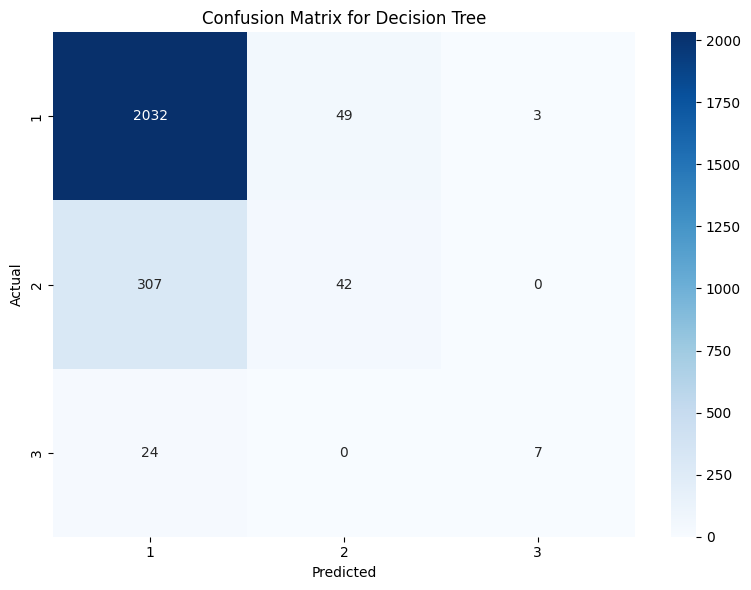

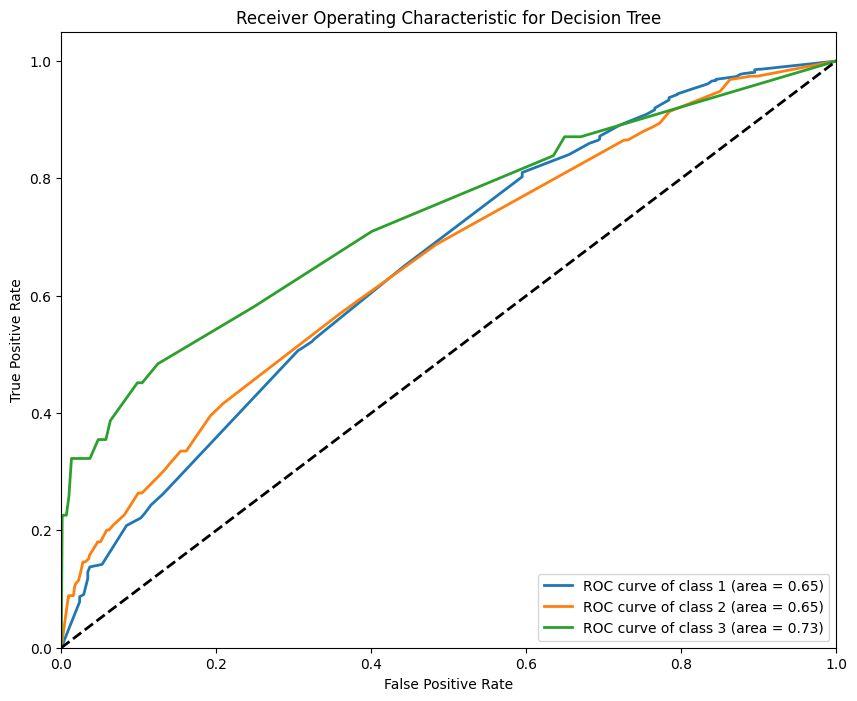


Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           1       0.85      1.00      0.92      2084
           2       1.00      0.00      0.01       349
           3       0.00      0.00      0.00        31

    accuracy                           0.85      2464
   macro avg       0.62      0.33      0.31      2464
weighted avg       0.86      0.85      0.78      2464



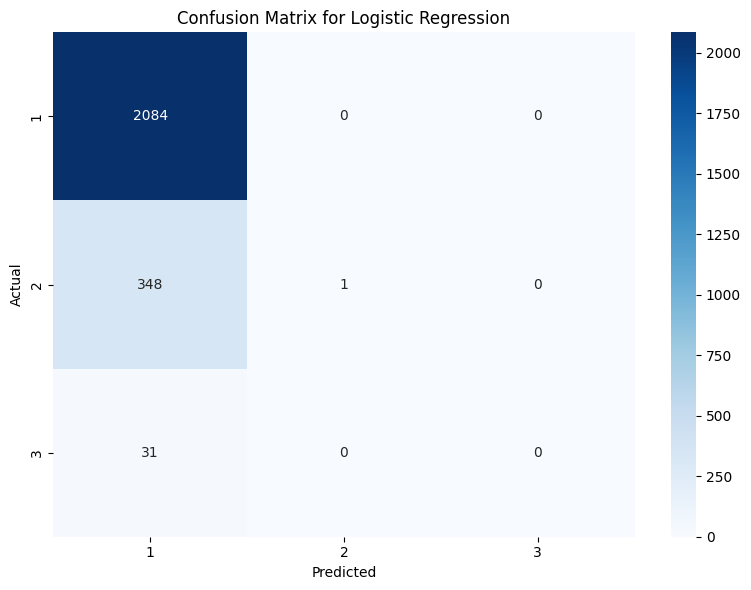

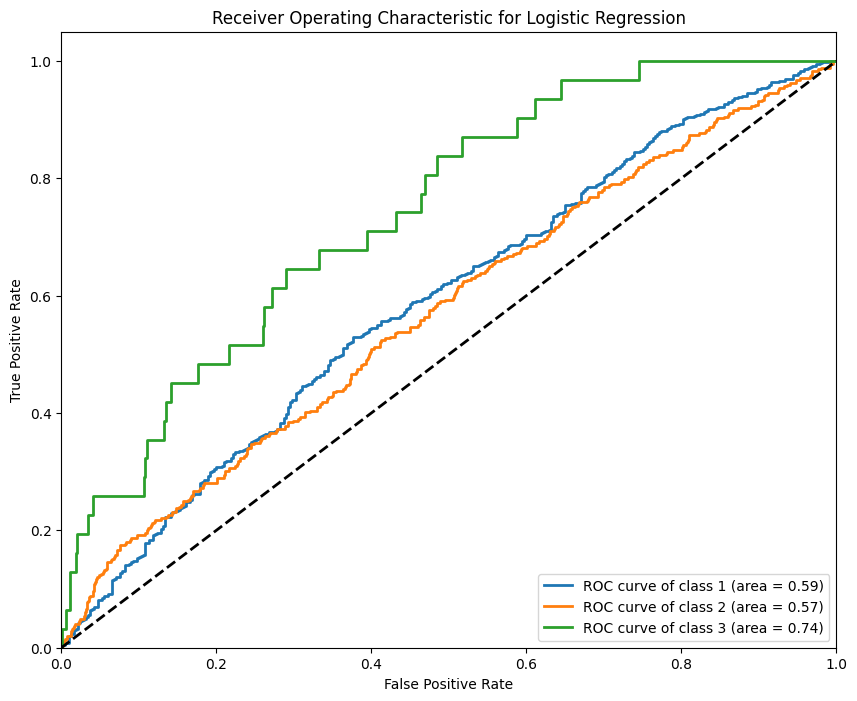


Model Performance Comparison:
        Metric  Decision Tree  Logistic Regression
0     Accuracy       0.844562             0.846185
1    Precision       0.801485             0.857273
2       Recall       0.844562             0.846185
3     F1-Score       0.804272             0.776091
4  Cohen Kappa       0.153420             0.004476
5      ROC AUC       0.653953             0.588720


In [ ]:
# --------------------------------------------
# 11. Evaluate the Models
# --------------------------------------------

# Evaluate Decision Tree
dt_metrics = evaluate_model(dt_classifier, X_test, y_test, "Decision Tree")

# Evaluate Logistic Regression
lr_metrics = evaluate_model(lr_classifier, X_test, y_test, "Logistic Regression")

# Summarize Model Performance
performance_df = pd.DataFrame({
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Cohen Kappa', 'ROC AUC'],
    'Decision Tree': [
        dt_metrics.get('Accuracy'),
        dt_metrics.get('Precision'),
        dt_metrics.get('Recall'),
        dt_metrics.get('F1-Score'),
        dt_metrics.get('Cohen Kappa'),
        dt_metrics.get('ROC AUC')
    ],
    'Logistic Regression': [
        lr_metrics.get('Accuracy'),
        lr_metrics.get('Precision'),
        lr_metrics.get('Recall'),
        lr_metrics.get('F1-Score'),
        lr_metrics.get('Cohen Kappa'),
        lr_metrics.get('ROC AUC')
    ]
})

print("\nModel Performance Comparison:")
print(performance_df)


In [ ]:
# Check data types
print("\nData Types in X_train:")
print(X_train.dtypes.value_counts())

print("\nData Types in X_test:")
print(X_test.dtypes.value_counts())



Data Types in X_train:
bool       101
int64        9
float64      3
Name: count, dtype: int64

Data Types in X_test:
bool       101
int64        9
float64      3
Name: count, dtype: int64


In [ ]:
# Convert to NumPy arrays
X_train_np = X_train.values
X_test_np = X_test.values


In [ ]:
# Check the number of classes in the target variable
num_classes = len(lr_classifier.classes_)
print(f"Number of classes: {num_classes}")
print(f"Class labels: {lr_classifier.classes_}")


Number of classes: 3
Class labels: [1 2 3]


In [ ]:
# Check the number of classes in the target variable
num_classes = len(lr_classifier.classes_)
print(f"Number of classes: {num_classes}")
print(f"Class labels: {lr_classifier.classes_}")


Number of classes: 3
Class labels: [1 2 3]


In [ ]:
# Check the type and length of shap_values_lr
print(f"\nType of shap_values_lr: {type(shap_values_lr)}")

if isinstance(shap_values_lr, list):
    print(f"Number of classes in SHAP values: {len(shap_values_lr)}")
    print(f"Shape of SHAP values for first class: {shap_values_lr[0].shape}")
else:
    print(f"Shape of shap_values_lr: {shap_values_lr.shape}")



Type of shap_values_lr: <class 'shap._explanation.Explanation'>
Shape of shap_values_lr: (2464, 113, 3)


TypeError: 'numpy.float64' object is not iterable

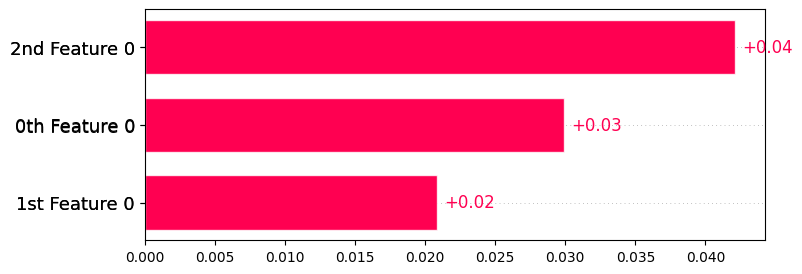

In [ ]:
# Example: Selecting SHAP values for the first class
selected_class_index = 0  # Change this index based on the class you want to analyze
shap_values_class = shap_values_lr[selected_class_index]

# SHAP Summary Plot (Bar) for the selected class
plt.figure(figsize=(12,8))
shap.plots.bar(shap_values_class, max_display=20, show=False)
plt.title(f'SHAP Summary Plot - Logistic Regression (Class: {lr_classifier.classes_[selected_class_index]})')
plt.tight_layout()
plt.show()

# SHAP Summary Plot (Beeswarm) for the selected class
shap.summary_plot(shap_values_class, X_test_np, feature_names=X.columns, show=False)
plt.title(f'SHAP Beeswarm Plot - Logistic Regression (Class: {lr_classifier.classes_[selected_class_index]})')
plt.tight_layout()
plt.show()

# SHAP Dependence Plot for a specific feature in the selected class
feature_to_explain = 'Driving_experience_encoded'  # Ensure this feature exists
shap.dependence_plot(
    feature_to_explain,
    shap_values_class.values,
    X_test_np,
    feature_names=X.columns,
    show=False
)
plt.title(f'SHAP Dependence Plot for {feature_to_explain} - Logistic Regression (Class: {lr_classifier.classes_[selected_class_index]})')
plt.tight_layout()
plt.show()


XAI HELP

In [ ]:

import shap

# Initialize the SHAP Explainer for Logistic Regression with masker
print("\nApplying SHAP for Logistic Regression...")
explainer_shap_lr = shap.LinearExplainer(
    model=lr_classifier,
    masker=shap.maskers.Independent(X_train),
    feature_perturbation="independent"
)

# Compute SHAP values for the test set
shap_values_lr = explainer_shap_lr.shap_values(X_test)

# Verify the structure of SHAP values
num_classes_lr = len(lr_classifier.classes_)
print(f"\nNumber of classes: {num_classes_lr}")
print(f"Class labels: {lr_classifier.classes_}")

# Check the type and shape of shap_values_lr
if isinstance(shap_values_lr, list):
    print(f"SHAP values are a list with {len(shap_values_lr)} elements (one per class).")
    print(f"Shape of SHAP values for first class: {shap_values_lr[0].shape}")
else:
    print(f"Shape of SHAP values: {shap_values_lr.shape}")

# Example: Selecting SHAP values for the first class
selected_class_index_lr = 0  # Change based on the class you want to analyze
shap_values_class_lr = shap_values_lr[selected_class_index_lr]



Applying SHAP for Logistic Regression...


InvalidFeaturePerturbationError: feature_perturbation must be one of 'interventional' or 'correlation_dependent'

In [ ]:
import shap

# Initialize the SHAP Explainer for Decision Tree
print("\nApplying SHAP for Decision Tree...")
explainer_shap_dt = shap.TreeExplainer(dt_classifier)

# Compute SHAP values for the test set
shap_values_dt = explainer_shap_dt.shap_values(X_test)

# Verify the structure of SHAP values
num_classes_dt = len(dt_classifier.classes_)
print(f"\nNumber of classes: {num_classes_dt}")
print(f"Class labels: {dt_classifier.classes_}")

# Check the type and shape of shap_values_dt
if isinstance(shap_values_dt, list):
    print(f"SHAP values are a list with {len(shap_values_dt)} elements (one per class).")
    print(f"Shape of SHAP values for first class: {shap_values_dt[0].shape}")
else:
    print(f"Shape of SHAP values: {shap_values_dt.shape}")

# Example: Selecting SHAP values for the first class
selected_class_index_dt = 0  # Change based on the class you want to analyze
shap_values_class_dt = shap_values_dt[selected_class_index_dt]

# Ensure the selected SHAP values match the shape of X_test
assert shap_values_class_dt.shape == X_test.shape, \
    f"SHAP values shape {shap_values_class_dt.shape} does not match X_test shape {X_test.shape}."



Applying SHAP for Decision Tree...

Number of classes: 3
Class labels: [1 2 3]
Shape of SHAP values: (2464, 113, 3)


AssertionError: SHAP values shape (113, 3) does not match X_test shape (2464, 113).

In [ ]:
# SHAP Summary Plot (Bar) for Decision Tree
plt.figure(figsize=(12,8))
shap.summary_plot(shap_values_class_dt, X_test, plot_type="bar")
plt.title(f'SHAP Summary Plot - Decision Tree (Class: {dt_classifier.classes_[selected_class_index_dt]})')
plt.tight_layout()
plt.show()


AssertionError: The shape of the shap_values matrix does not match the shape of the provided data matrix.

<Figure size 1200x800 with 0 Axes>

In [ ]:
# SHAP Summary Plot (Beeswarm) for Decision Tree
plt.figure(figsize=(12,8))
shap.summary_plot(shap_values_class_dt, X_test, feature_names=X.columns)
plt.title(f'SHAP Beeswarm Plot - Decision Tree (Class: {dt_classifier.classes_[selected_class_index_dt]})')
plt.tight_layout()
plt.show()


AssertionError: The shape of the shap_values matrix does not match the shape of the provided data matrix.

<Figure size 1200x800 with 0 Axes>

In [ ]:
# SHAP Dependence Plot for a specific feature
feature_to_explain_dt = 'Driving_experience_encoded'  # Ensure this feature exists
plt.figure(figsize=(10,6))
shap.dependence_plot(
    feature_to_explain_dt,
    shap_values_class_dt,
    X_test,
    feature_names=X.columns
)
plt.title(f'SHAP Dependence Plot for {feature_to_explain_dt} - Decision Tree (Class: {dt_classifier.classes_[selected_class_index_dt]})')
plt.tight_layout()
plt.show()


IndexError: index 5 is out of bounds for axis 1 with size 3

<Figure size 1000x600 with 0 Axes>

In [ ]:
import shap

# Initialize the SHAP Explainer for Logistic Regression with the correct masker and perturbation
print("\nApplying SHAP for Logistic Regression...")
explainer_shap_lr = shap.LinearExplainer(
    model=lr_classifier,
    masker=shap.maskers.Independent(X_train),
    feature_perturbation="interventional"  # Corrected from "independent" to "interventional"
)

# Compute SHAP values for the test set
shap_values_lr = explainer_shap_lr.shap_values(X_test)

# Verify the structure of SHAP values
num_classes_lr = len(lr_classifier.classes_)
print(f"\nNumber of classes: {num_classes_lr}")
print(f"Class labels: {lr_classifier.classes_}")

# Check the type and shape of shap_values_lr
if isinstance(shap_values_lr, list):
    print(f"SHAP values are a list with {len(shap_values_lr)} elements (one per class).")
    print(f"Shape of SHAP values for first class: {shap_values_lr[0].shape}")
else:
    print(f"Shape of SHAP values: {shap_values_lr.shape}")

# Example: Selecting SHAP values for the first class
selected_class_index_lr = 0  # Change based on the class you want to analyze
shap_values_class_lr = shap_values_lr[selected_class_index_lr]

# Ensure the selected SHAP values match the shape of X_test
assert shap_values_class_lr.shape == X_test.shape, \
    f"SHAP values shape {shap_values_class_lr.shape} does not match X_test shape {X_test.shape}."



Applying SHAP for Logistic Regression...

Number of classes: 3
Class labels: [1 2 3]
Shape of SHAP values: (2464, 113, 3)


AssertionError: SHAP values shape (113, 3) does not match X_test shape (2464, 113).

MORE HELP

In [ ]:
# Check for any remaining missing values
print(X_train_cause.isnull().sum())

# Fill missing values if any are found
X_train_cause.fillna(0, inplace=True)  # Replace NaN with 0 or an appropriate value
X_test_cause.fillna(0, inplace=True)


Number_of_vehicles_involved                          0
Number_of_casualties                                 0
Hour                                                 0
Age_band_of_driver_encoded                           0
Age_band_of_casualty_encoded                         0
                                                    ..
Vehicle_movement_standardized_Unknown                0
Pedestrian_movement_standardized_Not a Pedestrian    0
Pedestrian_movement_standardized_Stationary          0
Pedestrian_movement_standardized_Unknown             0
Pedestrian_movement_standardized_Walking             0
Length: 113, dtype: int64


In [ ]:
# Check data types to confirm all features are numeric
print(X_train_cause.dtypes)

# Convert to numeric if any issues are found
X_train_cause = X_train_cause.apply(pd.to_numeric, errors='coerce')
X_test_cause = X_test_cause.apply(pd.to_numeric, errors='coerce')

# Fill any NaN values that result from coercion
X_train_cause.fillna(0, inplace=True)
X_test_cause.fillna(0, inplace=True)


Number_of_vehicles_involved                          int64
Number_of_casualties                                 int64
Hour                                                 int64
Age_band_of_driver_encoded                           int64
Age_band_of_casualty_encoded                         int64
                                                     ...  
Vehicle_movement_standardized_Unknown                 bool
Pedestrian_movement_standardized_Not a Pedestrian     bool
Pedestrian_movement_standardized_Stationary           bool
Pedestrian_movement_standardized_Unknown              bool
Pedestrian_movement_standardized_Walking              bool
Length: 113, dtype: object


In [ ]:
# Ensure you have installed lime with pip if you haven't already
# !pip install lime

# Import LIME and other necessary libraries
import lime
import lime.lime_tabular

# Create the LIME explainer for tabular data
lime_explainer_cause = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_cause),
    feature_names=X_train_cause.columns,
    class_names=le.classes_,  # Adjust class names if needed
    mode='classification'
)

# Select a specific instance from the test set to explain
i = 0  # You can change this index to any instance in the test set
instance_to_explain = X_test_cause.iloc[i]

# Explain the instance using LIME
lime_exp_cause = lime_explainer_cause.explain_instance(
    data_row=instance_to_explain,
    predict_fn=lr_cause_classifier.predict_proba
)

# Display the LIME explanation
lime_exp_cause.show_in_notebook()


In [ ]:
# Create the LIME explainer for accident severity prediction
lime_explainer_severity = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_severity),
    feature_names=X_train_severity.columns,
    class_names=['Slight Injury', 'Serious Injury', 'Fatal injury'],  # Adjust if needed
    mode='classification'
)

# Select an instance from the test set for explanation
i = 0  # Change this index to any instance you want to explain
instance_to_explain = X_test_severity.iloc[i]

# Explain the instance using LIME
lime_exp_severity = lime_explainer_severity.explain_instance(
    data_row=instance_to_explain,
    predict_fn=lr_severity_classifier.predict_proba
)

# Display the LIME explanation for accident severity
lime_exp_severity.show_in_notebook()


In [ ]:
# Import the updated PDP plotting function
from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt

# Choose features for which you want to generate PDP (adjust feature indices as needed)
features_to_plot_severity = [0, 1, 2]  # Adjust these indices to match your dataset

# Generate and plot Partial Dependence Plots using the new PartialDependenceDisplay
PartialDependenceDisplay.from_estimator(
    estimator=lr_severity_classifier,
    X=X_test_severity,
    features=features_to_plot_severity,
    feature_names=X_test_severity.columns,
    grid_resolution=50
)

plt.show()



ValueError: target must be specified for multi-class

In [ ]:
# Import the updated PDP plotting function
from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt

# Choose features for which you want to generate PDP (adjust feature indices as needed)
features_to_plot_severity = [0, 1, 2]  # Adjust these indices to match your dataset

# Specify the class (target) for which you want to plot PDP (e.g., 0, 1, 2 for different classes)
target_class = 0  # You can change this to 1 or 2 for other classes ('Slight Injury', 'Serious Injury', etc.)

# Generate and plot Partial Dependence Plots for the specified target class
PartialDependenceDisplay.from_estimator(
    estimator=lr_severity_classifier,
    X=X_test_severity,
    features=features_to_plot_severity,
    feature_names=X_test_severity.columns,
    target=target_class,  # Specify the target class for multi-class PDP
    grid_resolution=50
)

plt.show()


ValueError: target not in est.classes_, got 0

In [ ]:
# Check the classes in the model
print(lr_severity_classifier.classes_)


[1 2 3]


In [ ]:
# Check the classes in the model
print(lr_severity_classifier.classes_)


[1 2 3]


In [ ]:
# Check the model's class labels
print(lr_severity_classifier.classes_)




[1 2 3]


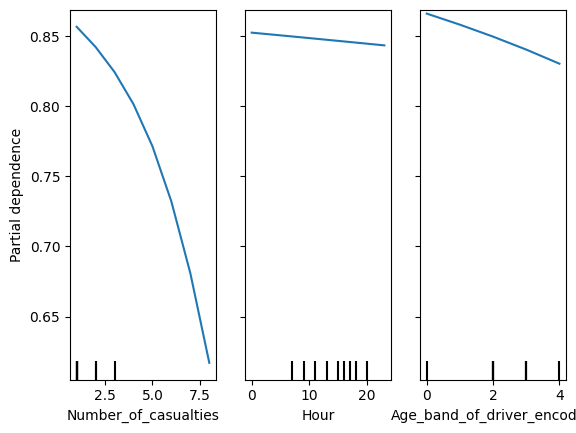

In [ ]:
# Import the updated PDP plotting function
from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt

# Choose features for which you want to generate PDP (adjust feature indices as needed)
features_to_plot_severity = [1,2,3]  # Adjust these indices to match your dataset

# Use the correct target index (e.g., 0 for 'Slight Injury', 1 for 'Serious Injury', etc.)
target_class_index = 1  # Replace with the appropriate index based on the model's classes

# Generate and plot Partial Dependence Plots for the specified target class index
PartialDependenceDisplay.from_estimator(
    estimator=lr_severity_classifier,
    X=X_test_severity,
    features=features_to_plot_severity,
    feature_names=X_test_severity.columns,
    target=target_class_index,  # Use the numeric index here
    grid_resolution=50
)

plt.show()


In [ ]:
# Import necessary libraries
import lime
import lime.lime_tabular
import numpy as np

# Create the LIME explainer for tabular data
lime_explainer_cause = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_cause),
    feature_names=X_train_cause.columns,
    class_names=le.classes_,
    mode='classification'
)

# Select a specific instance from the test set to explain
i = 0  # Index of the instance to explain (can be changed)
instance_to_explain = X_test_cause.iloc[i]

# Explain the instance using LIME
lime_exp_cause = lime_explainer_cause.explain_instance(
    data_row=instance_to_explain,
    predict_fn=lr_cause_classifier.predict_proba
)

# Show the LIME explanation
lime_exp_cause.show_in_notebook()


In [ ]:
# Import PDP library
from sklearn.inspection import plot_partial_dependence
import matplotlib.pyplot as plt

# Select features for which you want to generate PDP
features_to_plot = [0, 1, 2]  # Feature indices to plot PDP for (you can adjust these)

# Generate and plot Partial Dependence Plots
pdp_cause = plot_partial_dependence(
    estimator=lr_cause_classifier,
    X=X_test_cause,
    features=features_to_plot,
    feature_names=X_test_cause.columns,
    grid_resolution=50
)

plt.show()


In [ ]:
# Create the LIME explainer for accident severity prediction
lime_explainer_severity = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_severity),
    feature_names=X_train_severity.columns,
    class_names=['Slight Injury', 'Serious Injury', 'Fatal injury'],  # Adjust as needed
    mode='classification'
)

# Select an instance from the test set for explanation
i = 0  # You can change the index for different instances
instance_to_explain = X_test_severity.iloc[i]

# Explain the instance using LIME
lime_exp_severity = lime_explainer_severity.explain_instance(
    data_row=instance_to_explain,
    predict_fn=lr_severity_classifier.predict_proba
)

# Show the LIME explanation
lime_exp_severity.show_in_notebook()
